# **PROYECTO: OPTIMIZACIÓN DE VALORACIÓN DE AUTOMÓVILES**

**Sector:** Seguros / Automotriz (E-commerce)  
**Tecnologías:** Python, Gradient Boosting, Scikit-learn  

---

Para que tu notebook tenga ese impacto visual y profesional desde el primer segundo (especialmente pensando en reclutadores que verán el repositorio), vamos a transformar esa primera celda en un **Encabezado de Identidad Técnica**.

Aquí tienes la propuesta mejorada. Puedes copiar y pegar este bloque de Markdown en tu primera celda:

---

## **Contexto de Negocio**

El servicio de venta de autos usados **Rusty Bargain** está desarrollando una aplicación de tasación instantánea para atraer nuevos clientes. El objetivo es permitir que cualquier usuario averigüe rápidamente el valor de mercado de su coche basándose en datos históricos, especificaciones técnicas y niveles de equipamiento.

Como ingenieros de datos, nuestra misión es construir un motor de predicción que no solo sea preciso, sino también escalable y eficiente para una plataforma web de alto tráfico.

## **Objetivos técnicos (KPIs)**

Para que el modelo sea viable en producción, evaluaremos los resultados bajo tres pilares fundamentales:

* **Calidad de la Predicción:** Minimizar el **RECM** () para asegurar valoraciones justas.
* **Velocidad de Predicción:** Garantizar una latencia mínima en la respuesta al usuario.
* **Eficiencia de Entrenamiento:** Optimizar los tiempos de cómputo para permitir ciclos de re-entrenamiento frecuentes con datos frescos de mercado.

---

## <a id='indice'></a>**TABLA DE CONTENIDOS**

1. [**INTRODUCCIÓN**](#introduccion)
2. [**SECCIÓN 1: Preparación de datos (EDA)**](#seccion1)
    - [Sección 1.1: Vista general de los datos](#seccion1-1)
    - [Sección 1.2: Análisis de variables](#seccion1-2)
    - [Sección 1.3: Tratamiento de valores Nulos](#seccion1-3)
3. [**SECCIÓN 2: Entrenamiento del modelo**](#seccion2)
    - [Sección 2.1: División de los datos](#seccion2-1)
    - [Sección 2.2: Preparación y estrategia de codificación](#seccion2-2)
    - [Sección 2.3: Métrica de evaluación: RECM](#seccion2-3)
    - [Sección 2.4: Modelo base: Regresión Lineal](#seccion2-4)
    - [Sección 2.5: Modelos basados en árboles](#seccion2-5)
    - [Sección 2.6: Modelos de Potenciación de Gradiente](#seccion2-6)
4. [**SECCIÓN 3: Análisis del modelo**](#seccion3)
    - [Sección 3.1: Modelado y ajuste (Regresión Lineal)](#seccion3-1)
    - [Sección 3.2: Modelado y ajuste (Árboles)](#seccion3-2)
    - [Sección 3.3: Modelado y ajuste (Boosting)](#seccion3-3)
    - [Sección 3.4: Resultados de los entrenamientos](#seccion3-4)
    - [Sección 3.5: Evaluación de modelos](#seccion3-5)
    - [Sección 3.6: Conclusiones](#seccion3-6)
5. [**SECCIÓN 4: Despliegue en la nube (Render/Streamlit)**](#seccion4)
    - [Sección 4.1: El Enfoque de Despliegue Nativo](#seccion4-1)
    - [Sección 4.2: Validación de Integridad de Datos](#seccion4-2)
    - [Sección 4.3: Diseño de `app.py` con Streamlit](#seccion4-3)
    - [Sección 4.4: Implementaciones de lógica en `app.py`](#seccion4-4)
6. [**SECCIÓN 5: Optimizaciones Post-modelado**](#seccion5)
    - [Sección 5.1: Fase de Optimización](#seccion5-1)
    - [Sección 5.2: Fase de Evaluación](#seccion5-2)


In [1]:
# ==============================================================================
# LIBRERÍAS Y CONFIGURACIÓN
# ==============================================================================

# Procesamiento y computación numérica
import os
import pandas as pd
import numpy as np
import time
import joblib
from pathlib import Path

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning: Frameworks y Métricas
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold

# Modelos de Boosting
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# Configuración de visualización
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

## <a id='introduccion'></a>**INTRODUCCIÓN**

Rusty Bargain tiene como objetivo desarrollar un modelo de predicción de precios, esto con el fin de determinar el valor de mercado de vehículos usados de forma rápida y precisa. En un sector donde la latencia de respuesta y la exactitud del cálculo impactan directamente en la satisfacción del cliente y la rentabilidad de la empresa, se ha diseñado un pipeline de ciencia de datos dividido en tres fases críticas:

### 1. Preparación y Limpieza de Datos (EDA)

La Sección 1 (EDA) se centra en el análisis exploratorio y la preparación inicial de los datos. En esta etapa se realiza una limpieza básica orientada a eliminar inconsistencias evidentes, valores atípicos extremos y registros incompletos. Posteriormente, se aplican filtros avanzados de coherencia, basados en conocimiento del dominio, con el fin de asegurar que las observaciones sean plausibles desde el punto de vista real. Estos filtros se aplican principalmente sobre variables críticas como el precio, la potencia del vehículo y el año de registro, reduciendo ruido estructural y mejorando la calidad del conjunto de datos antes del modelado. En esta sección, realizamos un análisis exploratorio profundo centrado en:

- **Limpieza Técnica:** Tratamiento de valores ausentes, duplicados y normalización de tipos de datos.
- **Filtros de Coherencia Logística:** Implementación de restricciones avanzadas basadas en lógica de negocio para eliminar registros con valores físicamente imposibles o erróneos en variables clave como:
- **Precio:** Eliminación de valores atípicos y precios simbólicos ($0).
- **Potencia (CV):** Filtrado de valores irreales para motores estándar.
- **Año de Registro:** Validación cronológica para asegurar datos históricos verídicos.

### 2. Marco de Trabajo y Modelado

En la Sección 2, se presenta la arquitectura de modelado, organizada en tres grandes familias de modelos: regresión lineal, modelos basados en árboles y modelos de potenciación de gradiente. En lugar de implementar cada modelo de forma aislada, se diseñan funciones que encapsulan la lógica común de entrenamiento, medición de tiempos y evaluación, facilitando la comparación directa entre las tres familias de modelos:

- **Regresión Lineal (LR):** Utilizada como nuestro *baseline* estadístico, incluyendo pruebas con transformación logarítmica para manejar la asimetría del target.
- **Modelos Basados en Árboles:** Implementación de *Decision Tree* y *Random Forest* para capturar relaciones no lineales y estructuras jerárquicas en los datos.
- **Modelos de Potenciación de Gradiente (Boosting):** Uso de algoritmos de vanguardia como **XGBoost, LightGBM y CatBoost**, optimizados para manejar grandes volúmenes de datos y variables categóricas de forma nativa.

Dentro de esta sección se define también una función unificada de evaluación, encargada de calcular la raíz del error cuadrático medio (RECM), medir el tiempo de predicción y devolver las predicciones para análisis posteriores. Adicionalmente, se implementa una función estándar de visualización de resultados, que permite contrastar valores reales contra predicciones mediante gráficos de dispersión y líneas de identidad, proporcionando una evaluación visual del desempeño de cada modelo.

$$
RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}
$$

### 3. Estrategia de Experimentación y Optimización

Finalmente, la Sección 3 está dedicada al entrenamiento sistemático de los modelos. Cada familia de algoritmos (excepto la regresión lineal, por su naturaleza paramétrica) se entrena bajo tres aproximaciones distintas de hiperparámetros:

1. **Estándar:** Configuraciones base para establecer un punto de partida rápido.
2. **Balanceada:** Ajustes orientados a la generalización del modelo y la reducción de la varianza (*overfitting*).
3. **High Performance:** Búsqueda exhaustiva de la precisión máxima, sacrificando tiempo de cómputo por la menor tasa de error posible.

Esta metodología nos permite identificar la **frontera de eficiencia**, seleccionando el modelo que ofrezca el mejor equilibrio entre calidad predictiva y velocidad operativa para las necesidades reales de **Rusty Bargain**.

> **Advertencia sobre la Volatilidad de las Métricas de Rendimiento:**
> Es fundamental considerar que las métricas de Tiempo de Entrenamiento y Tiempo de Predicción reportadas en este estudio son altamente dependientes del entorno de ejecución (runtime environment). A diferencia del RECM, que es una métrica matemática estable, los tiempos pueden variar significativamente bajo las siguientes condiciones:
> 
> 1. Arquitectura de Hardware
> 2. Entorno de Ejecución (Local vs. Nube)
> 3. Optimización de Librerías
>
> El "Mejor Modelo" elegido en este proyecto se basa en el equilibrio (trade-off) observado bajo las condiciones actuales. Si este pipeline se traslada a otro entorno de ejecución la jerarquía de eficiencia podría verse afectada.

---
[⬆ Volver al Índice](#indice)

## <a id='seccion1'></a>**SECCIÓN 1:** *Preparación de datos (EDA)*

**Aspectos básicos a tratar:**

- Formato de columnas
- Valores faltantes NaN´s: Ver métodos de imputación
- Duplicados: ¿Hay filas idénticas que sesguen el modelo?
- Coherencia de Datos (Sanity Checks)

---

**Análsis de variables - NUMÉRICAS:**

- Variables numéricas:
    - Detectar escalas
    - Valores imposibles
    - Distribuciones raras

- Variables típicas:
    - Power
    - Mileage
    - RegistrationYear
    - RegistrationMonth
    - NumberOfPictures

- Preguntas clave:
    - ¿Existen ceros que no tienen sentido físico?
    - ¿Existen valores fuera del rango humano/industrial razonable?

---

**Análsis de variables - CATEGÓRICAS:**

- Variables categóricas:
    - Entender cardinalidad
    - Detectar categorías raras o vacías
    - Preparar decisiones de codificación (Modelos lineales lo requerirán)

- Variables típicas: 
    - VehicleType
    - Gearbox
    - FuelType
    - Brand
    - Model
    - NotRepaired

- Preguntas clave:
    - ¿Cuántas categorías hay?
    - ¿Existen categorías con muy pocos registros?
    - ¿Los NaN representan “desconocido” o “no aplica”?

---

**Gráficos para inspección:**

- Histogramas: Aplicable a datos numéricos continuos
    - Forma y distribución de los datos
 
- Boxplots: Detección de outliers y validación de estadísticas rápidas
    - Cuartiles y puntos fuera de rango (bigotes), comprobaremos rápidamente valores extremos.

- Barplots (Categóricos): Desbalance de clases (si existe)
    - Principalmente categórias como `brand` o `fuel_type`

---

**Tratamiento de valores anómalos:**

- Variable objetivo:
    - Valor anómalo: `price = 0`
 
- Valores anómalos en variables numéricas, ejemplo:
    - `Power = 0`
    - `Mileage = 0`
    - `RegistrationYear > año actual`

- Valores anómalos en variables categóricas, ejemplo:
    - `VehicleType = NaN`
    - `Gearbox = NaN`
    - Interpretación: Muchas veces significa “desconocido”, no error

---
[⬆ Volver al Índice](#indice)

### <a id='seccion1-1'></a>**Sección 1.1:** *Vista general de los datos*

In [2]:
BASE_DIR = r'D:\Data\Projects\car_price_prediction'

DATA_PATH = os.path.join(BASE_DIR, 'data', 'car_data.csv')

data = pd.read_csv(DATA_PATH)

data.info(DATA_PATH)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   DateCrawled        354369 non-null  object
 1   Price              354369 non-null  int64 
 2   VehicleType        316879 non-null  object
 3   RegistrationYear   354369 non-null  int64 
 4   Gearbox            334536 non-null  object
 5   Power              354369 non-null  int64 
 6   Model              334664 non-null  object
 7   Mileage            354369 non-null  int64 
 8   RegistrationMonth  354369 non-null  int64 
 9   FuelType           321474 non-null  object
 10  Brand              354369 non-null  object
 11  NotRepaired        283215 non-null  object
 12  DateCreated        354369 non-null  object
 13  NumberOfPictures   354369 non-null  int64 
 14  PostalCode         354369 non-null  int64 
 15  LastSeen           354369 non-null  object
dtypes: int64(7), object(

In [3]:
data.sample(5)

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Mileage,RegistrationMonth,FuelType,Brand,NotRepaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
270352,05/03/2016 14:51,2350,sedan,2003,manual,95,a_klasse,150000,7,gasoline,mercedes_benz,no,05/03/2016 00:00,0,57076,07/04/2016 10:45
224573,14/03/2016 18:45,7850,sedan,2015,manual,71,other,5000,11,petrol,mitsubishi,NaN,14/03/2016 00:00,0,53881,15/03/2016 13:48
135334,22/03/2016 21:37,999,small,2005,manual,52,matiz,100000,4,petrol,daewoo,no,22/03/2016 00:00,0,36199,06/04/2016 16:16
223799,25/03/2016 15:42,900,sedan,1996,manual,90,civic,150000,3,petrol,honda,no,25/03/2016 00:00,0,47443,06/04/2016 19:16
346550,03/04/2016 16:47,4900,sedan,2003,auto,220,a4,150000,4,petrol,audi,no,03/04/2016 00:00,0,54293,05/04/2016 16:45


**Comentarios:**

Basados en la información aobtenida podemos hacer una clasificación rápida según los tipos de variables ubicadas.

- A. Variables Temporales (Fechas): Aunque, actualmente son `object` (texto), lo cual es inútil para el cálculo numérico, no se requieren para los modelos de aprendizaje, por lo tanto se eliminarán posteriormente
    - `DateCrawled`
    - `DateCreated`
    - `LastSeen`

- B. Variables Categóricas (Cualitativas): Describen características del vehículo.
    - `VehicleType`
    - `Gearbox`
    - `Model`
    - `FuelType`
    - `Brand`
    - `NotRepaired`
    - `PostalCode` - (Es una etiqueta geográfica, elimminar)
    - `RegistrationMonth` (Cíclica/Categórica).

- C. Variables Numéricas (Cuantitativas): Magnitudes físicas reales.
    - `Price` (Variable Objetivo / Target)
    - `RegistrationYear`
    - `Power`
    - `Mileage`
    - `NumberOfPictures` (Eliminar, no tiene utilidad).

### <a id='seccion1-2'></a>**Sección 1.2:** *Análisis de variables*

- **Esta sección incluye inspección y tratamiento de valores anómalos**

[⬆ Volver al Índice](#indice)

In [4]:
# Eliminación de variables innecesarias

df_data = data.copy()

# Copia solo para consultas de referencia
df_reference_data = data.copy()

df_data = df_data.drop(
    columns=['DateCrawled', 'DateCreated', 'LastSeen', 'PostalCode', 'NumberOfPictures'],
    axis=1
)

print(df_data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Price              354369 non-null  int64 
 1   VehicleType        316879 non-null  object
 2   RegistrationYear   354369 non-null  int64 
 3   Gearbox            334536 non-null  object
 4   Power              354369 non-null  int64 
 5   Model              334664 non-null  object
 6   Mileage            354369 non-null  int64 
 7   RegistrationMonth  354369 non-null  int64 
 8   FuelType           321474 non-null  object
 9   Brand              354369 non-null  object
 10  NotRepaired        283215 non-null  object
dtypes: int64(5), object(6)
memory usage: 29.7+ MB
None


#### **1.2.1 Análisis de variables** - `Price` (Target)

Para garantizar la calidad del modelo, se aplicaron dos criterios de limpieza en el precio

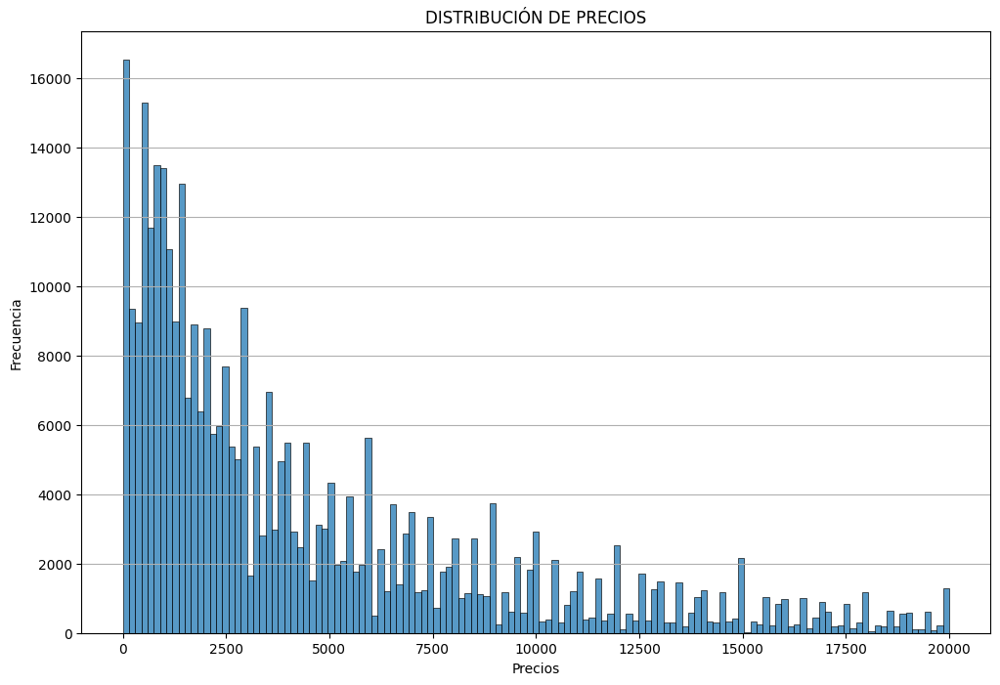

In [5]:
plt.figure(figsize=(12, 8))

sns.histplot(
    data=df_data,
    x='Price'
)

plt.title('DISTRIBUCIÓN DE PRECIOS')
plt.xlabel('Precios')
plt.ylabel('Frecuencia')
plt.grid(axis='y')

plt.show()


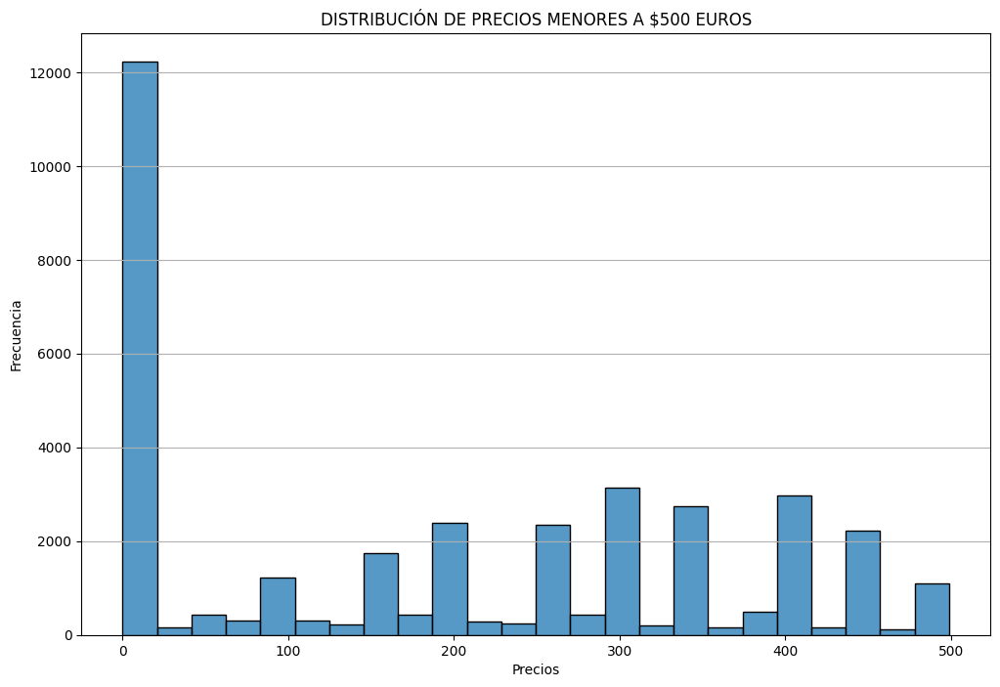

In [6]:
lower_prices = df_data['Price'] < 500

plt.figure(figsize=(12, 8))

sns.histplot(
    data=df_data[lower_prices],
    x='Price'
)

plt.title('DISTRIBUCIÓN DE PRECIOS MENORES A $500 EUROS')
plt.xlabel('Precios')
plt.ylabel('Frecuencia')
plt.grid(axis='y')

plt.show()

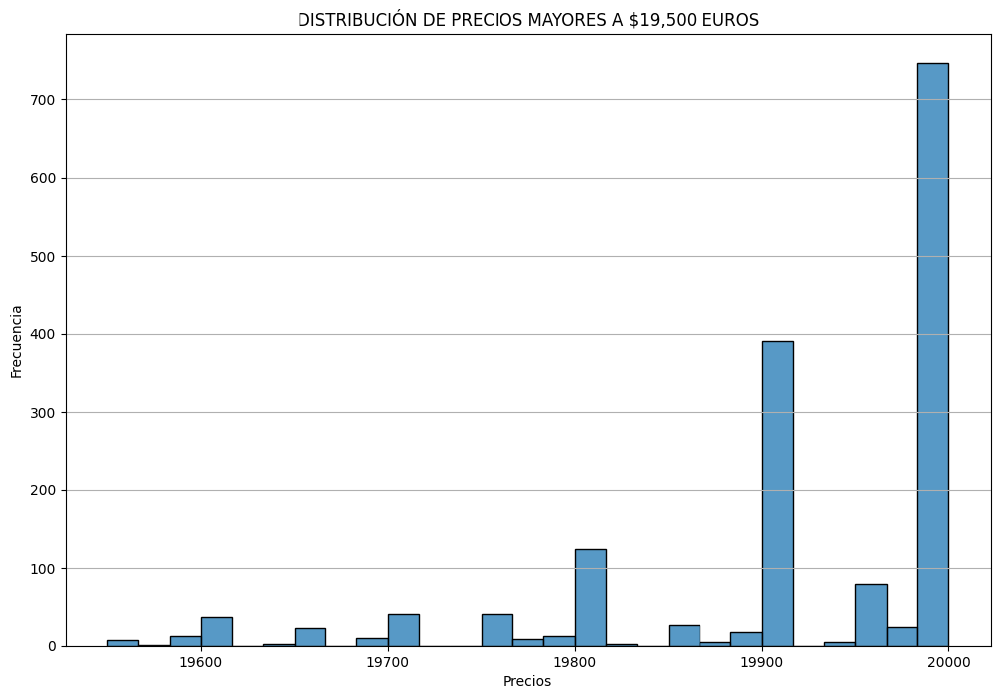

In [7]:
maximum_prices = df_data['Price'] > 19500

plt.figure(figsize=(12, 8))

sns.histplot(
    data=df_data[maximum_prices],
    x='Price'
)

plt.title('DISTRIBUCIÓN DE PRECIOS MAYORES A $19,500 EUROS')
plt.xlabel('Precios')
plt.ylabel('Frecuencia')
plt.grid(axis='y')

plt.show()


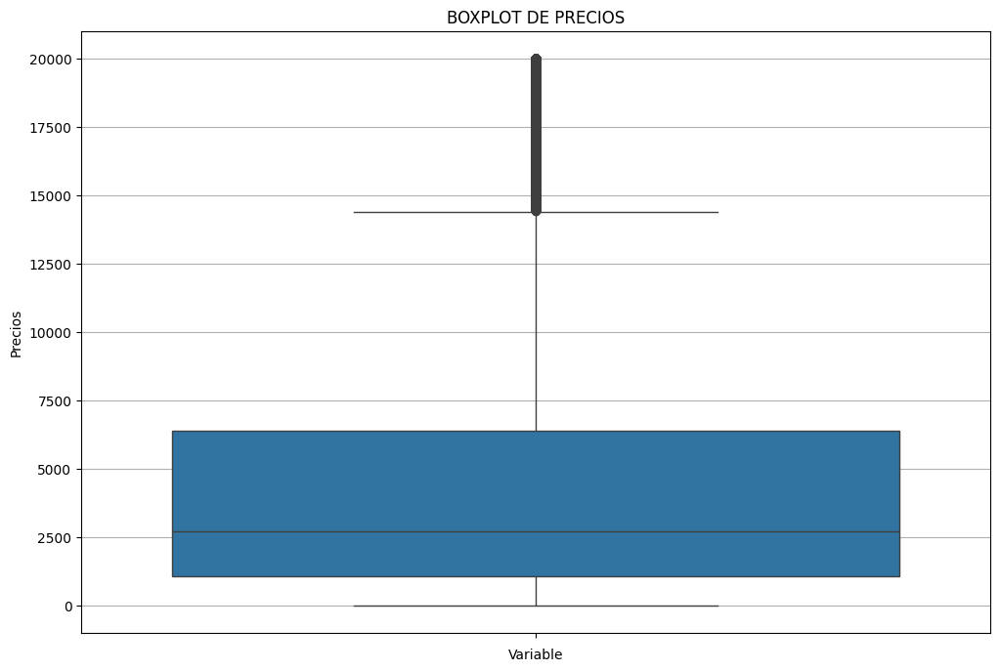

In [8]:
plt.figure(figsize=(12, 8))

sns.boxplot(
    y=df_data['Price']
)

plt.title('BOXPLOT DE PRECIOS')
plt.xlabel('Variable')
plt.ylabel('Precios')
plt.grid(axis='y')

plt.show()

In [9]:
BM_1 = df_data['Price'] == 0
print(f'Cantidad total de vehículos con valor $0:', BM_1.sum())
#print()
#print(df_data[BM_1])


Cantidad total de vehículos con valor $0: 10772


In [10]:
BM_2 = df_data['Price'] == 20000
print(f'Cantidad total de vehículos con valor de $20,000:', BM_2.sum())

Cantidad total de vehículos con valor de $20,000: 268


In [11]:
df_data[BM_2].sample(10)

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Mileage,RegistrationMonth,FuelType,Brand,NotRepaired
1515,20000,sedan,2010,auto,239,a6,150000,5,gasoline,audi,no
90354,20000,convertible,2003,manual,170,a4,150000,5,petrol,audi,no
13360,20000,coupe,2004,manual,325,crossfire,125000,3,petrol,chrysler,no
307575,20000,small,2013,auto,140,1er,30000,4,gasoline,bmw,no
69441,20000,wagon,2008,auto,231,3er,150000,5,gasoline,bmw,no
168868,20000,coupe,2010,auto,354,other,150000,4,petrol,audi,no
26103,20000,suv,2016,auto,155,rav,5000,3,hybrid,toyota,no
312216,20000,suv,2008,auto,190,range_rover_sport,90000,5,gasoline,land_rover,no
166379,20000,bus,2014,manual,150,other,20000,12,petrol,ford,no
18312,20000,wagon,2011,manual,250,insignia,50000,9,petrol,opel,no


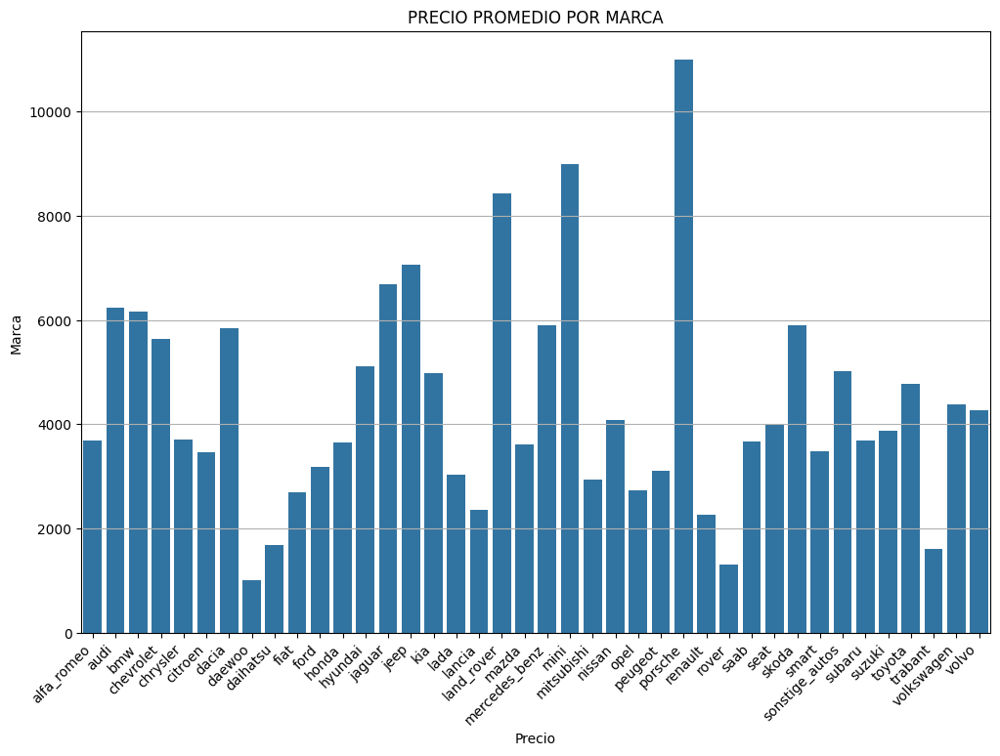

-----------------------------------------------------------
             Brand     Avg_Price  Min_Price  Max_Price
26         porsche  10994.670185          0      20000
21            mini   8992.646159          0      20000
18      land_rover   8429.365138          0      20000
14            jeep   7065.096012          0      20000
13          jaguar   6685.538614          0      20000
1             audi   6239.976507          0      20000
2              bmw   6162.214661          0      20000
20   mercedes_benz   5910.507614          0      20000
31           skoda   5909.606727          0      20000
6            dacia   5839.654444          0      19990
3        chevrolet   5639.312429          0      20000
12         hyundai   5108.007248          0      19999
33  sonstige_autos   5026.058684          0      20000
15             kia   4981.772414          0      20000
36          toyota   4771.252063          0      20000
38      volkswagen   4381.277070          0      20000
39   

In [12]:
# === Precio promedio por marca ===

avg_price_per_brand = df_data.groupby(by='Brand')['Price'].mean().reset_index()
#print(avg_price_per_brand)

plt.figure(figsize=(12, 8))
sns.barplot(
    data=avg_price_per_brand,
    x='Brand',
    y='Price'
)

plt.xticks(rotation=45, ha='right')
plt.title('PRECIO PROMEDIO POR MARCA')
plt.xlabel('Precio')
plt.ylabel('Marca')
plt.grid(axis='y')

plt.show()

print('-----------------------------------------------------------')

# === Estadísticas generales ===

# Agrupamos por marca y pedimos: promedio, mínimo y máximo
stats_per_brand = df_data.groupby('Brand')['Price'].agg(['mean', 'min', 'max']).reset_index()

# Renombramos para que sea más claro
stats_per_brand.columns = ['Brand', 'Avg_Price', 'Min_Price', 'Max_Price']

# Ordenamos por promedio para que el gráfico sea legible
stats_per_brand = stats_per_brand.sort_values(by='Avg_Price', ascending=False)

print(stats_per_brand)

**Comentarios:**

- Basados en la información se ha tomado la decisión de eliminar todos los registros con `price = 0`
- Referente a los vehículos con `Price = 20000` sólo se mantendrán los vehículos de ese precio que correspondan a marcas Luxury, descartando registros de marcas generalistas con precios de $20,000 Euros.
    - Se muestran 3 ejemplos de marcas Luxury y 3 de marcas generalistas (precios irreales)

In [13]:
#  Ejemplos de marcas Luxury

# Ejemplo 1: Porsche
BM_3 = (df_data['Brand'] == 'porsche') & (df_data['Price']==20000)
print(df_data[BM_3][['Brand', 'Model', 'Price']].sample(3))

# Ejemplo 2: Audi
BM_4 = (df_data['Brand'] == 'audi') & (df_data['Price']==20000)
print('\n', df_data[BM_4][['Brand', 'Model', 'Price']].sample(3))

# Ejemplo 3: BMW
BM_5 = (df_data['Brand'] == 'bmw') & (df_data['Price']==20000)
print('\n', df_data[BM_5][['Brand', 'Model', 'Price']].sample(3))


          Brand    Model  Price
11325   porsche  cayenne  20000
324540  porsche      911  20000
237733  porsche    other  20000

        Brand Model  Price
16074   audi    a1  20000
278536  audi    a5  20000
148452  audi    a8  20000

        Brand Model  Price
57567    bmw   1er  20000
36300    bmw   3er  20000
197617   bmw   3er  20000


In [14]:
#  Ejemplos de marcas Generalistas

# Ejemplo 1: Toyota
BM_6 = (df_data['Brand'] == 'toyota') & (df_data['Price']==20000)
print(df_data[BM_6][['Brand', 'Model', 'Price']])

# Ejemplo 2: Chevrolet
BM_7 = (df_data['Brand'] == 'chevrolet') & (df_data['Price']==20000)
print('\n', df_data[BM_7][['Brand', 'Model', 'Price']])

# Ejemplo 3: Ford
BM_8 = (df_data['Brand'] == 'ford') & (df_data['Price']==20000)
print('\n', df_data[BM_8][['Brand', 'Model', 'Price']])

         Brand  Model  Price
26103   toyota    rav  20000
113554  toyota  auris  20000
238872  toyota  other  20000
264442  toyota  other  20000

             Brand  Model  Price
111560  chevrolet    NaN  20000
243538  chevrolet  other  20000

        Brand    Model  Price
32859   ford  mustang  20000
80766   ford   mondeo  20000
101861  ford    other  20000
166379  ford    other  20000


In [15]:
# === Eliminación de valores anómalos: (Price) ===

# Eliminado registros con 'Price' = $0
BM_9 = df_data['Price'] > 0
df_data = df_data[BM_9]

print('Filas con precios $0:', (df_data['Price']==0).sum())

Filas con precios $0: 0


In [16]:
# Eliminando precios de $20,000 en marcas generalistas

# Retomamos de las estadísticas generales a las marcas con mayor precio promedio y que cuentan con
# autos valuados en $20,000

brands = stats_per_brand['Brand'].reset_index(drop=True)
luxury_brands = list(brands.iloc[0:8])
print('Estas marcas corresponden con precios de $20,000 Euros\n', luxury_brands)

# Marcamos 'True' para todas las marcas que NO son de lujo (generalistas) y que cuestan $20,000
BM_10 = ~df_data['Brand'].isin(luxury_brands)
BM_11 = df_data['Price'] == 20000
filtro_1 = BM_10 & BM_11

print('\nCantidad de registros a eliminar (Marcas generalistas con precios de $20,000):', filtro_1.sum())

# Eliminar todos los datos con las condiciones anteriores: usar ~ para no conservar los datos que 
# cumplen con esas condiciones de filtrado, de lo contrario nos quedaríamos sólo con los datos que
# cumplen esas condiciones de filtrado
df_data = df_data[~filtro_1]

Estas marcas corresponden con precios de $20,000 Euros
 ['porsche', 'mini', 'land_rover', 'jeep', 'jaguar', 'audi', 'bmw', 'mercedes_benz']

Cantidad de registros a eliminar (Marcas generalistas con precios de $20,000): 105


**Comentarios:**

1. **Eliminación de Precios Nulos:** Se eliminaron registros con `Price == 0`, ya que representan datos faltantes o errores de entrada que no aportan información al valor de mercado.
2. **Tratamiento de Outliers en Marcas Generalistas:** Se detectó una anomalía de registros con precio exacto de **$20,000** (valor tope del dataset) en marcas no categorizadas como "luxury".
* **Lógica:** Si el auto es de marca generalista (definida por `~isin(luxury_brands)`) **Y** su precio es el tope de \$20,000, se considera un valor poco fiable o un error de redondeo y se procede a su eliminación.

**Nota técnica sobre la máscara booleana:** Utilizamos el operador de negación `~` sobre la combinación de ambas condiciones para conservar únicamente los registros que **no** cumplen el criterio de error, limpiando así el dataset de forma eficiente.


#### **1.2.2 Análisis de variables** - `VehicleType`

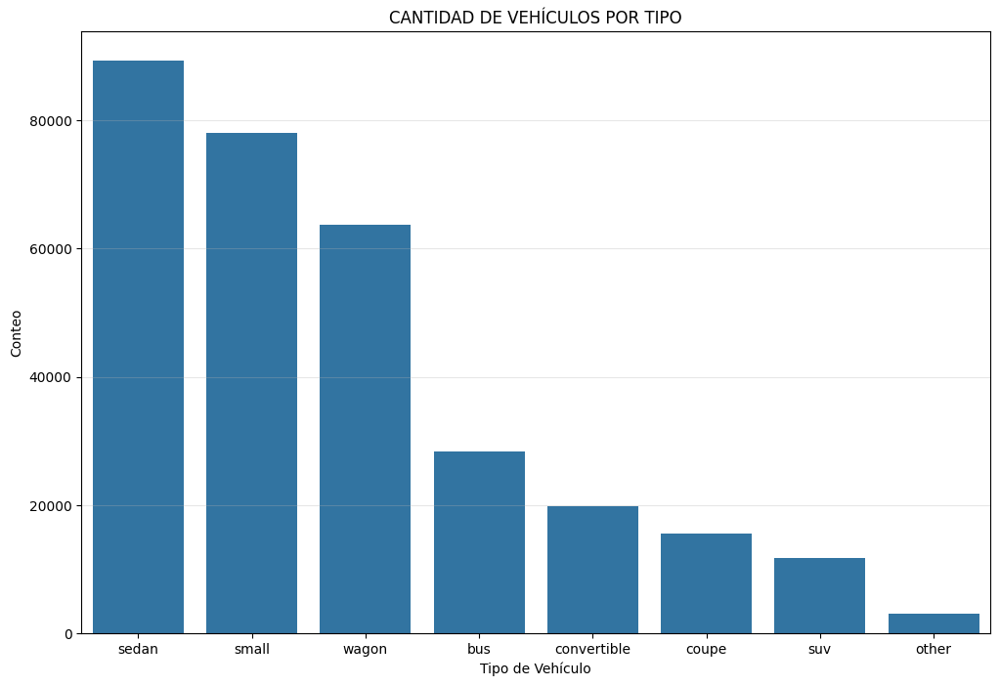

In [17]:
vihicle_type_counts = df_data['VehicleType'].value_counts().reset_index()
vihicle_type_counts.columns = ['VehicleType', 'count']

plt.figure(figsize=(12, 8))
sns.barplot(
    data=vihicle_type_counts,
    x='VehicleType',
    y='count'
)


plt.title('CANTIDAD DE VEHÍCULOS POR TIPO')
plt.xlabel('Tipo de Vehículo')
plt.ylabel('Conteo')
plt.grid(axis='y', alpha=0.3)

plt.show()

#### **1.2.3 Análisis de variables** - `RegistrationYear`

In [18]:
df_reference_data['DateCrawled'] = pd.to_datetime(df_reference_data['DateCrawled'], format='%d/%m/%Y %H:%M')

upper_limit = df_reference_data['DateCrawled'].dt.year.max()

print('Máximo año que se descargó el perfil de la base de datos:', upper_limit)


Máximo año que se descargó el perfil de la base de datos: 2016


**Comentarios:** Referente al límite superior (tope de años permitido) en los datos para la columna `RegistrationYear`. Si la base de datos se descargó como máximo en 2016 para algún registro en específico, es imposible que exista un registro real de un coche cuya fecha de registro sea 2017 o 2018.

Cualquier valor de `RegistrationYear` superior al año máximo de `DateCrawled` es, por definición, un error de entrada de datos o ruido. Un coche no puede ser registrado en el futuro respecto al momento en que se tomó la "fotografía" de los datos.

Existen riesgos si dejamos años posteriores al 2016:

- El modelo pensará que esos autos son "más nuevos" de lo que realmente eran en 2016.
- Al entrenar, el modelo intentará encontrar una relación entre un año "futuro" y un precio actual, lo cual confundirá la lógica de depreciación.
- Esos años actuarán como valores atípicos que pueden mover la línea de regresión de forma incorrecta.

Autos con año de registro mayor al 2016



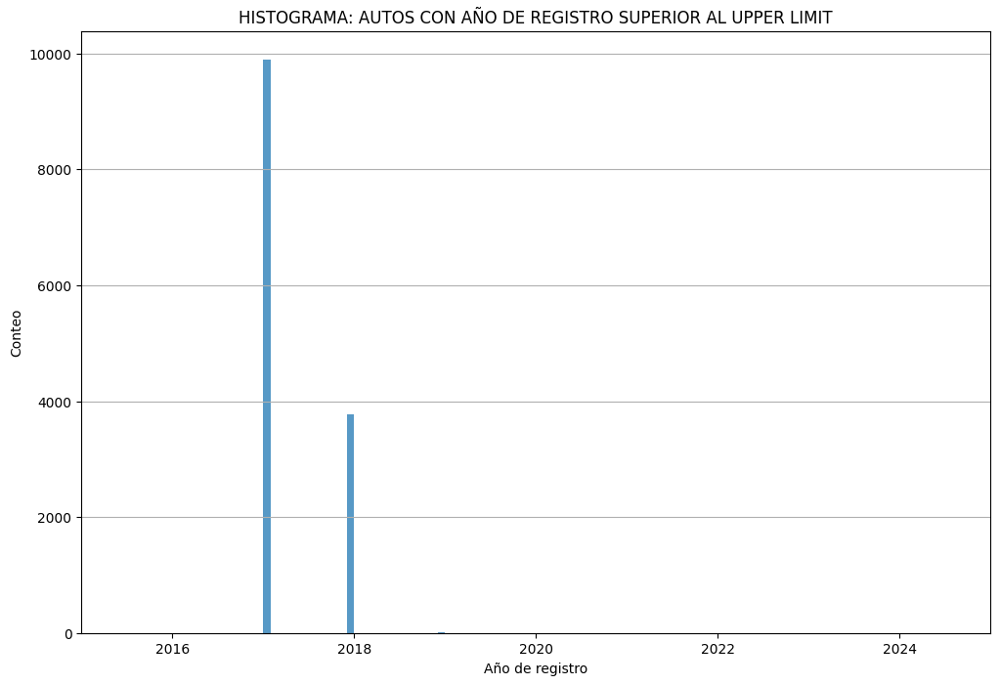

In [19]:
BM_12 = (df_data['RegistrationYear'] > upper_limit) 

df_data[BM_12].sample(10)

print('Autos con año de registro mayor al 2016\n')

plt.figure(figsize=(12, 8))
sns.histplot(
    data=df_data[BM_12]['RegistrationYear']
)

plt.title('HISTOGRAMA: AUTOS CON AÑO DE REGISTRO SUPERIOR AL UPPER LIMIT')
plt.xlabel('Año de registro')
plt.ylabel('Conteo')
plt.xlim(2015, 2025)
plt.grid(axis='y')
plt.show()



In [20]:
print('El número de vehículos con año de registro mayor al 2016 es:', BM_12.sum())

print(df_data[BM_12].sample(5))


El número de vehículos con año de registro mayor al 2016 es: 13776
        Price VehicleType  RegistrationYear Gearbox  Power     Model  Mileage  \
215476    630         NaN              2017  manual     82  a_klasse   150000   
329736   1700         NaN              2017    auto      0       NaN   125000   
171609    850         NaN              2017  manual    115    mondeo   150000   
151018   1000         NaN              2017  manual     56     corsa   150000   
4197     6700         NaN              2017     NaN    131    sharan   150000   

        RegistrationMonth  FuelType          Brand NotRepaired  
215476                  0    petrol  mercedes_benz          no  
329736                 12    petrol     volkswagen         NaN  
171609                  8       NaN           ford          no  
151018                  7    petrol           opel          no  
4197                   10  gasoline     volkswagen         NaN  


Autos con año de registro menor a 1950



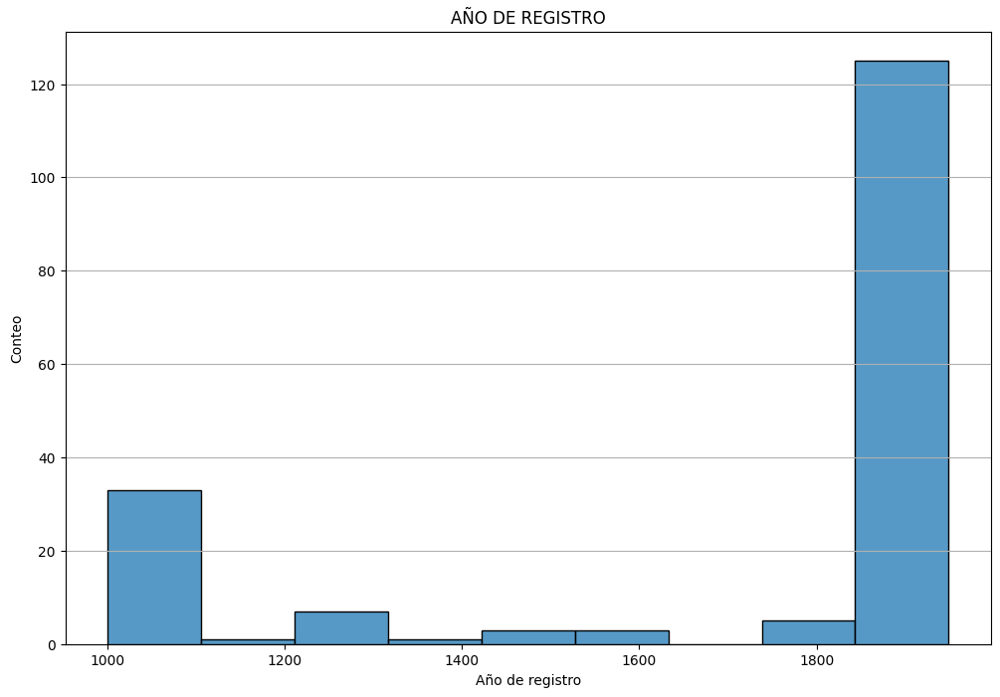

In [21]:
BM_13 = df_data['RegistrationYear'] < 1950

df_data[BM_13].sample(10)

print('Autos con año de registro menor a 1950\n')

plt.figure(figsize=(12, 8))
sns.histplot(
    data=df_data[BM_13]['RegistrationYear']
)

plt.title('AÑO DE REGISTRO')
plt.xlabel('Año de registro')
plt.ylabel('Conteo')
plt.grid(axis='y')
plt.show()


In [22]:
print('Número de autos con año de registro menor a 1950:', BM_13.sum())
print(df_data[BM_13].sample(5))


Número de autos con año de registro menor a 1950: 178
        Price VehicleType  RegistrationYear Gearbox  Power  Model  Mileage  \
183779    500         NaN              1000     NaN      0    NaN     5000   
323443     30         NaN              1000     NaN      0    NaN     5000   
224891    500         NaN              1910  manual      0    NaN     5000   
112768   2500         NaN              1000     NaN      0    NaN     5000   
145609      1       other              1934    auto      0  other     5000   

        RegistrationMonth FuelType           Brand NotRepaired  
183779                  1      NaN  sonstige_autos         NaN  
323443                  0      NaN            audi         NaN  
224891                  0      NaN  sonstige_autos          no  
112768                  0      NaN         trabant          no  
145609                  7   petrol         citroen         NaN  


In [23]:
# Eliminación de valores inconsistentes

df_data = df_data[~BM_13 & ~BM_12]

print(df_data.info())

<class 'pandas.core.frame.DataFrame'>
Index: 329538 entries, 0 to 354368
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Price              329538 non-null  int64 
 1   VehicleType        309646 non-null  object
 2   RegistrationYear   329538 non-null  int64 
 3   Gearbox            314001 non-null  object
 4   Power              329538 non-null  int64 
 5   Model              313972 non-null  object
 6   Mileage            329538 non-null  int64 
 7   RegistrationMonth  329538 non-null  int64 
 8   FuelType           305423 non-null  object
 9   Brand              329538 non-null  object
 10  NotRepaired        269745 non-null  object
dtypes: int64(5), object(6)
memory usage: 30.2+ MB
None


**Nota técnica:** Sobre el uso de `~`

- `~BM_13`: Significa "No quiero los que son menores a 1950" (es decir, quédate con los ≥1950).
- `~BM_12`: Significa "No quiero los que son mayores al límite de descarga" (es decir, quédate con los ≤2016).

#### **1.2.4 Análisis de variables** - `Gearbox`

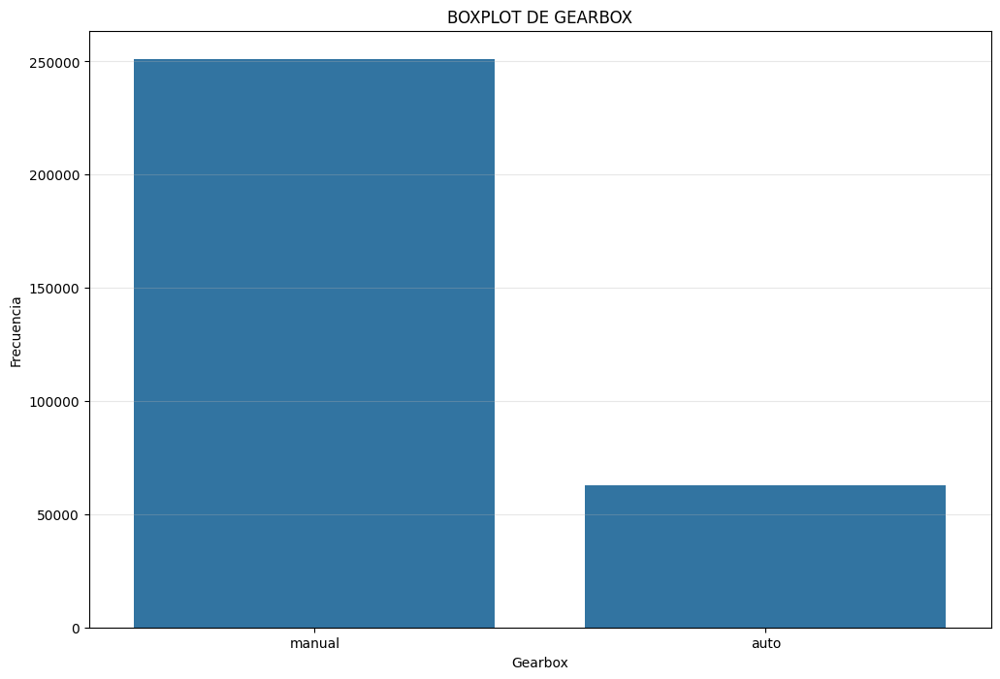

In [24]:
gearbox_count = df_data['Gearbox'].value_counts().reset_index()

plt.figure(figsize=(12,8))
sns.barplot(
    data=gearbox_count,
    x='Gearbox',
    y='count'
)

plt.title('BOXPLOT DE GEARBOX')
plt.ylabel('Frecuencia')
plt.grid(axis='y', alpha=0.3)

plt.show()


#### **1.2.5 Análisis de variables** - `Power`

In [25]:
#print(luxury_brands)
BM_14 = df_data['Power'] > 500

print('El número de unidades con potencia mayor a 500 Hp es:', BM_14.sum())

print(df_data[BM_14].sample(5))

El número de unidades con potencia mayor a 500 Hp es: 392
        Price VehicleType  RegistrationYear Gearbox  Power   Model  Mileage  \
84680    5000       wagon              2007  manual   1055   astra   125000   
53953     550       small              2000  manual   1360   other   150000   
207383   2100       small              2002  manual   1399  fiesta   150000   
223201   1600       sedan              1998  manual   1500  passat   150000   
249460   4899         bus              2009  manual    907   other   150000   

        RegistrationMonth  FuelType       Brand NotRepaired  
84680                   8    petrol        opel          no  
53953                   1    petrol     citroen         yes  
207383                 10  gasoline        ford          no  
223201                  0    petrol  volkswagen          no  
249460                 11  gasoline     citroen          no  


In [26]:
for brand in luxury_brands:
    BM_15 = df_data['Brand'] == brand
    print(f'\nVehículos de la marca {brand.upper()} con potencia mayor a 500 HP')
    print(df_data[BM_14 & BM_15][['Brand', 'Model', 'Power']])



Vehículos de la marca PORSCHE con potencia mayor a 500 HP
          Brand    Model  Power
20145   porsche  cayenne    521
82421   porsche  cayenne    521
96747   porsche  cayenne    521
173074  porsche  cayenne    521
344689  porsche  cayenne    521

Vehículos de la marca MINI con potencia mayor a 500 HP
       Brand   Model  Power
143118  mini  cooper   6018
164518  mini  cooper   1598
323887  mini  cooper   1707

Vehículos de la marca LAND_ROVER con potencia mayor a 500 HP
Empty DataFrame
Columns: [Brand, Model, Power]
Index: []

Vehículos de la marca JEEP con potencia mayor a 500 HP
Empty DataFrame
Columns: [Brand, Model, Power]
Index: []

Vehículos de la marca JAGUAR con potencia mayor a 500 HP
         Brand   Model  Power
13373   jaguar  s_type    600
146339  jaguar  s_type    600
162460  jaguar  s_type    600

Vehículos de la marca AUDI con potencia mayor a 500 HP
       Brand  Model  Power
23173   audi  other    610
23188   audi  other    504
32693   audi     a8    515
43600  

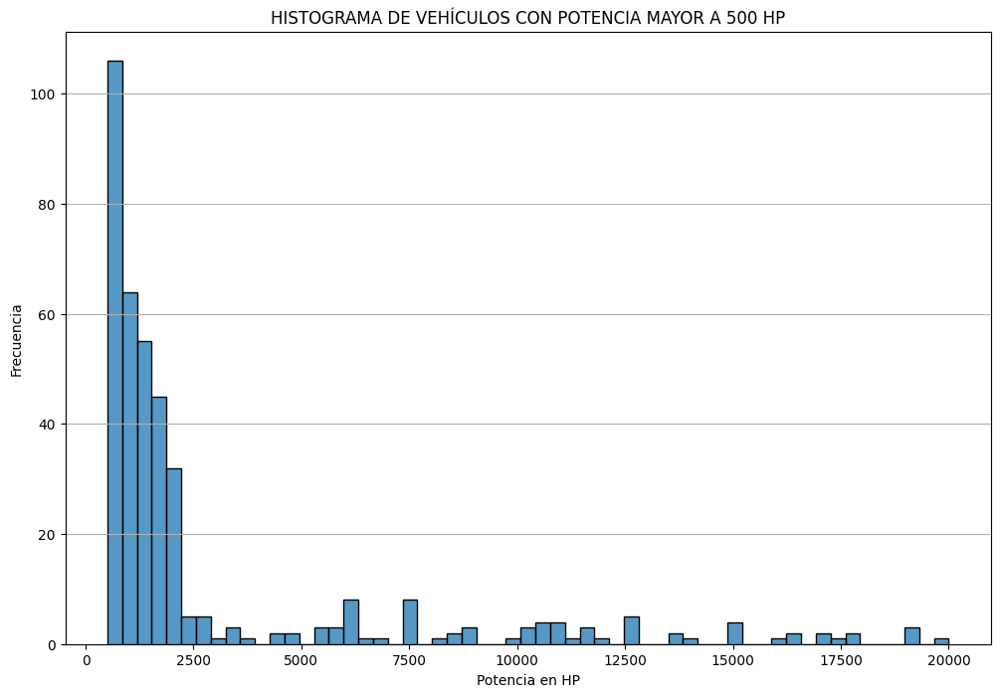

In [27]:
plt.figure(figsize=(12,8))
sns.histplot(
    data=df_data[BM_14],
    x='Power'
)

plt.title('HISTOGRAMA DE VEHÍCULOS CON POTENCIA MAYOR A 500 HP')
plt.xlabel('Potencia en HP')
plt.ylabel('Frecuencia')
plt.grid(axis='y')

plt.show()


In [28]:
BM_16 = (df_data['Power'] > 0) & (df_data['Power'] <= 50)

print('El número de unidades con potencia menor a 50 Hp es (Descartando registros de 0 HP):', BM_16.sum())
print(df_data[BM_16].sample(5))


El número de unidades con potencia menor a 50 Hp es (Descartando registros de 0 HP): 9773
        Price VehicleType  RegistrationYear Gearbox  Power   Model  Mileage  \
127875   1900       small              1993  manual     45   panda   125000   
236144    444       small              1995  manual     45    polo   150000   
91532    3300       small              2007    auto     50  fortwo    60000   
204034    750       small              1999  manual     50   arosa   150000   
38665    1300       sedan              1977  manual     26     NaN    40000   

        RegistrationMonth FuelType       Brand NotRepaired  
127875                  0   petrol        fiat          no  
236144                  2   petrol  volkswagen          no  
91532                   5   petrol       smart          no  
204034                 11   petrol        seat          no  
38665                  10   petrol     trabant          no  


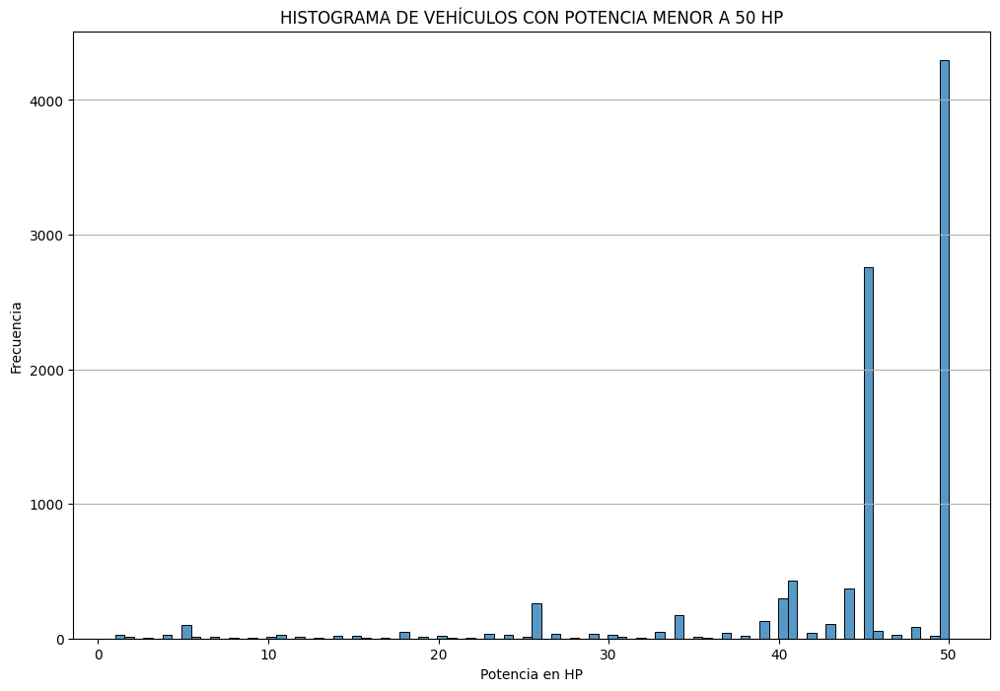

In [29]:
plt.figure(figsize=(12,8))
sns.histplot(
    data=df_data[BM_16],
    x='Power'
)

plt.title('HISTOGRAMA DE VEHÍCULOS CON POTENCIA MENOR A 50 HP')
plt.xlabel('Potencia en HP')
plt.ylabel('Frecuencia')
plt.grid(axis='y')

plt.show()


**Comentarios:** Respecto al filtrado de potencia se partirá de dos límites, superior e inferior:

- Límite superior: Establece que el límite superior en cuanto a potencia es 600 HP
    - Filtro de refinamiento para límite superior: Si el auto NO es de lujo (`Brand` not in `luxury_brands`) pero tiene más de 400 HP, es un error".

- Límite inferior: Establecido a 10 HP
    - Se han encontrado autos clásicos que cuentan con una potencia relativamente baja, pero aún así, por encima de los 10 HP. Por ejemplo, un Citroën 2CV puede tener entre 9 y 29 HP, y un Fiat 500 clásico ronda los 13-18 HP. Se tienen referencias del muestreo aleatorio que justifican un límite superior a 10 HP:
        - Trabant 601 (26 HP): Un auto histórico de la Alemania del Este. Es un dato real.
        - Smart Fortwo (41 HP): Es la potencia real de las versiones diésel (CDI) o las primeras versiones de gasolina. Dato real.
        - VW Polo (45-50 HP): Las motorizaciones 1.0 de los años 90 tenían exactamente esa potencia. Dato real.

> Al bajar el límite a 10 HP, se estaría rescatando casi 10,000 registros que son perfectamente válidos y que tienen una relación lógica entre su baja potencia y su precio (que suele ser bajo o de coleccionista).

In [30]:
print('Estadísticas de Power antes de los filtros aplicados:')

df_data['Power'].describe()

Estadísticas de Power antes de los filtros aplicados:


count    329538.000000
mean        111.917964
std         184.881595
min           0.000000
25%          71.000000
50%         105.000000
75%         143.000000
max       20000.000000
Name: Power, dtype: float64

In [31]:
# Límites de potencia en HP
power_upper_limit = 600
power_lower_limit = 10

# Filtrado de datos
#df_data = df_data[df_data['Power'].between(power_lower_limit, power_upper_limit)].copy()

BM_17 = df_data['Power'] < 10
BM_18 = df_data['Power'] > 600
df_data = df_data[~BM_17 & ~BM_18]

# Visualizando registros
BM_19 = df_data['Power'] < 50

print(f'Registros entre {power_lower_limit} HP y 50 HP:\n',
     df_data[BM_19][['Brand', 'Model', 'Power']].sample(10))


Registros entre 10 HP y 50 HP:
              Brand   Model  Power
157929  volkswagen  kaefer     34
76873        smart  fortwo     41
204977       smart  fortwo     45
37075         ford  fiesta     45
329169  volkswagen    lupo     34
78263   volkswagen    polo     45
170878        opel  kadett     45
35287   volkswagen    polo     40
184969        opel   corsa     44
142841  volkswagen    polo     44


**Comentarios:** El filtro de refinamiento tiene sus bases tomando en cuenta las siguiente consideraciones:

- Inconsistencia Mecánica: Vehículos del segmento "Small" o "City Car" (como el Renault Twingo o el Chevrolet Matiz) no poseen motores de fábrica que superen los 100-150 HP.
    - *Un registro de 541 HP para estos modelos es, objetivamente, un error de entrada de datos*

- Validación de Excepciones: No todos los autos de marcas "no-luxury" son de baja potencia. Modelos como el **VW Phaeton (W12)** o el **Chrysler 300C (SRT8)** son excepciones mecánicas reales. El refinamiento permitió conservar estos datos valiosos que un filtro global de 400 HP habría eliminado injustamente.

- Justificación técnica para los modelos de ML:
    - Estos 63 registros representan outliers contextuales que pueden degradar significativamente el desempeño del modelo.
    - Al eliminar estos puntos, reducimos la varianza del dataset, permitiendo que el modelo se enfoque en la tendencia real del mercado.

In [32]:
BM_20 = (~df_data['Brand'].isin(luxury_brands)) & (df_data['Power'] > 400)

print('Estadísitcas para autos con potencia mayor a 400 HP (No Luxury):\n', 
      df_data[BM_20]['Power'].describe())

print('\nConteo de modelos para autos con potencia mayor a 400 HP (No Luxury):\n', 
      df_data[BM_20]['Model'].value_counts())

Estadísitcas para autos con potencia mayor a 400 HP (No Luxury):
 count     63.000000
mean     464.730159
std       56.524105
min      401.000000
25%      420.000000
50%      450.000000
75%      500.000000
max      600.000000
Name: Power, dtype: float64

Conteo de modelos para autos con potencia mayor a 400 HP (No Luxury):
 Model
other      11
phaeton    11
golf        9
300c        3
polo        2
twingo      2
leon        2
touareg     2
mustang     2
matiz       1
3_reihe     1
passat      1
corsa       1
vectra      1
1_reihe     1
galaxy      1
impreza     1
Name: count, dtype: int64


In [33]:
print('Muestra aleatoria para autos con potencia mayor a 400 HP (No Luxury):\n',
      df_data[BM_20][['Brand', 'Model', 'RegistrationYear', 'Power']].sample(5))

Muestra aleatoria para autos con potencia mayor a 400 HP (No Luxury):
                  Brand    Model  RegistrationYear  Power
156609      volkswagen  phaeton              2002    420
55278   sonstige_autos      NaN              2009    401
348280        chrysler     300c              2006    431
152546       chevrolet    matiz              2005    584
141655  sonstige_autos      NaN              2005    500


In [34]:
# Filtro detallado
real_high_power_no_luxury = ['phaeton', '300c', 'mustang', 'touareg']

BM_21 = (
    (~df_data['Brand'].isin(luxury_brands)) &
    (~df_data['Model'].isin(real_high_power_no_luxury)) &
    (df_data['Power'] > 400)
)

print(f'Número de registros a eliminarse con filtro detallado: {BM_21.sum()}')

df_data = df_data[~BM_21]

Número de registros a eliminarse con filtro detallado: 45


In [35]:
print('Estadísticas de Power despúes de los filtros aplicados:')

df_data['Power'].describe()

Estadísticas de Power despúes de los filtros aplicados:


count    296186.000000
mean        120.596888
std          53.644523
min          10.000000
25%          75.000000
50%         111.000000
75%         150.000000
max         600.000000
Name: Power, dtype: float64

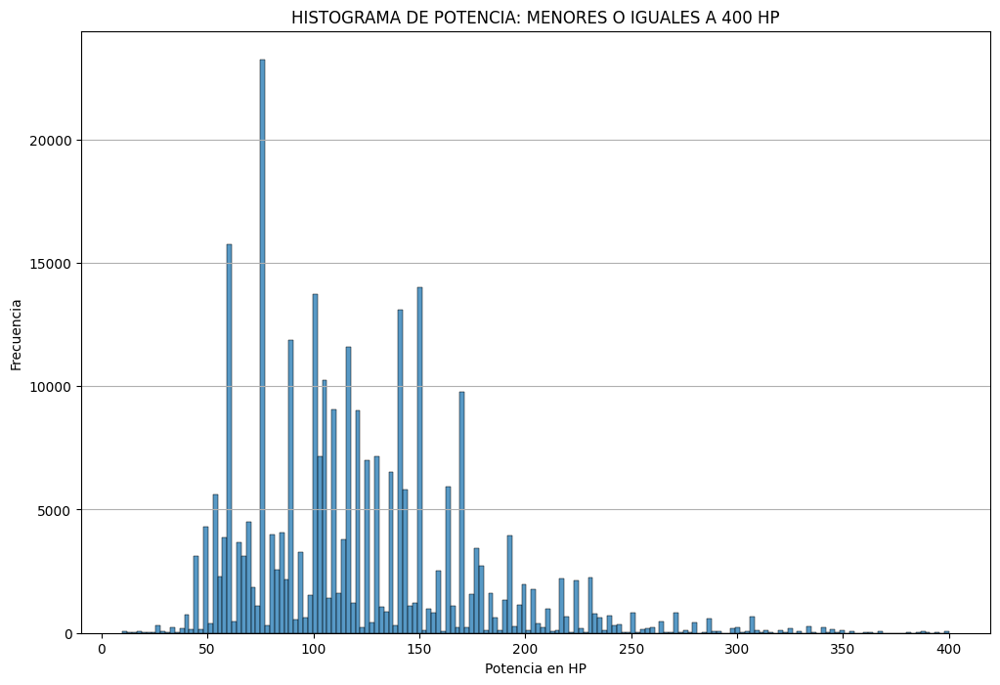

In [36]:

BM_22 = df_data['Power'] <= 400

plt.figure(figsize=(12, 8))
sns.histplot(
    data=df_data[BM_22],
    x='Power'
)

plt.title('HISTOGRAMA DE POTENCIA: MENORES O IGUALES A 400 HP')
plt.xlabel('Potencia en HP')
plt.ylabel('Frecuencia')
plt.grid(axis='y')

plt.show()


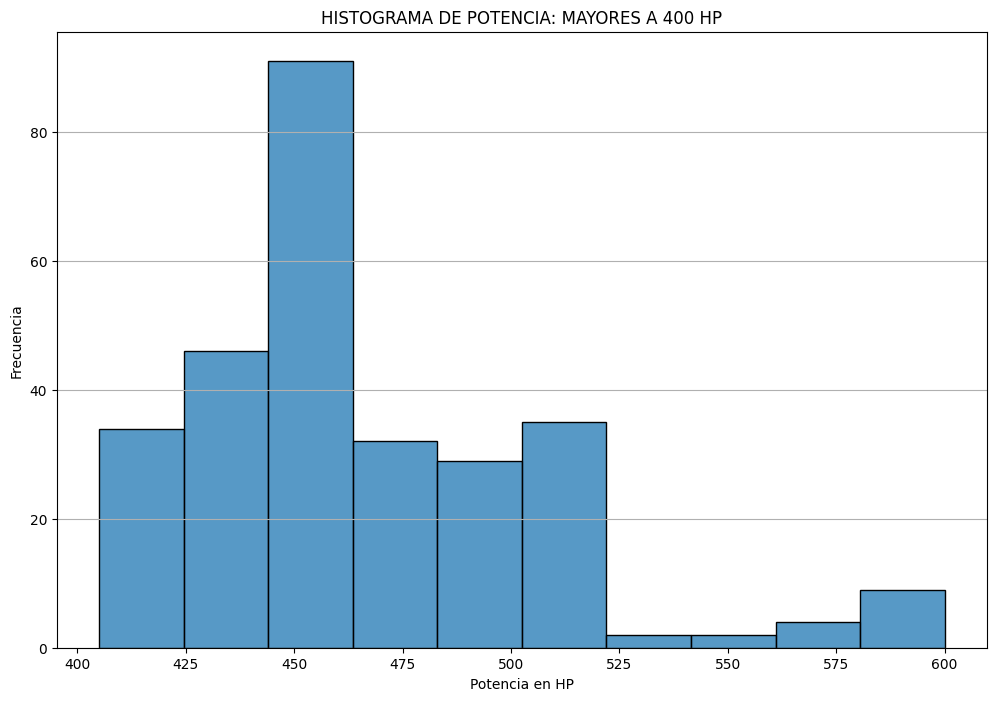

In [37]:
BM_23 = df_data['Power'] > 400

plt.figure(figsize=(12, 8))
sns.histplot(
    data=df_data[BM_23],
    x='Power'
)

plt.title('HISTOGRAMA DE POTENCIA: MAYORES A 400 HP')
plt.xlabel('Potencia en HP')
plt.ylabel('Frecuencia')
plt.grid(axis='y')

plt.show()

**Comentarios:** 
- El cambio más evidente se muestra en la desviación estándar:
    - Antes: `std = 184.88`
    - Después: `std = 53.64`

> La desviación estándar para Power se redujo casi 4 veces. En el dataset original, la dispersión era tan alta que el promedio (111) no era representativo porque estaba "tironeado" por valores absurdos de 20,000 HP. Ahora, con una std de 53, el modelo tiene una base mucho más estable y predecible para aprender.

- Medidas de tendencia central (estabilizadas):
    - Antes: Media (111.9) vs. Mediana (105).
    - Después: Media (120.5) vs. Mediana (111).

> La media subó, aunque esto parece contraintuitivo (ya que eliminamos valores de 20,000 HP), la media subió porque eliminamos los 42,000 registros de 0 HP que estaban "hundiendo" el promedio hacia abajo.



#### **1.2.6 Análisis de variables** - `Brand` & `Model`

In [38]:
grouped_by_BrandModel = df_data.groupby(by='Brand')['Model'].nunique().sort_values(ascending=False)
print(grouped_by_BrandModel)

Brand
volkswagen        22
mercedes_benz     18
audi              16
opel              16
ford              14
bmw               10
seat              10
renault           10
fiat              10
volvo              9
nissan             9
land_rover         9
toyota             8
mazda              8
mitsubishi         7
citroen            7
skoda              7
lancia             7
daihatsu           7
kia                7
alfa_romeo         6
peugeot            6
chrysler           6
chevrolet          5
daewoo             5
dacia              5
rover              5
subaru             5
honda              5
hyundai            5
jeep               4
lada               4
suzuki             4
mini               4
smart              4
porsche            4
jaguar             3
saab               3
trabant            2
sonstige_autos     0
Name: Model, dtype: int64


In [39]:
for brand in brands:
    BM_i = df_data['Brand'] == brand
    print(f'\nEstos son los modelos de la marca {brand.upper()}:\n', df_data[BM_i]['Model'].dropna().unique())


Estos son los modelos de la marca PORSCHE:
 ['boxster' 'other' '911' 'cayenne']

Estos son los modelos de la marca MINI:
 ['one' 'cooper' 'other' 'clubman']

Estos son los modelos de la marca LAND_ROVER:
 ['discovery' 'freelander' 'defender' 'range_rover' 'serie_2'
 'range_rover_sport' 'other' 'range_rover_evoque' 'serie_3']

Estos son los modelos de la marca JEEP:
 ['grand' 'wrangler' 'cherokee' 'other']

Estos son los modelos de la marca JAGUAR:
 ['other' 'x_type' 's_type']

Estos son los modelos de la marca AUDI:
 ['a8' 'a1' 'a4' 'tt' 'a6' '80' 'a3' 'a2' 'a5' 'other' '90' '100' 'q7' 'q3'
 '200' 'q5']

Estos son los modelos de la marca BMW:
 ['3er' '5er' '1er' '7er' 'z_reihe' '6er' 'x_reihe' 'other' 'm_reihe' 'i3']

Estos son los modelos de la marca MERCEDES_BENZ:
 ['a_klasse' 'other' 'e_klasse' 'b_klasse' 'c_klasse' 'vito' 'sprinter'
 'slk' 'viano' 's_klasse' 'sl' 'clk' 'v_klasse' 'm_klasse' 'cl' 'g_klasse'
 'glk' 'gl']

Estos son los modelos de la marca SKODA:
 ['fabia' 'yeti' 'oc

#### **1.2.7 Análisis de variables** - `Mileage`

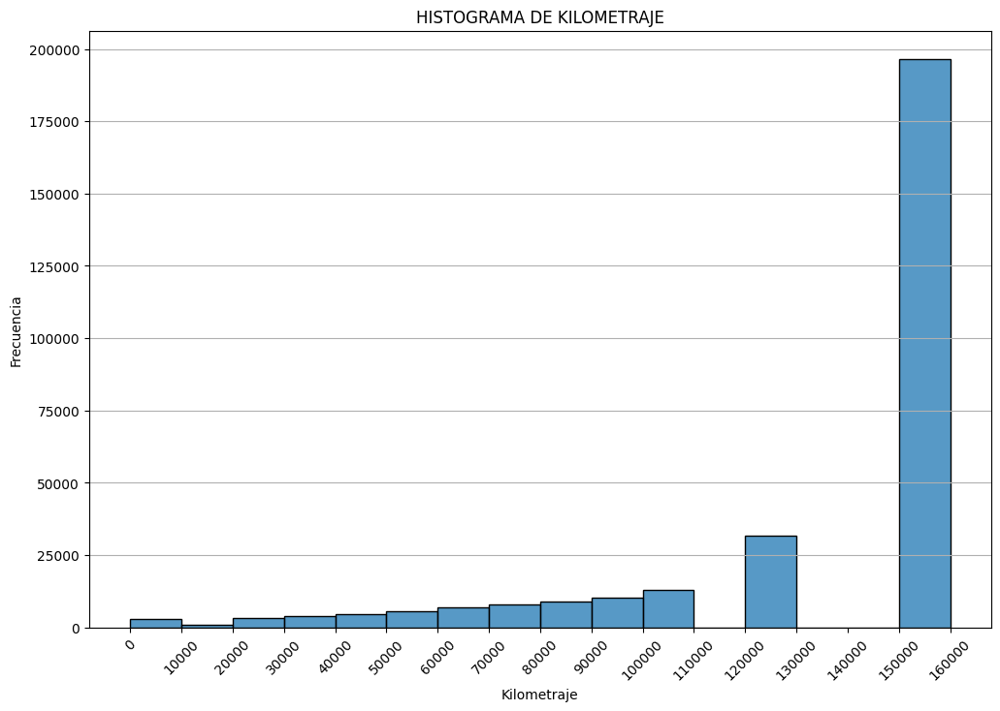

In [40]:
plt.figure(figsize=(12, 8))
sns.histplot(
    data=df_data,
    x='Mileage',
    bins=range(0, 170000, 10000)
)

plt.title('HISTOGRAMA DE KILOMETRAJE')
plt.xlabel('Kilometraje')
plt.ylabel('Frecuencia')
plt.xticks(range(0, 170000, 10000), rotation=45)
plt.grid(axis='y')

plt.show()

#### **1.2.8 Análisis de variables** - `FuelType`

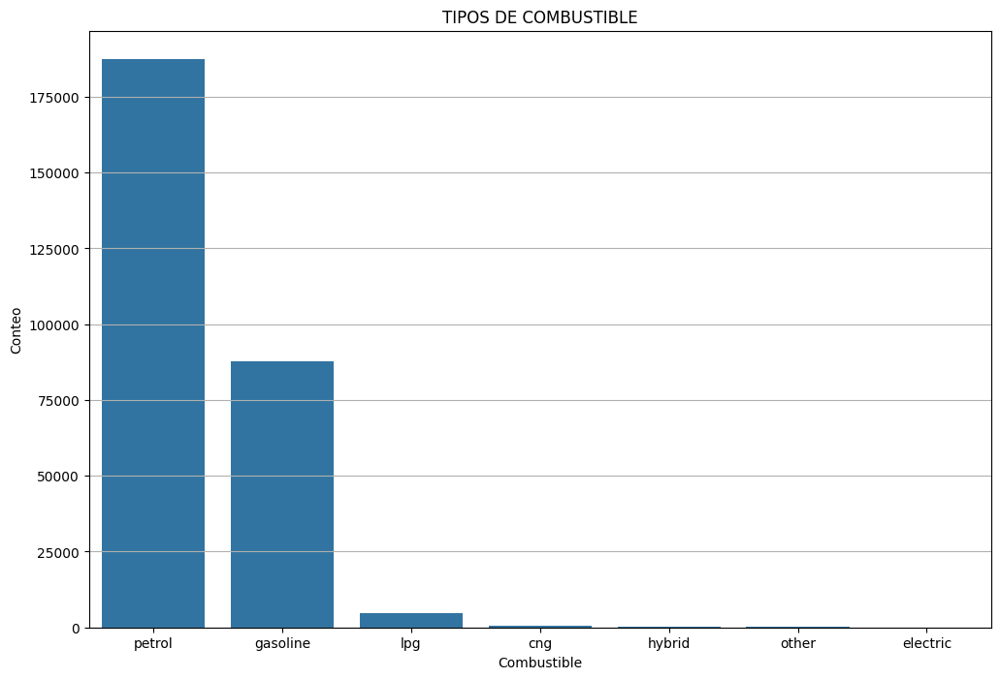

In [41]:
fueltype_counts = df_data['FuelType'].value_counts().reset_index()
fueltype_counts.columns = ['FuelType', 'count']

plt.figure(figsize=(12, 8))
sns.barplot(
    data=fueltype_counts,
    x='FuelType',
    y='count'
)

plt.title('TIPOS DE COMBUSTIBLE')
plt.xlabel('Combustible')
plt.ylabel('Conteo')
plt.grid(axis='y')

plt.show()

#### **1.2.9 Análisis de variables** - `NotRepaired`

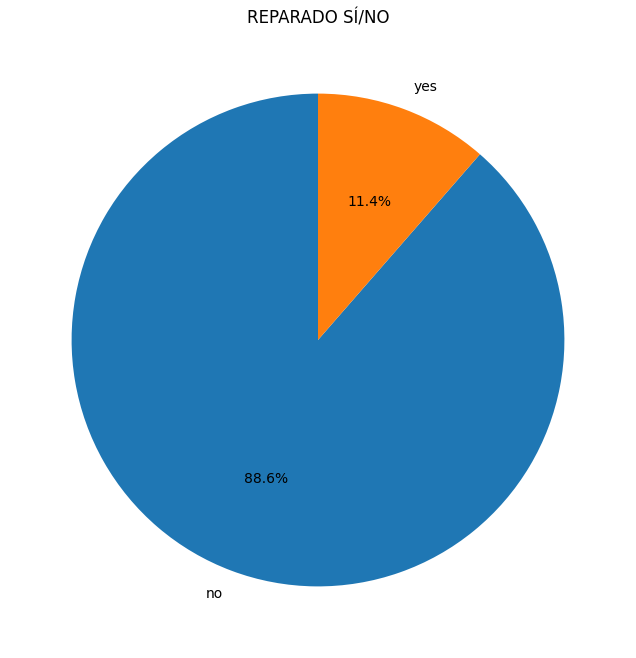

In [42]:
NotRepaired_counts = df_data['NotRepaired'].value_counts()

plt.figure(figsize=(12, 8))
plt.pie(
    NotRepaired_counts,
    labels=NotRepaired_counts.index,
    autopct='%1.1f%%',
    startangle=90

)

plt.title('REPARADO SÍ/NO')

plt.show()

### <a id='seccion1-3'></a>**Sección 1.3:** *Tratamiento de valores Nulos*

La justificación para tratar valores nulos recae en el hecho de que muchos modelos de ML, como Regresión Lineal o XGBoost no cuentan con capacidad para lidiar con este tipo de valores. 

No se contempla directamente la eliminación de los valores NaN, ya que supone eliminar como mínimo 42,862 registros (al rededor del 14% del dataset), es por ello que se tomarán acciones lógicas para minimar el impacto de estos valores nulos.

---
[⬆ Volver al Índice](#indice)

In [43]:
print('La cantidad de valores nulos por columna es:\n')
df_data.isna().sum()

La cantidad de valores nulos por columna es:



Price                    0
VehicleType          11022
RegistrationYear         0
Gearbox               5371
Power                    0
Model                11014
Mileage                  0
RegistrationMonth        0
FuelType             15539
Brand                    0
NotRepaired          42862
dtype: int64

#### **1.3.1 Tratamiento de valores nulos** - *Columna `NotRepaired`*

Esta es la columna con más valores nulos (`NotRepaired`). Se toma en cuenta el sesgo en el que generalmente, si un auto no ha tenido reparaciones, el vendedor suele dejar el campo vacío, mientras que si las ha tenido, está obligado a informarlo.

- **Acción:** Sustituir NaN's con `unknown`
- **Justificación:** Borrar directamente 42k filas equivale a perder 14% del dataset, crear una categoría nueva permite que el modelo aprenda si el "vacío" tiene un impacto en el precio.

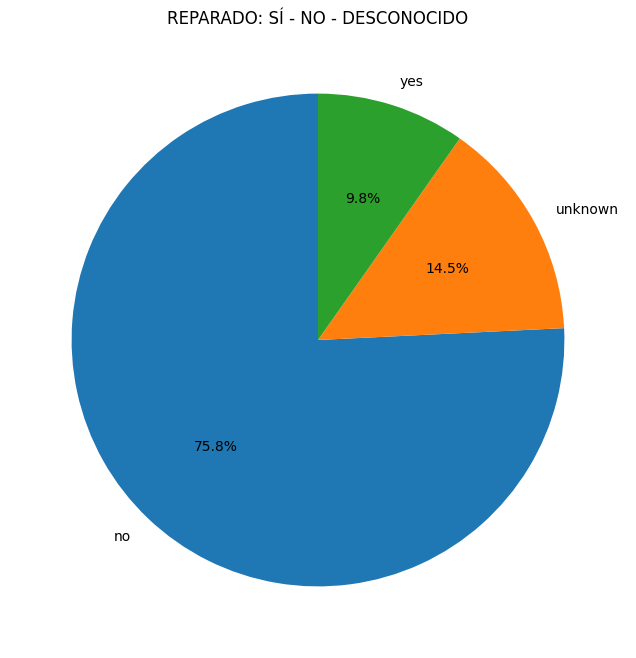

In [44]:
df_data['NotRepaired'] = df_data['NotRepaired'].fillna('unknown')

NotRepaired_counts_2 = df_data['NotRepaired'].value_counts()

plt.figure(figsize=(12, 8))
plt.pie(
    NotRepaired_counts_2.values,
    labels=NotRepaired_counts_2.index,
    autopct='%1.1f%%',
    startangle=90
)

plt.title('REPARADO: SÍ - NO - DESCONOCIDO')

plt.show()

#### **1.3.2 Tratamiento de valores nulos** - *Columna `Model`*

Sin el modelo, es difícil inferir el resto de las características mecánicas.

- **Acción:** Sustituir por `other`, categoría que ya existe dentro de la columna `Model`
- **Justificación:** Al ya tener la marca (`Brand`), podemos agrupar los nulos en una categoría genérica de esa marca.


> **Nota:** No existe un solo registro en el que tanto `Brand` como `Model` sean NaN al mismo tiempo, por lo tanto, al menos cada `Brand` con un NaN identificado puede reetiquetarse como `other`.

In [45]:
BM_24 = (df_data['Model'].isna()) & (df_data['Brand'].isna())
BM_25 = df_data['Model'] == 'other'

print('Cantidad de registros en los que tanto Brand como Model son NaN:', BM_24.sum())
print('Cantidad de registros previamente ya cuentan con la etiqueta other:', BM_25.sum())

Cantidad de registros en los que tanto Brand como Model son NaN: 0
Cantidad de registros previamente ya cuentan con la etiqueta other: 20397


In [46]:
df_data['Model'] = df_data['Model'].fillna('other')
BM_26 = df_data['Model'] == 'other'

print('Cantidad de registros con la etiqueta other después de la imputación:', BM_26.sum())

Cantidad de registros con la etiqueta other después de la imputación: 31411


#### **1.3.3 Tratamiento de valores nulos** - *Columnas `VehicleType`, `Gearbox` y `FuelType`*

Estas 3 dependen directamente del modelo del auto, por lo tanto se pude realizar una imputación por moda según `Brand` y `Model`.

Esta limpieza es fundamental por una razón técnica de coherencia. En el caso de optar por imputar los NaN's con `unknown` el modelo de Machine Learning (como LightGBM o Random Forest) tendría que aprender qué significa `unknown`. Al imputar la moda real del modelo, le estamos dando al algoritmo una señal más clara y menos ruidosa, lo que reduce el error de predicción en los modelos de ML.

In [47]:
cols_to_fix = ['VehicleType', 'Gearbox', 'FuelType']

for col in cols_to_fix:
    print(f'Procesando columna {col}...')

    # 1. Calcular MODA para cada combinación de de 'Brand' y 'Model' 
    # Output: Tabla de referencia lookup table
    mode_lookup = df_data.groupby(['Brand', 'Model'])[col].apply(
        lambda x: x.mode()[0] if not x.mode().empty else 'unknown'
    ).reset_index()

    # 2. Renombramos la columna de la moda para no confundirla
    mode_lookup.rename(
        columns={col : 'mode_value'},
        inplace=True
    )

    # 3. Unión temporal de la moda con df original
    df_data = df_data.merge(
        mode_lookup,
        on=['Brand', 'Model'],
        how='left'
    )

    # 4. Imputamos los NaN's de la columna original con los valores de la columna 'mode_value'
    df_data[col] = df_data[col].fillna(df_data['mode_value'])

    # 5. Eliminamos la columna auxiliar y los nulos que queden (si la moda fue 'unknown')
    df_data.drop(
        columns=['mode_value'],
        inplace=True
    )

    df_data[col] = df_data[col].fillna('unknown')


Procesando columna VehicleType...
Procesando columna Gearbox...
Procesando columna FuelType...


In [48]:
print('Valores nulos por columna:\n', df_data.isna().sum())

Valores nulos por columna:
 Price                0
VehicleType          0
RegistrationYear     0
Gearbox              0
Power                0
Model                0
Mileage              0
RegistrationMonth    0
FuelType             0
Brand                0
NotRepaired          0
dtype: int64


**Nota técnica:** Imputador avanzado por moda

1. **Creando la tabla de consulta:** moda de `VehicleType`, `Gearbox` y `FuelType` por grupos de `Brand` y `Model`:
    - `groupby(['Brand', 'Model'])`: Agrapa el dataset por grupos de marca y modelo
    - `apply(lambda x: ...)`: Dentro de cada grupo, busca el valor más repetido con `.mode()` (moda).
    - `x.mode()[0]`: Como la moda puede devolver un empate (dos valores que se repiten igual número de veces) y `.mode()` devuelve una lista, entonces tomamos el primer valor de la lista generada con `[0]`, considerado el valor que más se repite en esa lista.
    - `if not x.mode().empty else 'unknown'`: Si todos los valores de ese grupo (Marca-Modelo) sin NaN's, esa moda quedará vacía.

2. **Etiqueta temporal:** `rename`
    - Cambiamos el nombre de la columna resultante a `mode_value`. Esto es vital porque en el siguiente paso vamos a unir esta tabla con la original, y no queremos tener dos columnas con el mismo nombre.

3. **El Mapeo:** `merge`
    - A cada fila del dataframe original, le "pegamos" la información de su moda correspondiente basándonos en su Brand y Model.
    - Cada fila tiene su valor original y, al lado, el valor que "debería" tener según sus hermanos de modelo.

4. **Imputación y limpieza**:  `.fillna()` y `.drop()`
    - `.fillna()`: Si el valor original es `NaN`, se reemplaza con el de `mode_value`. Si el original ya tenía datos, no hace nada.
    - `.drop()`: Borramos la columna `mode_value` porque ya cumplió su misión y no queremos basura en el modelo.
    - `fillna('unknown')`: Este es opcional, por si algún auto no tenía ni marca ni modelo asignado, aunque ya se ha comprobado anteriormente que no hay casos en los que `Brand` y `Model` sean NaN's en el mismo registro.

#### **1.3.4 Verificación de integridad final**

Se comprueba información general y estadísticas de el `df_data`
- Pasamos de 354,369 registros a 296,186 después de limpiezas e imputaciones

In [49]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 296186 entries, 0 to 296185
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Price              296186 non-null  int64 
 1   VehicleType        296186 non-null  object
 2   RegistrationYear   296186 non-null  int64 
 3   Gearbox            296186 non-null  object
 4   Power              296186 non-null  int64 
 5   Model              296186 non-null  object
 6   Mileage            296186 non-null  int64 
 7   RegistrationMonth  296186 non-null  int64 
 8   FuelType           296186 non-null  object
 9   Brand              296186 non-null  object
 10  NotRepaired        296186 non-null  object
dtypes: int64(5), object(6)
memory usage: 24.9+ MB


In [50]:
df_columns = df_data.columns

df_cols_numeric = ['Price', 'Power', 'RegistrationYear', 'Mileage']

for col in df_cols_numeric:
    print(f'\nEstadísticas de {col.upper()}:\n', df_data[col].describe())


Estadísticas de PRICE:
 count    296186.000000
mean       4849.773203
std        4604.866092
min           1.000000
25%        1349.000000
50%        3200.000000
75%        6999.000000
max       20000.000000
Name: Price, dtype: float64

Estadísticas de POWER:
 count    296186.000000
mean        120.596888
std          53.644523
min          10.000000
25%          75.000000
50%         111.000000
75%         150.000000
max         600.000000
Name: Power, dtype: float64

Estadísticas de REGISTRATIONYEAR:
 count    296186.000000
mean       2002.825566
std           6.492128
min        1950.000000
25%        1999.000000
50%        2003.000000
75%        2007.000000
max        2016.000000
Name: RegistrationYear, dtype: float64

Estadísticas de MILEAGE:
 count    296186.000000
mean     128347.119715
std       36703.877503
min        5000.000000
25%      125000.000000
50%      150000.000000
75%      150000.000000
max      150000.000000
Name: Mileage, dtype: float64


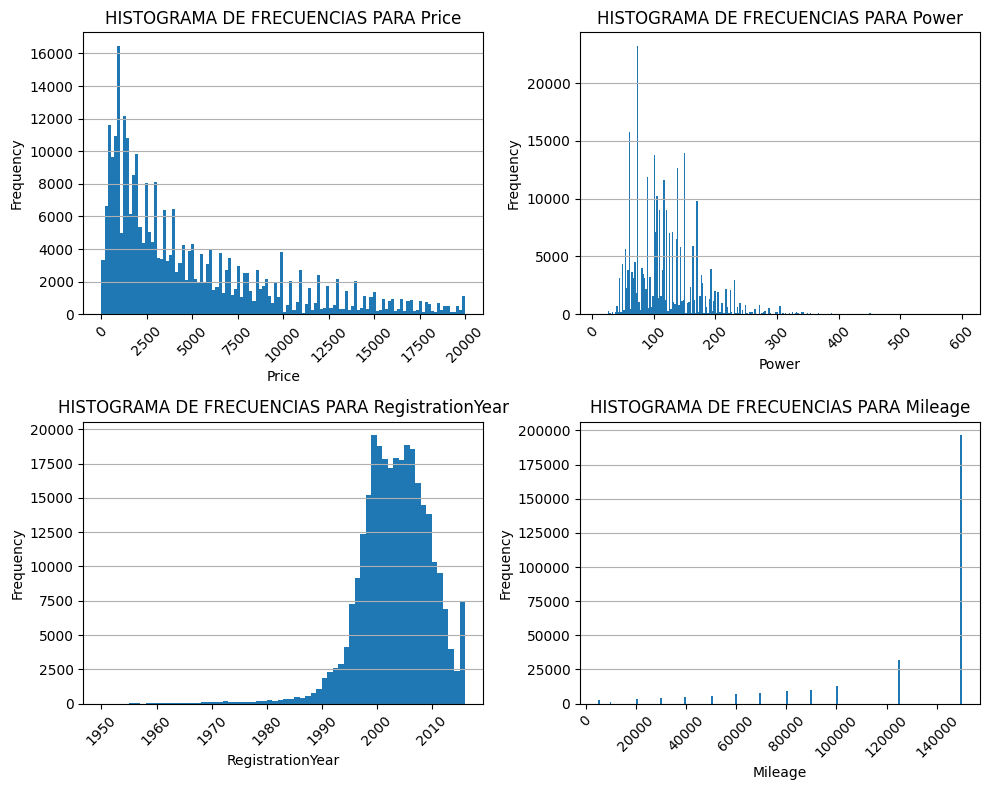

In [51]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

for ax, col in zip(axes.flatten(), df_cols_numeric):

    ax.hist(
        df_data[col],
        bins='auto'
    )

    ax.set_title(f'HISTOGRAMA DE FRECUENCIAS PARA {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')
    ax.grid(axis='y')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

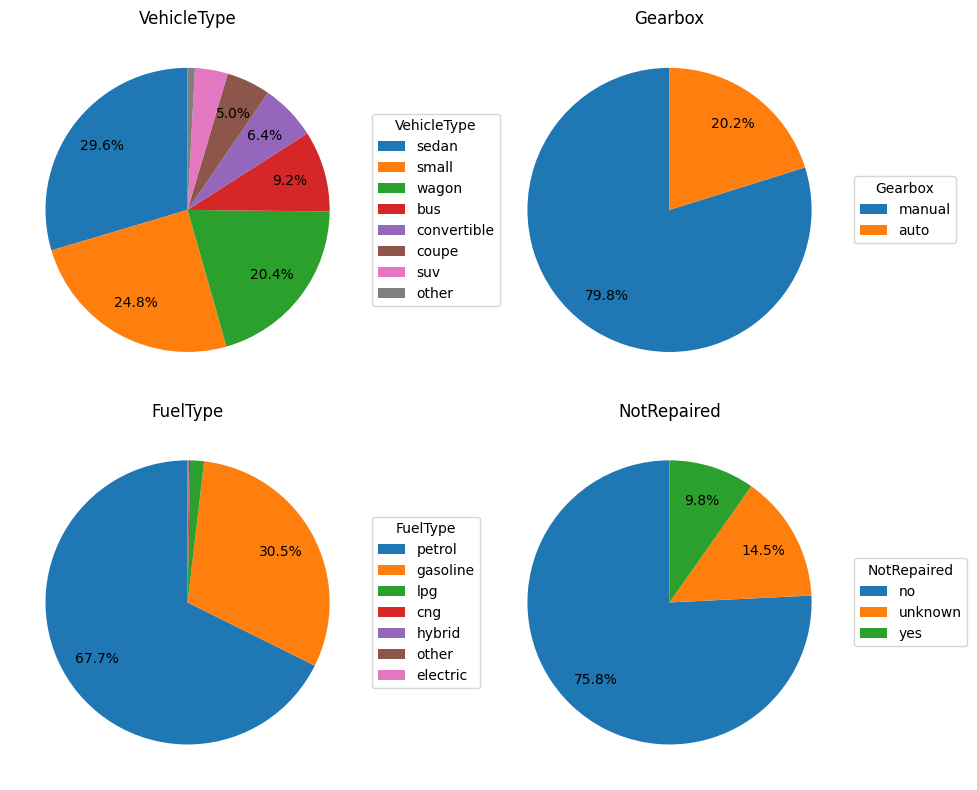

In [52]:
#df_columns

df_cols_categoric = ['VehicleType', 'Gearbox', 'FuelType', 'NotRepaired']

fig, axes = plt.subplots(2, 2, figsize=(10, 8))

for ax, col in zip(axes.flatten(), df_cols_categoric):
    
    counts = df_data[col].value_counts()
    
    ax.pie(
        counts.values,
        autopct=lambda p: f'{p:.1f}%' if p > 5 else '', # Ocultar porcentajes pequeños (evita superposiciones)
        pctdistance=0.75,
        startangle=90
    )
    
    ax.legend(
        counts.index,
        title=col,
        loc='center left',
        bbox_to_anchor=(1, 0.5),
        fontsize=10
    )

    ax.set_title(col)

plt.tight_layout()
plt.show()

## <a id='seccion2'></a>**SECCIÓN 2:** *Entrenamiento del modelo*

### **Estructura de la sección 2**

1. **Estrategia de división:**

    - `df_train`: 70%
    - `df_valid`: 15%
    - `df_test`: 15%

2. **Preparación y  estrategia de codificación:**


    - **Set de datos 1** (Datos sin  Codificación de Variables Categóricas): Usado para LightGBM y CatBoost

    - **Set de datos 2** (Codificación de Variables Categóricas): usado en modelos de Regresión Lineal, Árboles de Decisión, Bosque Aleatorio y XGBoost.
        - `pd.get_dummies(drop_first=True)` o `One Hot Encoder`

    - **Secuencia:** Para evitar Data Leakage partimos de `df_test`
        - Ajustar el encoder solo con `df_train` (`fit`)
        - Transformar `df_valid` y `df_test` con ese mismo encoder

> **Nota:** Es importante no aplicar el Encoding a todo  el dataset, sino, únicamente a `df_train`, por ello se hace primero el split de datos 70-15-15 (todos sin codificar) y posteriormente creamos el Universo de datos OHE a partir de `df_train`.

3. **Definición de la mética de evaluación:**

    - Justificación
    - RECM
  
3. **Modelo Base:**

    - Justificación
        - Datos con OHE
    - Regresión Lineal

4. **Modelos Basados en árboles:**

    - Justificación
        - Datos con OHE
    - Definición de hiperparámetros y estructura
    - Árbol de decisión
    - Bosque Aleatorio
    - Comparación con LR

5. **Modelos de potnciación de Gradiente:**

    - Justificación
        - Datos con OHE para XGBoost
        - Datos sin OHE para LightGBM y CatBoost
    - Definición de hiperparámetros y estructura
    - XGBoost
    - LightGBM
    - CatBoost
    - Comparación entre ellos

---

### **Estructura de los modelos**

- **Ingesta de datos:**
    - Cada Modelo debe recibir el tipo de datos que le corresponde
    - Estos datos se encuentran previamente almacenados en sus celdas correspondientes
    - Dataset limpio (Sin OHE) -> Split 70-15-15 -> Dataset con OHE (derivado del Train)

- **Cada modelo:**
    - Tiene su propia celda
    - Usa del dataset que le corresponde
        - Dataset limpio: Split 70-15-15
        - Dataset con OHE (Derivado de Train)
    - Reporta métricas y tiempo

- **Resultados:**
    - Almacenados en diccionarios homogéneos (misma estructura)
    - Al final, se unifican en una tabla global

---
[⬆ Volver al Índice](#indice)

### <a id='seccion2-1'></a>**SECCIÓN 2.1:** - *Divisón de los datos*

**Objetivo:** La división del conjunto de datos tiene como objetivo evaluar de manera justa y realista el desempeño de los modelos, asegurando que

- El modelo aprenda únicamente con datos de entrenamiento.
- La selección de hiperparámetros se haga sobre datos no vistos.
- La evaluación final refleje el desempeño en datos completamente nuevos.

**Justificación:** Split 70-15-15

- Se entrenarán múltiples modelos
- Se compararán arquitecturas diferentes
- Se realizará ajuste de hiperparámetros

**Consideraciones:**

- El split se realiza solo una vez sobre el dataset limpio sin codificación
- Por lo tanto, todos los modelos usan:
    - La misma división
    - Los mismo índices
- Garantiza resultados reproucibles

**Precauciones:**

- Verificar Sesgo (Skewness) en los datos, principalmente en la variable `target`
    - Existe posibilidad de que los datos estén sesgados habiendo mayor cantidad de autos con precios menores respecto a la minoría de autos con precios cercanos a los $20,000 euros 

> **Nota**: al tratarse de un target de regresión y no categórico, no es necesario revisar desbalance de clases

---
[⬆ Volver al Índice](#indice)

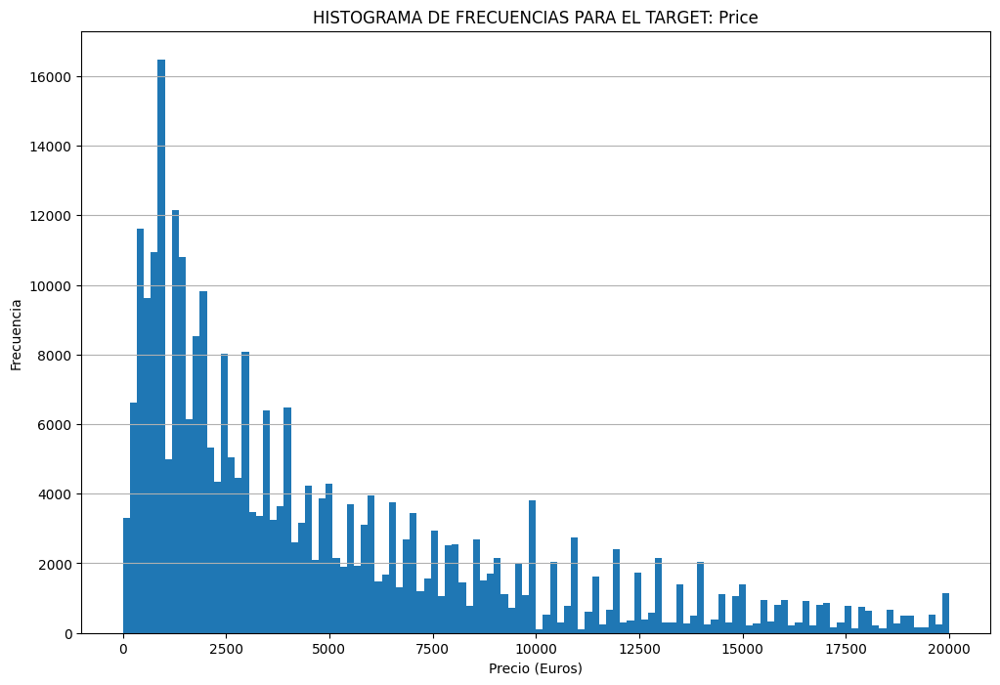

In [53]:
# Verificando sesgo en los datos
hist_target = np.histogram(
    df_data['Price'],
    bins='auto',
    density=False
)

counts, bin_edges = hist_target

# Graficando histograma
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
bin_widths = np.diff(bin_edges)

plt.figure(figsize=(12, 8))
plt.bar(
    bin_centers,
    counts,
    width=bin_widths,
    align='center'
)

plt.title('HISTOGRAMA DE FRECUENCIAS PARA EL TARGET: Price')
plt.xlabel('Precio (Euros)')
plt.ylabel('Frecuencia')
plt.grid(axis='y')

plt.show()

**Comentarios:** Los datos del histograma confirman una distribución con sesgo a la derecha (Right-Skewed).

- Esto supone inconvenientes para nustro modelo de Regresión Lineal:
    - La regresión lineal clásica asume que los errores (residuos) se distribuyen de forma normal.
        - Un target muy sesgado suele violar este supuesto, lo que genera predicciones menos confiables en los extremos.
    - Al ser una métrica cuadrática, el error en los autos caros (la "cola" de la distribución) pesará mucho más en la función de pérdida.
    - Los modelos basados en árboles (Random Forest, XGBoost, LightGBM, CatBoost) son invariantes a las transformaciones monótonas de las características y muy robustos al sesgo del target.
        - Se debe a que dividen los datos en nodos, por lo que no les importa si la distribución es normal o sesgada

---

**Propuesta:**

1. Split 70-15-15 sobre precios reales.
2. Validación de promedios para asegurar que no hubo un desbalance en las asignaciones que resulten en promedios de price diferentes entre sets
3. Regresión Lineal: Aplicar el ciclo `Log` → `Fit` → `Predict` → `Exp` para darle una oportunidad justa de competir.
4. Modelos de Árbol/Boosting: Entrenar directamente con `y_train` original.

> *Aunque el target presenta una distribución asimétrica con una cola larga hacia valores altos, no se aplicó una transformación directa al precio para los modelos basados en árboles y potenciación del gradiente. Estos modelos no asumen normalidad del target y son invariantes a transformaciones monótonas, ya que su proceso de aprendizaje se basa en divisiones por umbrales que minimizan el error local. Por esta razón, se entrenaron directamente sobre el precio original.*
>
> *En el caso de la regresión lineal, se aplicó una transformación logarítmica al target con el objetivo de reducir la asimetría y la heterocedasticidad, permitiendo una comparación más justa con los modelos no lineales.*

---

**Ajuste previo al split:**

Nuestro set de datos nativos requiere un ajuste en el formato de las columnas categóricas, esto con el fin de ser utilizado en los modelos LightGBM y CatBoost.

- Se requiere que las columnas que antes eran `object` (texto) ahora sean `category`.
    - Aunque, Catboost acepta datos tipo `object` (texto) y también `category`, LightGBM sólo puede manejar datos tipo `category`.
    - Convertir los datos a `category` satisface los requerimientos de ambos modelos con un solo set de datos en memoria.

- Las columnas a convertir son:
```python
categorical_features = ['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'NotRepaired']
```

In [54]:
categorical_features = ['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'NotRepaired']

for col in categorical_features:
    df_data[col] = df_data[col].astype('category')



In [55]:
# Definiendo características (Features) y el objetivo (Target)
X = df_data.drop('Price', axis=1)
y = df_data['Price']

# Split de datos 1: 70% train y 30% (Valid + Test)
X_train, X_rest, y_train, y_rest = train_test_split(
    X,
    y,
    test_size=0.30,
    random_state=230598
)

# Split de datos 2: A partir del split rest 30% obtener 15% Valid y 15% Test
X_valid, X_test, y_valid, y_test = train_test_split(
    X_rest,
    y_rest,
    test_size=0.50,
    random_state=230598
)

# Verificación de proporciones
print(f"Entrenamiento: {len(X_train)} registros ({len(X_train)/len(df_data):.0%})")
print(f"Validación:    {len(X_valid)} registros ({len(X_valid)/len(df_data):.0%})")
print(f"Prueba:        {len(X_test)} registros ({len(X_test)/len(df_data):.0%})")

print('--------------------------------------------------')

print("Precio promedio en Entrenamiento:", y_train.mean())
print("Precio promedio en Validación:   ", y_valid.mean())
print("Precio promedio en Prueba:       ", y_test.mean())


Entrenamiento: 207330 registros (70%)
Validación:    44428 registros (15%)
Prueba:        44428 registros (15%)
--------------------------------------------------
Precio promedio en Entrenamiento: 4846.889745815849
Precio promedio en Validación:    4850.9494012784735
Precio promedio en Prueba:        4862.053097145944


### <a id='seccion2-2'></a>**Sección 2.2:** - *Preparación y estrategia de codificación*

- A partir de `df_train`:
    1. Usando `OneHotEncoder` de `Sklearn` entrenamos con `fit` a partir del set de entrenamiento `df_train`.
    2. Trasformamos con `transform` los sets de validación `df_valid` y prueba `df_test`
    3. Ventaja: asegura que si aparece una categoría nueva en el futuro, el codificador sepa cómo manejarla (usando `handle_unknown='ignore'`).

---
[⬆ Volver al Índice](#indice)

In [56]:
#df_data.info()

# 1. Obtenemos columnas categóricas y numéricas para nuestros features
cat_features = ['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'NotRepaired']
num_features = ['RegistrationYear', 'Power', 'Mileage', 'RegistrationMonth']

# 2. Instanciamos el encoder
encoder = OneHotEncoder(
    handle_unknown='ignore',
    drop=None,
    sparse_output=False
)

# 3. Fitting data con el set de entrenamiento
encoder.fit(X_train[cat_features])

# 4. Transforming data para los tres sets --> Output: arrays de NumPy
X_train_ohe_cat = encoder.transform(X_train[cat_features])
X_valid_ohe_cat = encoder.transform(X_valid[cat_features]) 
X_test_ohe_cat = encoder.transform(X_test[cat_features])

# 5. Obtenemos los nombres de las nuevas columnas que se han generado
columns_ohe = encoder.get_feature_names_out(cat_features)

# 6. Concatenación con la variables numéricas --> Creando DF para concatenarlos con X_train[num_features]
X_train_ohe = pd.DataFrame(X_train_ohe_cat, columns=columns_ohe, index=X_train.index)
X_train_ohe = pd.concat([X_train_ohe, X_train[num_features]], axis=1)

X_valid_ohe = pd.DataFrame(X_valid_ohe_cat, columns=columns_ohe, index=X_valid.index)
X_valid_ohe = pd.concat([X_valid_ohe, X_valid[num_features]], axis=1)

X_test_ohe = pd.DataFrame(X_test_ohe_cat, columns=columns_ohe, index=X_test.index)
X_test_ohe = pd.concat([X_test_ohe, X_test[num_features]], axis=1)

**Comentarios:**

Se ha presentado un error al momento de implementar el OHE, debido a que no podemos usar `drop='first'` y `handle_unknown='ignore'` al mismo tiempo.

- `drop='first'`: Se usa para evitar la multicolinealidad (la trampa de la variable ficticia).
```bash
FuelType = ['petrol', 'diesel', 'gas']

Con drop='first':
→ petrol se elimina
→ quedan: diesel, gas
```
> Si todas esas columnas quedan en 0 → el modelo “sabe” que es `petrol`.

- `handle_unknown='ignore'`: Si el encoder encuentra una categoría nueva en el set de Validación que no vio en Entrenamiento, pone todas las columnas en 0 para esa fila.
    - Si aparece una categoría nunca vista en train:
        - *No lanza error*
        - *Codifica todas las columnas de esa variable como 0*
```bash
FuelType = 'electric' (no vista en train)
→ diesel = 0
→ gas = 0
```

- El error se presenta debido a que:
    - `drop='first'` ya usa el vector de ceros como categoría válida
    - `handle_unknown='ignore'` también genera vector de ceros
    - ¿Vector de ceros significa:
        - categoría base (`drop='first'`)?
        - categoría desconocida (`handle_unknown='ignore'`)?

---

**Propuesta:** Quitar `drop='first'` debido a que la mayoría de los modelos (incluyendo XGBoost y los Árboles) manejan perfectamente la multicolinealidad. Es preferible tener todas las columnas y poder ignorar categorías desconocidas en el futuro.
- Priorizar robustez ante categorías nuevas
    - Permitir categorías nuevas en valid/test
    - Evitar errores
    - Aunque, habrá colinealidad teórica
        - No afecta a árboles
        - LR con regularización lo tolera: Podría sufrir un poco de inestabilidad numérica, pero dado que tenemos un dataset tan grande (200k+ registros), el efecto de la multicolinealidad suele ser despreciable.

### <a id='seccion2-3'></a>**Sección 2.3:** - *Métrica de evaluación: RECM*

**Raiz del Error Cuadrático Medio:**
$$
\text{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} \bigl(y_i - \hat{y}_i\bigr)^2}
$$

**Justificación:** Se requieren estimaciones precisas del valor de mercado del vehículo. Un error de varios miles de euros puede generar desconfianza en el usuario final. Por ello, se utiliza la RECM como métrica principal, ya que penaliza fuertemente errores grandes y permite interpretar el desempeño del modelo en unidades monetarias reales.

- Un error de predicción tiene un costo monetario directo. Usar RECM nos permite decir: "Nuestro modelo tiene un margen de error de más/menos 'X' Euros"

- Penalización de errores grandes: fallar por 5,000 euros en un auto de lujo es mucho más grave que fallar por 100 euros en 50 autos económicos.
    - El RECM, al elevar los errores al cuadrado antes de la raíz, castiga más esos errores grandes, obligando al modelo a ser más preciso en los rangos de precio alto.

**Ventajas y desventajas:**
- Ventajas: La interpretación se hace en las mismas unidades de la predicción, no están elevadas al cuadrado.

- Desventajas: Es sensible a los valores atípicos. Un solo error masivo puede inflar el RECM considerablemente.

**Estructura:**

- Se crea una función de evaluación externa a los modelos con el fin de modularizar el el proyecto.

    - Mide los tiempos de predicción (se pasa un modelo previamente entrenado en los argumentos)
    - Recibe el conjunto de validación tanto en 'X' como en 'y'
    - Recibe el nombre del modelo
    - El Output es un diccionario que incluye la RECM y el tiempo de predicción

- En cada celda de entrenamiento de modelo se llamará a esta fucnión que predecirá y medirá el tiempo de predicción de un modelo previamente entrenado.

- Esta visión de modularización permite tener mayor control sobre el ajuste de hiperparámetros en cada modelo, algo que sería más complicado si crearamos una función encapsulada para todos los modelos.

- El tiempo de entrenamiento se registrará en cada celda (usando %%time) y el de predicción se automatizará dentro de la función.

---
[⬆ Volver al Índice](#indice)

In [57]:
def get_evaluation_metrics(model, X_valid, y_valid, name, inv_log=False):
    """
    Calcula el RECM y mide el tiempo de predicción de un modelo ya entrenado.
    """

    # 1. Predicción y tiempo de predicción
    start_predict = time.time()
    preds = model.predict(X_valid)
    end_predict = time.time()

    # 2. Cálculo de la RECM
    if inv_log:
        preds = np.expm1(preds)
        rmse = mean_squared_error(y_valid, preds) ** 0.5
    
    else:
        rmse = mean_squared_error(y_valid, preds) ** 0.5

    # 3. OUTPUT
    return{
        'Modelo' : name,
        'RECM' : round(rmse, 2),
        'Tiempo_de_prediccion' : round(end_predict - start_predict, 4),
        'Predicciones' : preds
    }

#### **SECCIÓN 2.3.1:** - *Gráfico de dispersión para y_valid VS y_pred*


In [58]:
def plot_regression_results(y_true, y_pred, model_name, rmse):

    plt.figure(figsize=(12, 8))

    # Gráfico de dispersión
    sns.scatterplot(
        x=y_true,
        y=y_pred,
        alpha=0.3,
        color='royalblue'
    )

    # Línea de identidad (predicción perfecta)
    max_val = max(y_true.max(), y_pred.max())
    plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', lw=2, label='Predicción Perfecta (y=x)')

    plt.title(f'Real vs Predicho: {model_name}\nRECM: {rmse:.2f}')
    plt.xlabel('Precio Real')
    plt.ylabel('Precio Predicho')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

### <a id='seccion2-4'></a>**Sección 2.4:** - *Modelo base: Regresión Lineal*

**Justificación:** La Regresión Lineal actúa como nuestro Benchmark. Es un modelo determinista y rápido que asume relaciones lineales entre las características y el precio. Su objetivo principal no es darnos los mejores resultados sino servir como prueba de cordura, cualquier modelo de potenciación del gradiente (Boosting) que no logre superar significativamente el RECM de la Regresión Lineal debe ser descartado o revisado, ya que no justificaría su complejidad computacional.

**Estrucutra:**

- Tipo de datos requerido
    - Features: OHE
    - Target: Log

- Se propone una función que recibe el set de datos correspoindientes `X_train_ohe`, `y_train`, `X_valid_ohe`, `y_valid`.
    - Debido al sesgo a la derecha (Right-Skewed) los Targets deben ser tranformados logarítmicamente, esto se definirá como un argumento en la función.
        - Se procede con `np.log1p(y_train)` antes del fit.
        - Dentro de `get_evaluation_metrics`, antes de calcular el RMSE, debe aplicar `np.expm1(preds)` para que el error sea en dinero real y no en escala logarítmica, establecido como argumento `inv_log`.

---
[⬆ Volver al Índice](#indice)

**Versión explícita:** Celda Markdown no ejecutable
    
```python
def run_linear_regression(X_train, y_train, X_valid, y_valid, transf_log=False):

    # 1. Instanciando modelo
    model = LinearRegression()

    # 2. Transformación logarítmica Y/N - Entrenamiento y métricas
    if transf_log:

        #Transformación logarítmica (Sólo cuando hay sesgo Skewed)
        y_train = np.log1p(y_train)

        # Ajuste (Fit) con medición de tiempo de entrenamiento
        start_train = time.time()
        model.fit(X_train, y_train)
        end_train = time.time()
    
        training_time = end_train - start_train

        metrics = get_evaluation_metrics(
            model,
            X_valid,
            y_valid,
            "Linear Regression (Baseline)",
            inv_log=True
        )

    else:
        # Ajuste (Fit) con medición de tiempo de entrenamiento
        start_train = time.time()
        model.fit(X_train, y_train)
        end_train = time.time()
        
        training_time = end_train - start_train

        metrics = get_evaluation_metrics(
            model,
            X_valid,
            y_valid,
            "Linear Regression (Baseline)",
            inv_log=False
        )

    # 3. Agregar el tiempo de entrenamiento al diccionario resultante
    metrics['Tiempo_de_entrenamiento: '] = round(training_time, 4)

    return metrics
```

In [59]:
# Versión optimizada

def run_linear_regression(X_train, y_train, X_valid, y_valid, transf_log=False):
    model = LinearRegression()
    
    # Preparamos el target según la bandera
    y_train_ready = np.log1p(y_train) if transf_log else y_train
    
    # Ajuste (Fit) midiendo solo el tiempo del entrenamiento puro
    start_train = time.time()
    model.fit(X_train, y_train_ready)
    end_train = time.time()
    
    training_time = end_train - start_train
    
    # Llamamos a la evaluación pasando la bandera de inversión
    name = "Linear Regression (Log Transf)" if transf_log else "Linear Regression (Baseline)"
    metrics = get_evaluation_metrics(model, X_valid, y_valid, name, inv_log=transf_log)
    
    # Añadimos a metrics --> tiempo de entrenamiento & el objeto modelo
    metrics['Tiempo_de_entrenamiento'] = round(training_time, 4)
    metrics['Modelo_obj'] = model
    
    return metrics

### <a id='seccion2-5'></a>**Sección 2.5:** - *Modelos basados en árboles*

**Justificación:** Se implementarán dos modelos basados en árboles (`Decision Tree` y `Random Forest`). Los modelos en basados en árboles nos servirán para entender y medir el el rendimiento a nivel fundamental. Sabiendo que la Regresión Lineal es la línea base con la cual debemos comparar nuestros modelos posteriores, los modelos basados en árboles son los antecesores directos de Boosting, esto quiere decir que los modelos Boosting están cosntruidos sobre árboles, más específicamente:

- `Decision Tree`: Funge como unidad básica de entrenamiento. Nos indica cuanta señal podemos extraer con una sola estructura jerárquica.

    - Suele tener bajo sesgo, aprendizaje más influenciado por el Train pero conlleva alta varianza.
        - Árbol individual → alta varianza
        - Overfitting vs underfitting
        - Efecto de `max_depth`, `min_samples_leaf`
        - Sensibilidad al ruido
        - Interpretabilidad


- `Random Forest`: Ensamble de árboles independientes
    
    - Reducción de la varianza donde al promediar árboles independientes el error se estabiliza.
        - ¿Hay mejoras si reduzco la varianza sin cambiar el sesgo?
        - ¿Cuánto mejora la señal si promediamos muchos árboles independientes (Bagging)?
        - Random Forest → varianza reducida

- `Boosting`: Ensamble secuencial de árboles débiles. Mejora sobre RF a partir del aprendizaje secuencial de los errores anteriores. 

    - Su objetivo principal es reducir el sesgo. Crea árboles que se especializan en lo que los anteriores fallaron. Si el Boosting supera al RF, significa que el problema es intrínsecamente complejo y requiere un ajuste fino secuencial.
        - Boosting → sesgo reducido (y varianza controlada)
 
- 

> **Nuestra secuencia de modelado/comparación:** Árbol simple → Bosque → Boosting.
>
> Esta sección busca entrenar modelos de Árboles de Decisión y Bosques Aleatorios para establecer un estándar de comparación no lineal. Esto nos permitirá comprobar si la arquitectura de Boosting efectivamente reduce el sesgo del modelo, buscando una mejora en el RECM respecto a los métodos de ensamble tradicionales."


**Estructura:** La estructura de esta sección para entrenamiento de modelos basados en árboles sigue una arquitectura polimórfica controlada por argumentos explíctos con lo cual se busca tener control total y explícito sobre los hiperparámetros.

- Los argumentos reflejan decisiones reales de modelado

- Se implementan los hiperparámetros principales
    - `max_depth`
    - `min_samples_leaf`
    - `max_features`
    - `n_estimators` (solo relevante para RF)

- Polimorfismo explícito al momento de instanciar modelos (uso de if/else)

- Al tratarse de modelos basados en árboles, la mayoría de los hiperparámetros se encuentran compartidos de manera correcta:
    - Hiperparámetros compartidos entre ambos modelos:
        - `max_depth` 
        - `min_samples_leaf`
        - `max_features`
        - `random_state`
    - Hiperparámetro aislado para `Random Forest`
        - `n_estimators`
     
- Entrenamiento del modelo centralizado a partir de la variable model (la cual tiene un modelo de entrenamiento asignado en la función polimórfica de instanciamiento de modelo).
    - Una sola medición de tiempo para ambos modelos.
    - Comparabilidad directa entre algoritmos.
    - Se evita duplicar bloques de entrenamiento.

- Evaluación desacoplada
    - Llamada a la función externa para predicciones y métricas del modelo.

- Naming descriptivo
    - El nombre del modelo documenta su configuración para facilitar el análisis
    - El Output permitirá comparar los modelos bajo una interfaz homogénea

---
[⬆ Volver al Índice](#indice)


In [60]:
def run_tree_model(
    X_train,
    y_train,
    X_valid,
    y_valid,
    model_type='decision_tree',
    max_depth=None,
    min_samples_leaf=1,
    max_features=None,
    n_estimators=100
):
    '''
    Función polimórfica para entrenar modelos basados en árboles
    '''

    # 1. Instanciamiento de la función
    if model_type == 'decision_tree':
        model = DecisionTreeRegressor(
            random_state=230598,
            max_depth=max_depth,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features
        )
        base_name = f'Decision Tree (depth={max_depth}, leaf={min_samples_leaf})'

    elif model_type == 'random_forest':
        model = RandomForestRegressor(
            random_state=230598,
            max_depth=max_depth,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            n_estimators=n_estimators,
            n_jobs=-1
            )
        base_name = f'Random Forest (n={n_estimators}, depth={max_depth})'

    else:
        raise ValueError('model_type debe ser decision_tree o random_forest')

    # 2. Entrenamiento y medición del tiempo
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    training_time = end_train - start_train

    # 3. Preds y evaluación del modelo
    name = base_name
    metrics = get_evaluation_metrics(model, X_valid, y_valid, name, inv_log=False)

    # Añadimos a metrics --> tiempo de entrenamiento & el objeto modelo
    metrics['Tiempo_de_entrenamiento'] = round(training_time, 4)
    metrics['Modelo_obj'] = model

    return metrics
    

### <a id='seccion2-6'></a>**Sección 2.6:** - *Modelos de Potenciación de Gradiente*

**Justificación:** La potenciación de gradiente no construye árboles independientes (como sí lo hace RFR), estos modelos construyen árboles de manera secuencial donde cada nuevo árbol intenta corregir los errores (el residuo del árbol anterior).

- **Datos: ¿Nativos o con OHE?**

    - XGBoost (Usar datos con OHE): Aunque las versiones más recientes ya aceptan categorías, tradicionalmente XGBoost requiere que todas las entradas sean numéricas. Usar el set con OHE permite comparar su potencia de cálculo "fuerza bruta" contra los modelos anteriores.
    
    - LightGBM y CatBoost (Nativo): Estos modelos son famosos por su manejo inteligente de categorías.
        - LightGBM utiliza un algoritmo basado en histogramas para encontrar el mejor "split" en variables categóricas.
        - CatBoost utiliza una técnica llamada Ordered Boosting y un preprocesamiento interno de categorías que evita el sesgo de predicción.


**1. XGBoost (eXtreme Gradient Boosting)**

Es la implementación más veterana y robusta del descenso de gradiente. Destaca por su uso de regularización avanzada para evitar el sobreajuste y su capacidad de procesamiento en paralelo.

* **`n_estimators`**: Cantidad total de árboles en la secuencia.
* **`learning_rate`**: Escala la contribución de cada árbol. Valores bajos requieren más árboles pero mejoran la generalización.
* **`max_depth`**: Profundidad máxima de cada árbol. Controla la interacción entre variables.
* **`subsample`**: Fracción de filas usadas por árbol. Valores menores a 1.0 ayudan a prevenir el sobreajuste.
* **`colsample_bytree`**: Fracción de columnas usadas por cada árbol. Similar al funcionamiento en el Random Forest.

**2. LightGBM (Light Gradient Boosting Machine)**

Desarrollado por Microsoft, es famoso por su alta velocidad y bajo uso de memoria. A diferencia de otros, crece los árboles por **hojas (leaf-wise)** en lugar de niveles, lo que le permite reducir el error mucho más rápido en datasets grandes.

* **`num_leaves`**: El parámetro principal. Controla la complejidad del modelo (máximo de hojas por árbol).
* **`max_depth`**: Se usa para limitar el crecimiento leaf-wise y evitar que el árbol sea demasiado profundo y específico.
* **`learning_rate`**: Tamaño del paso de actualización en cada iteración.
* **`n_estimators`**: Número de iteraciones de potenciación.
* **`min_child_samples`**: Cantidad mínima de datos en una hoja para permitir una nueva división. Es vital para el control de ruido.

**3. CatBoost (Categorical Boosting)**

Desarrollado por Yandex, está diseñado específicamente para datasets con muchas variables categóricas. Utiliza una técnica llamada **Ordered Boosting** para mitigar el sesgo de predicción y maneja las categorías de forma nativa sin necesidad de preprocesamiento manual (como OHE).

* **`iterations`**: Equivalente a `n_estimators`. Es el número máximo de árboles.
* **`learning_rate`**: Paso de aprendizaje. CatBoost suele seleccionar uno automáticamente si no se define.
* **`depth`**: Profundidad del árbol. Suele usarse entre 6 y 10.
* **`l2_leaf_reg`**: Coeficiente de regularización L2. Muy efectivo para suavizar las predicciones y evitar el sobreajuste.

| Característica | XGBoost | LightGBM | CatBoost |
| --- | --- | --- | --- |
| **Crecimiento** | Por Niveles (Level-wise) | Por Hojas (Leaf-wise) | Árboles Simétricos |
| **Categorías** | Requiere OHE / Numérico | Codificación por Histogramas | Codificación Nativa Avanzada |
| **Velocidad** | Media | **Muy Alta** | Alta (en predicción) |

---
[⬆ Volver al Índice](#indice)

In [61]:
def run_boosting_model(X_train, y_train, X_valid, y_valid, model_type='lgbm', **kwargs):

    # 1. Instanciamiento del modelo según su tipo
    if model_type == 'xgboost':
        model = XGBRegressor(random_state=230598, n_jobs=-1, **kwargs)
        name = 'XGBoost'

    elif model_type == 'lgbm':
        model = LGBMRegressor(random_state=230598, n_jobs=-1, **kwargs)
        name = 'LightGBM'

    elif model_type == 'catboost':
        model = CatBoostRegressor(random_state=230598, logging_level='Silent', **kwargs)
        name = "CatBoost"

    else:
        raise ValueError('model_type debe ser "xgboost", "lgbm" o "catboost"')

    # 2. Entrenamiento (con lógica específica para CatBoost)
    start_train = time.time()

    if model_type == 'catboost':
        cat_cols = X_train.select_dtypes('category').columns.tolist()
        model.fit(X_train, y_train, cat_features=cat_cols)

    else:
        model.fit(X_train, y_train)
    
    end_train = time.time()

    # 3. Evaluación, uso de la función externa
    params_str = "-".join([f"{k}={v}" for k, v in kwargs.items()])
    full_name = f"{name} ({params_str})"
    
    # Añadimos a metrics --> tiempo de entrenamiento & el objeto modelo
    metrics = get_evaluation_metrics(model, X_valid, y_valid, full_name, inv_log=False)
    metrics['Tiempo_de_entrenamiento'] = round(end_train - start_train, 4)
    metrics['Modelo_obj'] = model
    
    return metrics

#### **Nota técnica 1:** Sobre el uso de `**kwargs` y `params_str`

##### **A) ¿Qué es `**kwargs`?**

El nombre proviene de **K**ey**W**ord **ARG**ument**S**. Los dos asteriscos (`**`) son la clave: le dicen a Python que capture cualquier argumento nombrado que no esté definido explícitamente en la función y lo guarde en un diccionario.

Ejemplo, al llamar a una función:

```python
run_boosting_model(..., n_estimators=100, learning_rate=0.1, max_depth=5)
```

1. Asigna los datos a `X_train`, `y_train`, etc.
2. Identifica que `n_estimators`, `learning_rate` y `max_depth` no están en la lista de argumentos fijos.
3. Los empaqueta en un diccionario llamado `kwargs: kwargs = {'n_estimators': 100, 'learning_rate': 0.1, 'max_depth': 5}`

---

##### **B) Desempaquetado del diccionario**

Ocurre dentro de la función polimórfica en el `if/elif`:
```python
model = XGBRegressor(..., **kwargs)
```

Los asteríscos hacen el proceso inverso: desempaquetan el diccionario. Se podría interpretar como si escribiéramos manualmente cada parámetro dentro de los paréntesis del modelo.

> **Ventaja:** Si se desea probar un parámetro nuevo que solo existe en CatBoost (como `l2_leaf_reg`), no se tiene que modificar la función. Simplemente lo pasamos al llamar a `run_boosting_model` y el `**kwargs` lo llevará directamente hasta el constructor del modelo.

---

##### **C) Uso de `params_str`**

`params_str` es donde se transforma ese "diccionario invisible" en algo que puede ser leído directamente, y por ende puede ser añadido a la tabla de resultados.

- Línea: `params_str = "-".join([f"{k}={v}" for k, v in kwargs.items()])`

    1. `kwargs.items()`: Accede a los pares llave-valor (ej: `n_estimators` y 100).

    2. `f"{k}={v}"`: Crea un string formateado para cada par, por ejemplo: "`n_estimators=100`".

    3. `[...]` (List Comprehension): Crea una lista con todos esos strings: `["n_estimators=100", "learning_rate=0.1"]`.

    4. `"-".join(...)`: Concatena todo usando un guion como separador.

- Resultado final: Si kwargs tenía los parámetros de arriba, `params_str` se convierte en:
    - "`n_estimators=100-learning_rate=0.1-max_depth=5`"
 
- Utilidad: porque luego lo usamos en: `full_name = f"{name} ({params_str})"`
    - Esto hace que en la lista `all_results`, el nombre del modelo sea totalmente descriptivo. En lugar de tener diez filas que digan "XGBoost", tendremos:
        - *XGBoost (n_estimators=100-learning_rate=0.1)*
        - *XGBoost (n_estimators=200-learning_rate=0.05)*

---

##### **D) Resumen de la lógica**
1. Entrada: `**kwargs` recibe los hiperparámetros como un diccionario.
2. Instanciación: `**kwargs` le entrega esos parámetros al modelo de ML de forma automática.
3. Identificación: `params_str` recorre ese mismo diccionario para crear una "etiqueta" de texto.

---

#### **Nota técnica 2:** Sobre el uso de train específico para CatBoost (Gestión Automatizada de Variables Categóricas)

Se implementó una lógica de detección dinámica de características categóricas específicamente para el modelo CatBoost. A continuación, se detalla el funcionamiento y la justificación de este bloque de código.

- La línea `X_train.select_dtypes('category').columns.tolist()` realiza tres operaciones en cadena:

    - **`select_dtypes('category')`**: Filtra el DataFrame para conservar únicamente las columnas que fueron previamente convertidas al tipo de dato `category` de Pandas.
    - **`.columns`**: Recupera el índice con los nombres de dichas columnas.
    - **`.tolist()`**: Convierte ese índice en una lista estándar de Python, que es el formato que requiere el parámetro `cat_features`.

A diferencia de otros algoritmos, **CatBoost** no procesa automáticamente las columnas categóricas por el simple hecho de ser tipo `category` en Pandas. El modelo exige que el usuario declare explícitamente cuáles son estas variables mediante el parámetro `cat_features` durante el método `.fit()`.

Al automatizar esta detección, logramos dos objetivos de ingeniería:

1. **Escalabilidad (Data-Agnostic):** La función se vuelve independiente del dataset. Si en el futuro se agregan o eliminan variables categóricas, el código las detectará sin necesidad de intervención manual.
2. **Prevención de Errores:** Evita el error `CatBoostError`, asegurando que el motor de *Ordered Boosting* sepa exactamente qué columnas debe procesar internamente mediante sus algoritmos de codificación avanzada.


## <a id='seccion3'></a>**SECCIÓN 3:** *Análisis del modelo*

### <a id='seccion3-1'></a>**Sección 3.1:** *Modelado entrenamiento y ajuste de hiperparámetros (Regresión Lineal)*

---
[⬆ Volver al Índice](#indice)

In [62]:
%%time

# Entrenamiento y métricas con Regresión lineal (sin transformación logarítmica)
LR = run_linear_regression(X_train_ohe, y_train, X_valid_ohe, y_valid, transf_log=False)

CPU times: total: 13.1 s
Wall time: 5.64 s


In [63]:
print('Resultados: Regresión lineal (sin transformación logarítmica) - BASELINE')

LR

Resultados: Regresión lineal (sin transformación logarítmica) - BASELINE


{'Modelo': 'Linear Regression (Baseline)',
 'RECM': 2637.51,
 'Tiempo_de_prediccion': 0.0574,
 'Predicciones': array([ -650.73768374,   445.38177511, 12930.81856184, ...,
         1335.897986  ,  1654.45215585,   485.81339128], shape=(44428,)),
 'Tiempo_de_entrenamiento': 5.5827,
 'Modelo_obj': LinearRegression()}

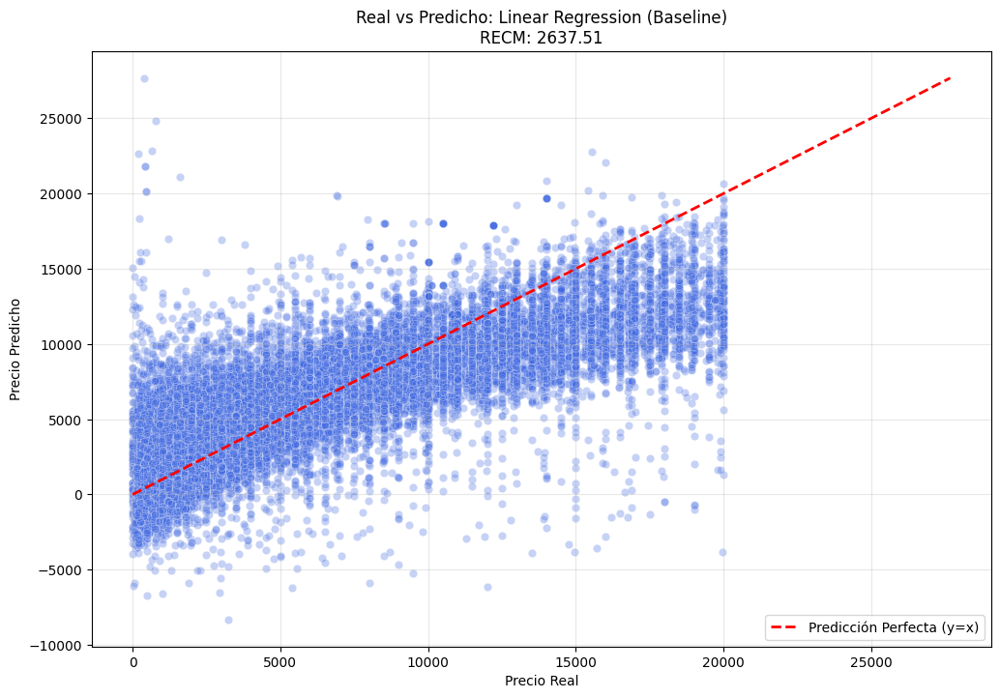

In [64]:
# Ploteando resultados
plot_regression_results(y_valid, LR['Predicciones'], LR['Modelo'], LR['RECM'])

In [65]:
%%time

# Entrenamiento y métricas con Regresión lineal (con transformación logarítmica)
LR_log = run_linear_regression(X_train_ohe, y_train, X_valid_ohe, y_valid, transf_log=True)

CPU times: total: 11.7 s
Wall time: 5.43 s


In [66]:
print('Resultados: Regresión lineal (con transformación logarítmica)')

LR_log

Resultados: Regresión lineal (con transformación logarítmica)


{'Modelo': 'Linear Regression (Log Transf)',
 'RECM': 3442.64,
 'Tiempo_de_prediccion': 0.044,
 'Predicciones': array([  715.97836408,  1101.46912349, 16996.50448397, ...,
         1521.62790183,  1293.51437768,  1105.83765177], shape=(44428,)),
 'Tiempo_de_entrenamiento': 5.3752,
 'Modelo_obj': LinearRegression()}

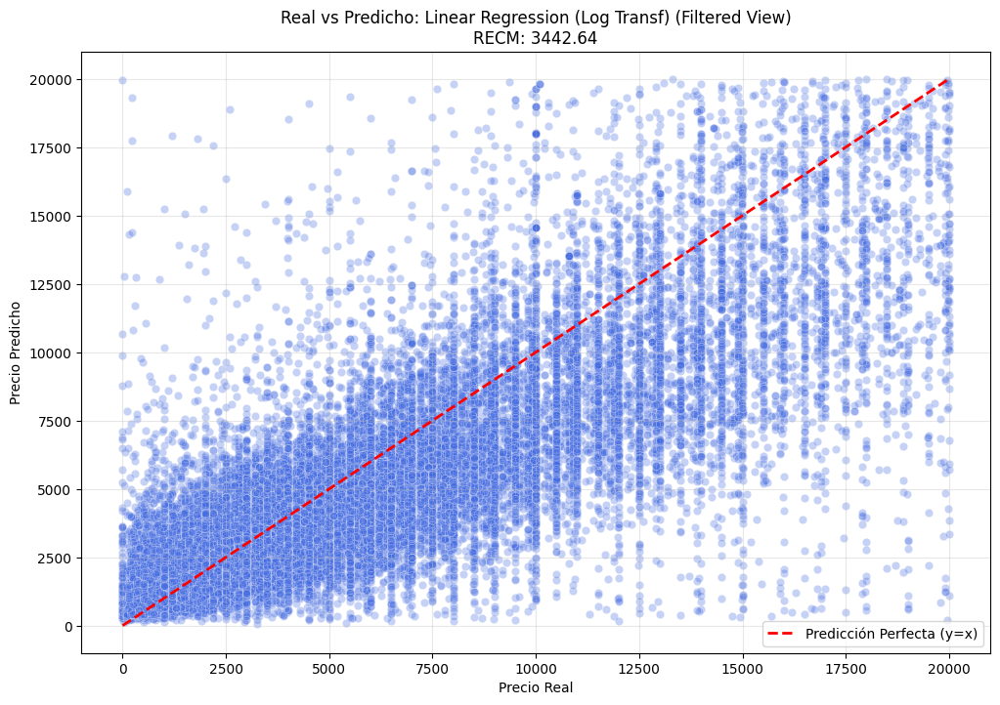

In [67]:
# 1. Definimos un umbral basado en el conocimiento del negocio (ej. 25,000 euros)
umbral_precio = 20000 

# 2. Creamos una máscara booleana para filtrar las predicciones explosivas
# Usamos las predicciones del modelo LR_log para filtrar ambos arreglos
mask = LR_log['Predicciones'] <= umbral_precio

# 3. Llamamos a la función pasando únicamente los datos dentro del rango
plot_regression_results(
    y_valid[mask], 
    LR_log['Predicciones'][mask], 
    LR_log['Modelo'] + " (Filtered View)", 
    LR_log['RECM']
)

In [68]:
# Anañdiendo los resultados a un diccionario global
all_results = []

all_results.append(LR)
all_results.append(LR_log)

print(all_results)


[{'Modelo': 'Linear Regression (Baseline)', 'RECM': 2637.51, 'Tiempo_de_prediccion': 0.0574, 'Predicciones': array([ -650.73768374,   445.38177511, 12930.81856184, ...,
        1335.897986  ,  1654.45215585,   485.81339128], shape=(44428,)), 'Tiempo_de_entrenamiento': 5.5827, 'Modelo_obj': LinearRegression()}, {'Modelo': 'Linear Regression (Log Transf)', 'RECM': 3442.64, 'Tiempo_de_prediccion': 0.044, 'Predicciones': array([  715.97836408,  1101.46912349, 16996.50448397, ...,
        1521.62790183,  1293.51437768,  1105.83765177], shape=(44428,)), 'Tiempo_de_entrenamiento': 5.3752, 'Modelo_obj': LinearRegression()}]


**Comentarios:**

Resultados contraintuitivos para LR vs LR (con transformación logarítmica).

1. Los resultados subieron 800 pts de error al usar transformacón logarítmica. Esto sucede porque el modelo optimiza el "Error Relativo", no el "Error Absoluto".
    - Cuando aplicamos $log(price)$, la Regresión Lineal intenta minimizar la diferencia entre el logaritmo predicho y el logaritmo real.
        - En escala logarítmica, fallar por el mismo "tramo" en un auto de 2,000 es igual de grave que fallar en uno de 20,000.
        - Sin embargo, al revertir la transformación con expm1, ese pequeño error en el auto de 20,000 se convierte en una desviación de miles de euros, mientras que en el de 2,000 sigue siendo pequeña.

> El modelo con logaritmos se vuelve "más ciego" a los errores grandes en términos de dinero real, y el RECM (que es una métrica de dinero real) castiga con mucha fuerza esos errores en la parte alta de la distribución.

2. A partir de la fórmula de RMSE: $\text{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} \bigl(y_i - \hat{y}_i\bigr)^2}$, debido a que los errores se elevan al cuadrado, si la transformación logarítmica hace que el modelo subestime un auto caro por, digamos, $5,000$ unidades, el impacto en el RECM es masivo $(5,000^2=25,000,000)$.

> Un modelo de Regresión Lineal sin logaritmo se esfuerza más por no fallar en los autos caros precisamente porque el error es mayor en esa zona, lo que irónicamente ayuda a bajar el RECM global.

3. Posiblemente, la transformación logarítmica asume que la relación entre las variables (como la Potencia o el Año) y el Precio es multiplicativa (exponencial).
    - Si en la realidad un aumento de 10 HP aumenta el precio en una cantidad fija (relación aditiva), al aplicar logaritmos estás forzando una curvatura donde no la hay.
    - Esto introduce un sesgo en el modelo que se traduce en un error sistemático.

4. El logaritmo "estira" mucho los valores pequeños. Si tenemos autos con precios muy bajos (ej. 100 o 200 euros), el modelo logarítmico les dará muchísima importancia durante el entrenamiento.
    - Esto puede hacer que el modelo "sacrifique" la precisión en los autos caros para intentar ajustar perfectamente los autos muy baratos.
    - Para el RECM final, un error en un auto de 100 euros es insignificante, pero el error que se generó en el de 20,000 por culpa de este ajuste es devastador.

### <a id='seccion3-2'></a>**Sección 3.2:** *Modelado, entrenamiento y ajuste de hiperparámetros (Modelos basados en árboles)*

#### **3.2.1 Modelos basados en árboles** - *Ajustes de hiperparámetros (Tuning)*

- Con una profundidad de 10 el árbol es suficientemente profundo, pero algo conservador: subir `max_depth = 15 - 20`
    - Subir `max_depth`:
        - Captura relaciones complejas
        - Reduce sesgo
        - Aumenta varianza
        - Mayor riesgo de overfitting
        - Árboles más lentos

    - Bajar `max_depth`:
        - Reduce overfitting
        - Árboles más estables
        - Entrenamiento más rápido
        - Puede perder señales importantes (underfitting)

> Árbol muy profundo = memoriza
>
>Árbol poco profundo = generaliza
 
- Aumentar el `n_estimators` (Número mínimo de muestras en cada hoja): subir `n_estimators = 100` -> estándar de la industria
    - Subir `min_samples_leaf`:
        - Hojas más estables
        - Reduce ruido
        - Mejora generalización
        - Puede suavizar demasiado

    - Bajar `min_samples_leaf`:
        - Ajuste fino
        - Captura patrones locales
        - Hojas frágiles
        - Sensible a outliers

> Valor bajo → modelo “nervioso”
>
> Valor alto → modelo “conservador”

- `max_features` -> aleatoriedad y diversidad. Controla cuántas variables se consideran en cada split.

    - Subir `max_features`
        - Árboles más fuertes individualmente
        - Más correlación entre árboles (en RF)
        - Menor diversidad

    - Bajar `max_features`
        - Mayor diversidad (clave en RF)
        - Menor varianza del ensamble
        - Árboles individuales más débiles

> En Decision Tree → efecto menor
>
> En Random Forest → fundamental

- `n_estimators` -> fuerza del ensamble (RF). Controla el número de árboles en el bosque.

    - Subir n_estimators
        - Reduce varianza
        - Predicciones más estables
        - Más tiempo de entrenamiento
        - Rendimientos decrecientes

    - Bajar n_estimators
        - Entrena rápido
        - Predicciones inestables
        - Alta varianza

> Después de cierto punto, agregar árboles ya no mejora el modelo.

---
[⬆ Volver al Índice](#indice)


#### **3.2.2 Modelos basados en árboles** - *Aproximación estándar*

Configuración:

- `max_depth=10`
- `min_samples_leaf=5`
- `max_features=None`
- `n_estimators=20`

In [69]:
dt_res_1 = run_tree_model(
    X_train_ohe,
    y_train,
    X_valid_ohe,
    y_valid,
    model_type='decision_tree',
    max_depth=10,
    min_samples_leaf=5,
    max_features=None
)

dt_res_1


{'Modelo': 'Decision Tree (depth=10, leaf=5)',
 'RECM': 1987.09,
 'Tiempo_de_prediccion': 0.0571,
 'Predicciones': array([ 2685.67105263,  1109.54549361, 14629.23704333, ...,
         2177.71045496,  1579.31773115,  1579.31773115], shape=(44428,)),
 'Tiempo_de_entrenamiento': 3.6953,
 'Modelo_obj': DecisionTreeRegressor(max_depth=10, min_samples_leaf=5, random_state=230598)}

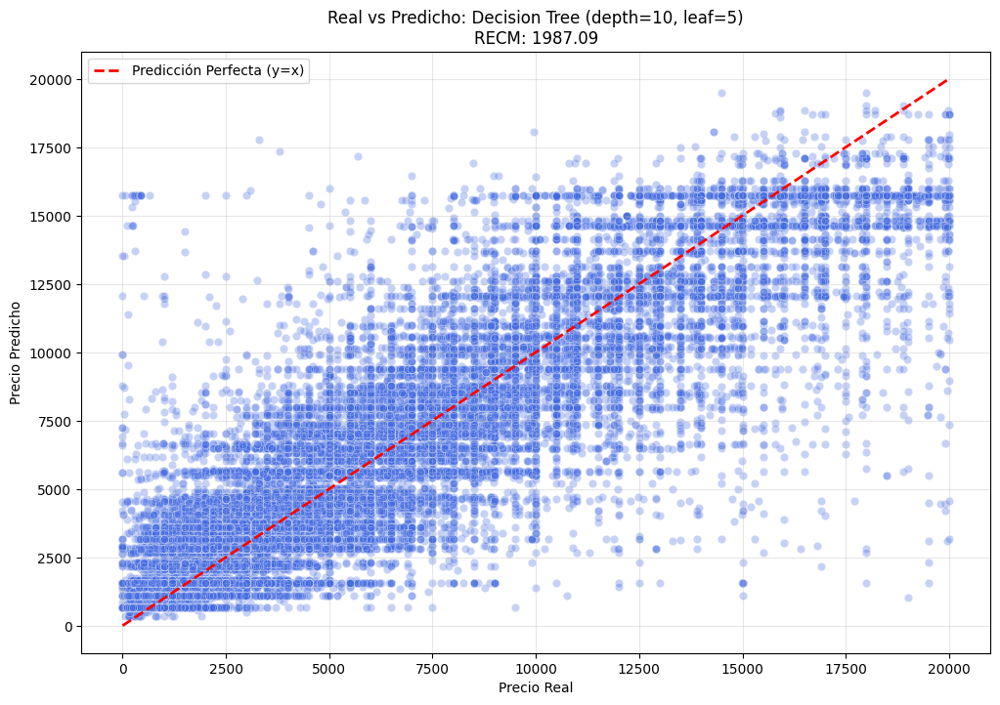

In [70]:
# Plteando resultados
plot_regression_results(y_valid, dt_res_1['Predicciones'], dt_res_1['Modelo'], dt_res_1['RECM'])


In [71]:
rfr_res_1 = run_tree_model(
    X_train_ohe,
    y_train,
    X_valid_ohe,
    y_valid,
    model_type='random_forest',
    n_estimators=20, 
    max_depth=10,
    min_samples_leaf=5,
    max_features=None
)

rfr_res_1

{'Modelo': 'Random Forest (n=20, depth=10)',
 'RECM': 1906.81,
 'Tiempo_de_prediccion': 0.0987,
 'Predicciones': array([ 1988.9618046 ,  1149.66834242, 14893.40819117, ...,
         2411.30678251,  1796.14818387,  1542.95387327], shape=(44428,)),
 'Tiempo_de_entrenamiento': 19.7382,
 'Modelo_obj': RandomForestRegressor(max_depth=10, max_features=None, min_samples_leaf=5,
                       n_estimators=20, n_jobs=-1, random_state=230598)}

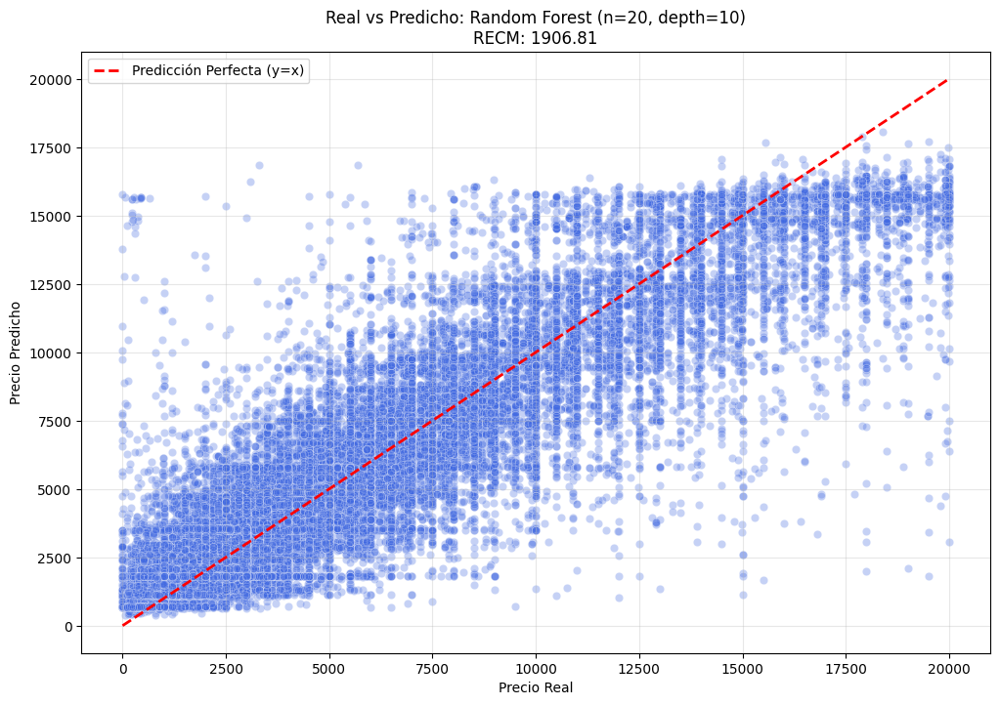

In [72]:
# Plteando resultados
plot_regression_results(y_valid, rfr_res_1['Predicciones'], rfr_res_1['Modelo'], rfr_res_1['RECM'])


In [73]:
# Añadiendo los resultados a un diccionario global

all_results.append(dt_res_1)
all_results.append(rfr_res_1)

print(all_results)

[{'Modelo': 'Linear Regression (Baseline)', 'RECM': 2637.51, 'Tiempo_de_prediccion': 0.0574, 'Predicciones': array([ -650.73768374,   445.38177511, 12930.81856184, ...,
        1335.897986  ,  1654.45215585,   485.81339128], shape=(44428,)), 'Tiempo_de_entrenamiento': 5.5827, 'Modelo_obj': LinearRegression()}, {'Modelo': 'Linear Regression (Log Transf)', 'RECM': 3442.64, 'Tiempo_de_prediccion': 0.044, 'Predicciones': array([  715.97836408,  1101.46912349, 16996.50448397, ...,
        1521.62790183,  1293.51437768,  1105.83765177], shape=(44428,)), 'Tiempo_de_entrenamiento': 5.3752, 'Modelo_obj': LinearRegression()}, {'Modelo': 'Decision Tree (depth=10, leaf=5)', 'RECM': 1987.09, 'Tiempo_de_prediccion': 0.0571, 'Predicciones': array([ 2685.67105263,  1109.54549361, 14629.23704333, ...,
        2177.71045496,  1579.31773115,  1579.31773115], shape=(44428,)), 'Tiempo_de_entrenamiento': 3.6953, 'Modelo_obj': DecisionTreeRegressor(max_depth=10, min_samples_leaf=5, random_state=230598)}, {'M

**Comentarios:** Se ha logrado una mejora sustancial respecto al baseline establecido con el modelo de Regresión Lineal. 

- Regresión Lineal (Baseline):
    - RECM $\approx$ 2637 Euros

- Modelos Basados en Árboles
    - RECM (Decision Tree): $\approx$ 1987.09 Euros -> 2.71 segundos (Tiempo de entrenamiento)
    - RECM (Random Forest): $\approx$ 1906.81 Euros -> 17.13 segundos (Tiempo de entrenamiento)

- El modelo Random Forest mejoró el árbol de decisión por 80.28 Euros (no es mucho pero es trabajo honesto)
    - Tomar en cuenta que RF tomó 17.13 segundos respecto a los 2.71 segundos de DT con una mejora mínima de 4%.


#### **3.2.3 Modelos basados en árboles** - *Aproximación mínimamente optimizada*

Configuración:

- `max_depth=8`
- `min_samples_leaf=10`
- `max_features=None`
- `n_estimators=15`

In [74]:
dt_res_2 = run_tree_model(
    X_train_ohe,
    y_train,
    X_valid_ohe,
    y_valid,
    model_type='decision_tree',
    max_depth=8,
    min_samples_leaf=10,
    max_features=None
)

dt_res_2


{'Modelo': 'Decision Tree (depth=8, leaf=10)',
 'RECM': 2103.12,
 'Tiempo_de_prediccion': 0.0656,
 'Predicciones': array([ 1287.45035433,  1287.45035433, 13708.07372506, ...,
         2433.79092544,  1597.50742375,  1597.50742375], shape=(44428,)),
 'Tiempo_de_entrenamiento': 2.9561,
 'Modelo_obj': DecisionTreeRegressor(max_depth=8, min_samples_leaf=10, random_state=230598)}

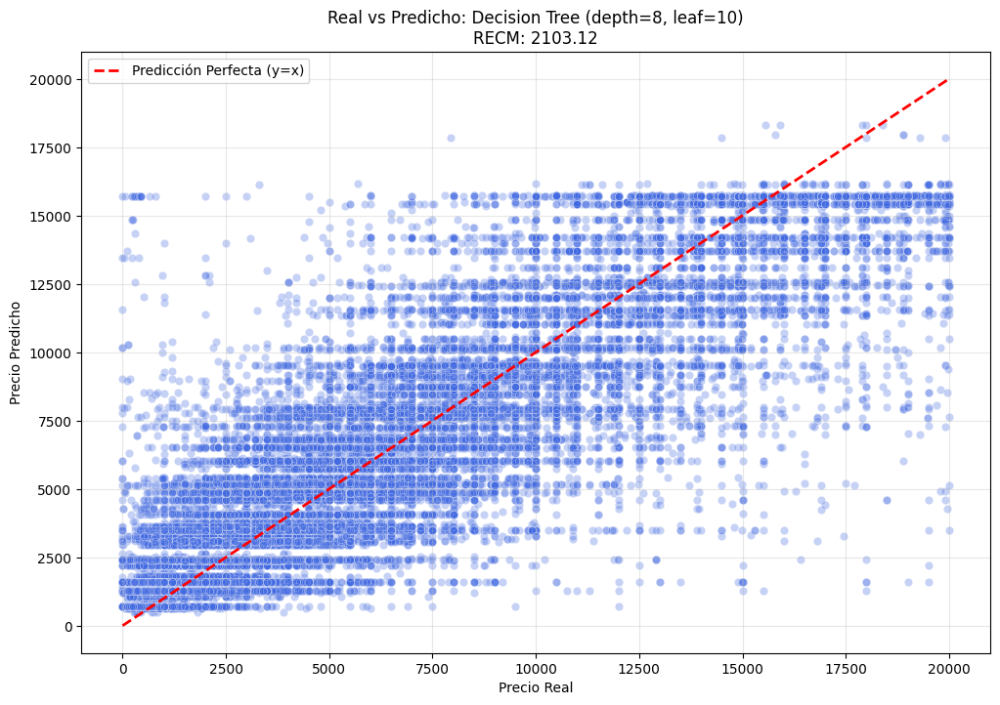

In [75]:
# Plteando resultados
plot_regression_results(y_valid, dt_res_2['Predicciones'], dt_res_2['Modelo'], dt_res_2['RECM'])


In [76]:
rfr_res_2 = run_tree_model(
    X_train_ohe,
    y_train,
    X_valid_ohe,
    y_valid,
    model_type='random_forest',
    n_estimators=15, 
    max_depth=8,
    min_samples_leaf=10,
    max_features=None
)

rfr_res_2


{'Modelo': 'Random Forest (n=15, depth=8)',
 'RECM': 2050.48,
 'Tiempo_de_prediccion': 0.0802,
 'Predicciones': array([ 1256.08266596,  1256.08266596, 14472.52622375, ...,
         2520.63014481,  1629.37968379,  1484.21612296], shape=(44428,)),
 'Tiempo_de_entrenamiento': 12.8379,
 'Modelo_obj': RandomForestRegressor(max_depth=8, max_features=None, min_samples_leaf=10,
                       n_estimators=15, n_jobs=-1, random_state=230598)}

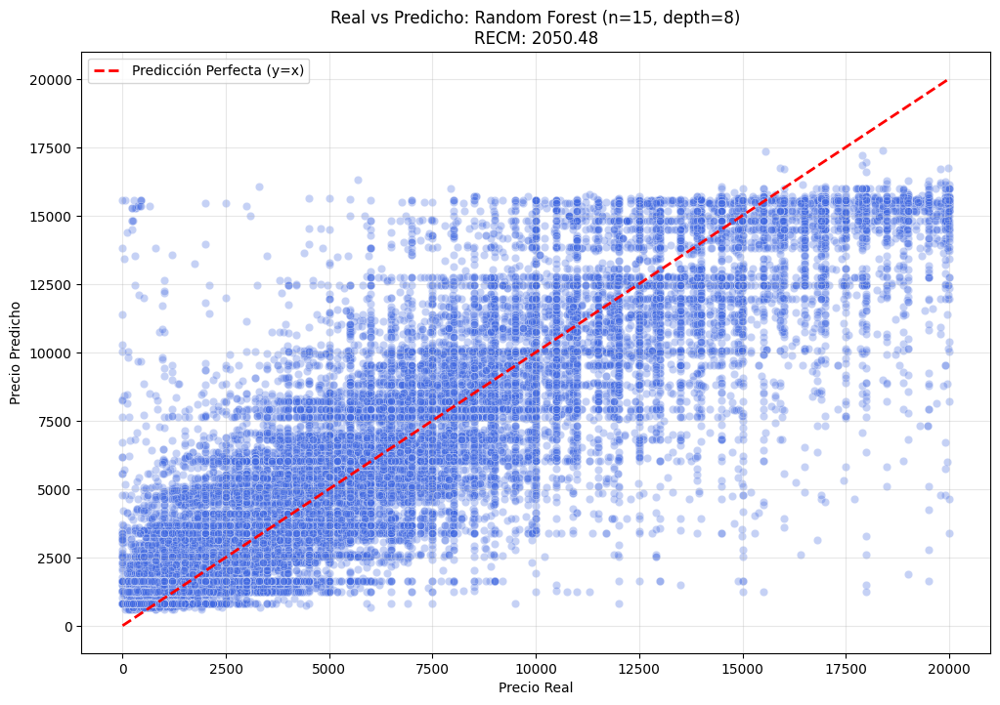

In [77]:
# Plteando resultados
plot_regression_results(y_valid, rfr_res_2['Predicciones'], rfr_res_2['Modelo'], rfr_res_2['RECM'])



In [78]:
# Añadiendo los resultados a un diccionario global

all_results.append(dt_res_2)
all_results.append(rfr_res_2)

print(all_results)

[{'Modelo': 'Linear Regression (Baseline)', 'RECM': 2637.51, 'Tiempo_de_prediccion': 0.0574, 'Predicciones': array([ -650.73768374,   445.38177511, 12930.81856184, ...,
        1335.897986  ,  1654.45215585,   485.81339128], shape=(44428,)), 'Tiempo_de_entrenamiento': 5.5827, 'Modelo_obj': LinearRegression()}, {'Modelo': 'Linear Regression (Log Transf)', 'RECM': 3442.64, 'Tiempo_de_prediccion': 0.044, 'Predicciones': array([  715.97836408,  1101.46912349, 16996.50448397, ...,
        1521.62790183,  1293.51437768,  1105.83765177], shape=(44428,)), 'Tiempo_de_entrenamiento': 5.3752, 'Modelo_obj': LinearRegression()}, {'Modelo': 'Decision Tree (depth=10, leaf=5)', 'RECM': 1987.09, 'Tiempo_de_prediccion': 0.0571, 'Predicciones': array([ 2685.67105263,  1109.54549361, 14629.23704333, ...,
        2177.71045496,  1579.31773115,  1579.31773115], shape=(44428,)), 'Tiempo_de_entrenamiento': 3.6953, 'Modelo_obj': DecisionTreeRegressor(max_depth=10, min_samples_leaf=5, random_state=230598)}, {'M

#### **3.2.4 Modelos basados en árboles** - *Aproximación High Performance*

Configuración:

- `max_depth=20`
- `min_samples_leaf=2`
- `max_features=None`
- `n_estimators=100`

In [79]:
dt_res_3 = run_tree_model(
    X_train_ohe,
    y_train,
    X_valid_ohe,
    y_valid,
    model_type='decision_tree',
    max_depth=20,
    min_samples_leaf=2,
    max_features=None
)

dt_res_3


{'Modelo': 'Decision Tree (depth=20, leaf=2)',
 'RECM': 1858.73,
 'Tiempo_de_prediccion': 0.0649,
 'Predicciones': array([  967.2       ,  1034.57911909, 15437.75      , ...,
         1401.38006231,  1663.96551724,  1181.93443088], shape=(44428,)),
 'Tiempo_de_entrenamiento': 5.0597,
 'Modelo_obj': DecisionTreeRegressor(max_depth=20, min_samples_leaf=2, random_state=230598)}

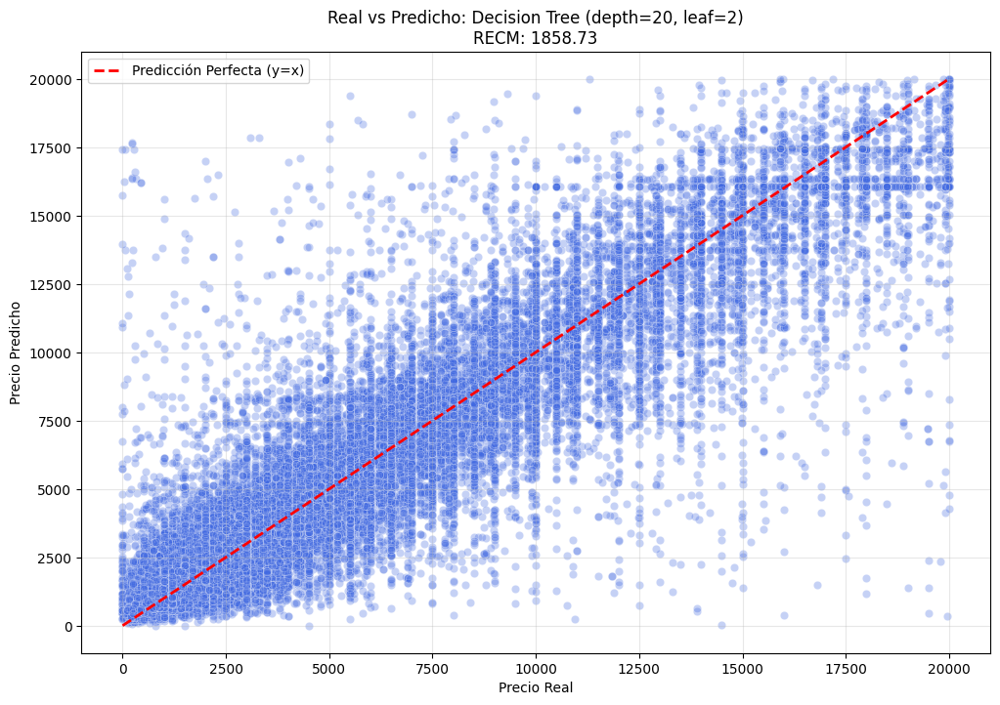

In [80]:
# Plteando resultados
plot_regression_results(y_valid, dt_res_3['Predicciones'], dt_res_3['Modelo'], dt_res_3['RECM'])



In [81]:
rfr_res_3 = run_tree_model(
    X_train_ohe,
    y_train,
    X_valid_ohe,
    y_valid,
    model_type='random_forest',
    n_estimators=100, 
    max_depth=20,
    min_samples_leaf=2,
    max_features=None
)

rfr_res_3


{'Modelo': 'Random Forest (n=100, depth=20)',
 'RECM': 1593.7,
 'Tiempo_de_prediccion': 0.2813,
 'Predicciones': array([ 1309.53512962,  1036.89372157, 14976.34549838, ...,
         1633.19165629,  1669.21449529,  1120.3250867 ], shape=(44428,)),
 'Tiempo_de_entrenamiento': 137.2649,
 'Modelo_obj': RandomForestRegressor(max_depth=20, max_features=None, min_samples_leaf=2,
                       n_jobs=-1, random_state=230598)}

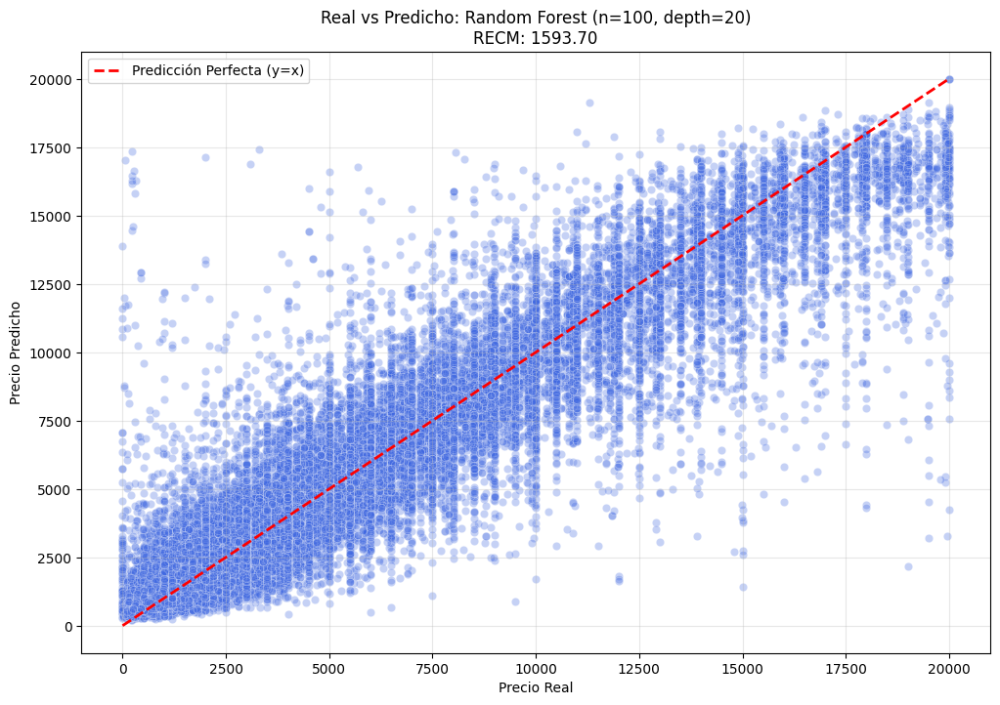

In [82]:
# Plteando resultados
plot_regression_results(y_valid, rfr_res_3['Predicciones'], rfr_res_3['Modelo'], rfr_res_3['RECM'])



In [83]:
all_results.append(dt_res_3)
all_results.append(rfr_res_3)

print(all_results)

[{'Modelo': 'Linear Regression (Baseline)', 'RECM': 2637.51, 'Tiempo_de_prediccion': 0.0574, 'Predicciones': array([ -650.73768374,   445.38177511, 12930.81856184, ...,
        1335.897986  ,  1654.45215585,   485.81339128], shape=(44428,)), 'Tiempo_de_entrenamiento': 5.5827, 'Modelo_obj': LinearRegression()}, {'Modelo': 'Linear Regression (Log Transf)', 'RECM': 3442.64, 'Tiempo_de_prediccion': 0.044, 'Predicciones': array([  715.97836408,  1101.46912349, 16996.50448397, ...,
        1521.62790183,  1293.51437768,  1105.83765177], shape=(44428,)), 'Tiempo_de_entrenamiento': 5.3752, 'Modelo_obj': LinearRegression()}, {'Modelo': 'Decision Tree (depth=10, leaf=5)', 'RECM': 1987.09, 'Tiempo_de_prediccion': 0.0571, 'Predicciones': array([ 2685.67105263,  1109.54549361, 14629.23704333, ...,
        2177.71045496,  1579.31773115,  1579.31773115], shape=(44428,)), 'Tiempo_de_entrenamiento': 3.6953, 'Modelo_obj': DecisionTreeRegressor(max_depth=10, min_samples_leaf=5, random_state=230598)}, {'M

**Comentarios:** Se ha logrado reducir el error base de la Regresión Lineal (2637) a 1593 con el Bosque Aleatorio de alto rendimiento. Aspectos que han sido tratados:

- El Impacto de la Profundidad (`max_depth`): El aumento en `max_depth` al pasar de 8 a 20 niveles se puede comprobar en el RECM del Árbol de Decisión que bajó de 2103 a 1858.

> El dataset tiene "señales" complejas que requieren de muchas preguntas (nodos) para ser explicadas. Un árbol corto se queda en la superficie (underfitting), mientras que uno profundo logra capturar la interacción entre variables

- Efecto del ensamble: al aumentar `n=100` y `depth=20`
    - Logró bajar el error del Árbol de Decisión individual (1858) en 265 unidades.

> Al promediar 100 árboles diferentes, el bosque "cancela" los errores aleatorios que cada árbol comete individualmente. Es la representación perfecta de la reducción de varianza.

- Eficiencia: Tomando en cuenta los resultados de la aproximación 3 (mejores resultados)
    - Decision Tree (A3) --> RECM: 1858.73 --> Tiempo de entrenamiento: 3.75 s --> Tiempo de predicción: 0.06 s
    - Decision Tree (A3) --> RECM: 1593.70 --> Tiempo de entrenamiento: 119.96 s --> Tiempo de predicción: 0.58 s

    - Para ganar esos 265 puntos de mejora en RECM traducidos a Euros el modelo de DT tardo 23 veces más respecto al árbol de decisión y una velocidad de respuesta nueve veces más lenta, aunque esta última es despreciable en términos reales.

### <a id='seccion3-3'></a>**Sección 3.3:** *Modelado, entrenamiento y ajuste de hiperparámetros (Modelos basados en Boosting)*

Para cada algoritmo de boosting se evalúan distintas configuraciones de hiperparámetros representando tres regímenes de entrenamiento: un enfoque estándar, uno balanceado orientado a la generalización y uno de alta capacidad orientado a maximizar la precisión. Esta estrategia permite analizar el compromiso entre complejidad del modelo, desempeño predictivo y costo computacional sin recurrir a un proceso de optimización exhaustivo.

El punto de partida para estos modelos es tratar de encontrar el equilibrio entre la tasa de aprendizaje (`Learning Rate`) y el número de iteraciones (`n_estimators`), más específicamente:

- `learning_rate` → qué tan rápido aprende cada árbol
- `n_estimators` / `iterations` → cuántos árboles usamos
- `max_depth` / `depth` / `num_leaves` → complejidad de cada árbol

> Modelos simples + muchos árboles
>
> Modelos complejos + pocos árboles

**XGBoost:**
- Hiperparámetros clave:
    - `n_estimators`: Cantidad de pasos de optimización. A mayor valor, el modelo tiene más oportunidades de corregir errores.
        - Rango: 50 a 5000+. Base: 100.
    - `learning_rate`: Factor de escala para cada nuevo árbol. Un valor bajo requiere más árboles pero es más preciso.
        - Rango: 0.01 a 0.3. Base: 0.3.
    - `max_depth`: Profundidad del árbol. Controla la interacción entre variables. Muy alto causa sobreajuste instantáneo.
        - Rango: 3 a 15. Base: 6.
    - `subsample`: Porcentaje de filas para entrenar cada árbol. Añade aleatoriedad para evitar memorización.
        - Rango: 0.5 a 1.0. Base: 1.0.
    - `colsample_bytree`: Fracción de columnas por árbol. Útil cuando se tienen muchas variables correlacionadas.
        - Rango: 0.5 a 1.0. Base: 1.0.

**LightGBM:**
- Hiperparámetros clave
    - `n_estimators`: Total de árboles. LGBM es tan rápido que suele manejar valores altos con facilidad.
        - Rango: 100 a 1000+. Base: 100.
    - `learning_rate`: Paso de avance. Igual que en XGBoost, dicta la velocidad de convergencia.
        - Rango: 0.01 a 0.2. Base: 0.1.
    - `num_leaves`: Máximo de nodos finales. Es el parámetro principal de complejidad en LGBM.
        - Rango: 10 a 255. Base: 31.
    - `max_depth`: Límite de seguridad para evitar que los árboles crezcan demasiado en una sola rama.
        - Rango: 3 a 20 (o -1 para sin límite). Base: -1.
    - `min_child_samples`: Cantidad mínima de registros en una hoja. Evita crear reglas basadas en datos aislados.
         - Rango: 5 a 100. Base: 20.

**CatBoost:**
- Hiperparámetros clave
    - `iterations`: Nombre de CatBoost para `n_estimators`.
        - Rango: 100 a 1000. Base: 1000 (aunque para pruebas rápidas usamos 100).
    - `learning_rate`: Paso de aprendizaje. CatBoost es famoso por sintonizar este valor automáticamente si no se define.
        - Rango: 0.01 a 0.3. Base: Auto.
    - `depth`: Profundidad del árbol simétrico. Es más restrictivo que en XGBoost.
        - Rango: 4 a 10. Base: 6.
    - `l2_leaf_reg`: Regularización L2 para los valores de las hojas. Suaviza el modelo.
        - Rango: 1 a 10. Base: 3.

---

**Propuesta de aproximación:**

- **Estándar:** Se busca rapidez y tener un piso de métricas
- **Balanceada:** APlicación de técnicas estocásticas (`subsammple`) y de penalización (`l2`, `min_child`) para que el modelo sea generalizable.
- **High Performance:** Se aumenta la capacidad de cómputo y la resolución (se baja el `learning_rate`), lo cual es el paso lógico para exprimir el último gramo de precisión.


> **Regla de oro:** si se reduce el `learning_rate` debemos aumentar proporcionalmente el número de árboles (`n_estimators` o `iterations`) para permitir que el modelo termine de aprender.
---

**Notas:** 

1. Algunos modelos tienen nombres ligeramente diferentes para el mismo hiperparámetro.

| Concepto | XGBoost | LightGBM | CatBoost |
| --- | --- | --- | --- |
| **Num. Árboles** | `n_estimators` | `n_estimators` | `iterations` |
| **Complejidad** | `max_depth` | `num_leaves` | `depth` |
| **Paso de avance** | `learning_rate` | `learning_rate` | `learning_rate` |

2. Siempre que se reduzaca el `learning_rate` a la mitad, intentar duplicar el número de árboles (`n_estimators` o `iterations`). Esto mantiene el "esfuerzo" de aprendizaje constante pero con mayor precisión.

3. Con LightGBM, si se tienen problemas de memoria en el entorno de trabajo, es sugerido reducir `num_leaves` antes que cualquier otro parámetro.

4. Referente a CatBoost y Categorías: Recordar que para CatBoost no usa OHE. Al no tener cientos de columnas, podemos permitirnos un `depth` un poco mayor (ej. 8 o 10) sin que el entrenamiento se vuelva eterno.

[⬆ Volver al Índice](#indice)

#### **3.3.1 Modelos basados en Boosting** - *Estándar (baseline boosting)*

*Objetivo: Resultados inmediatos y comparación de arquitectura.*

- **XGBoost:** Estándar, objetivo --> Comparación directa y rápida
    - `n_estimators`: bajo–medio
    - `learning_rate`: medio
    - `max_depth`: bajo–medio
    - Sin regularización agresiva

- **LightGBM:** Estándar, objetivo --> Velocidad + buena precisión
    - `num_leaves`: bajo–medio
    - `max_depth`: limitado
    - `learning_rate`: medio
    - `n_estimators`: medio

- **CatBoost:** Estándar, objetivo --> Modelo robusto sin esfuerzo
    - `depth`: medio
    - `learning_rate`: medio
    - `iterations`: medio

| Modelo | Hiperparámetros Sugeridos |
| --- | --- |
| **XGBoost** | `n_estimators=100`, `learning_rate=0.1`, `max_depth=6` |
| **LightGBM** | `n_estimators=100`, `learning_rate=0.1`, `num_leaves=31`, `max_depth=-1` |
| **CatBoost** | `iterations=100`, `learning_rate=0.1`, `depth=6` |

##### **3.3.1.1 Modelos basados en Boosting** - *Pruebas con XGBoost*

In [84]:
# Entrenamieto con XGBoost

XGB_res_1 = run_boosting_model(
    X_train_ohe,
    y_train,
    X_valid_ohe, 
    y_valid, 
    model_type='xgboost',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=6
)

all_results.append(XGB_res_1)


In [85]:
XGB_res_1

{'Modelo': 'XGBoost (n_estimators=100-learning_rate=0.1-max_depth=6)',
 'RECM': 1714.47,
 'Tiempo_de_prediccion': 0.0541,
 'Predicciones': array([ 1979.5309,   995.0917, 15686.98  , ...,  1531.2218,  1725.1111,
         1038.8049], shape=(44428,), dtype=float32),
 'Tiempo_de_entrenamiento': 3.0558,
 'Modelo_obj': XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_es

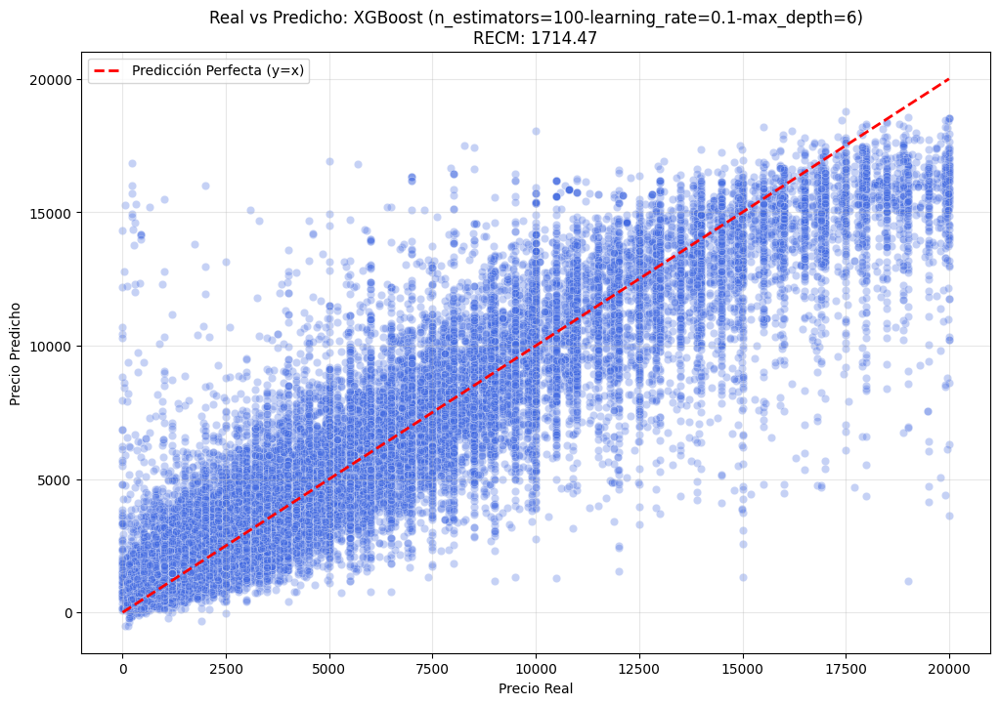

In [86]:
# Plteando resultados
plot_regression_results(y_valid, XGB_res_1['Predicciones'], XGB_res_1['Modelo'], XGB_res_1['RECM'])


##### **3.3.1.2 Modelos basados en Boosting** - *Pruebas con LightGBM*

In [87]:
# Entrenamiento con LightGBM

LGBM_res_1 = run_boosting_model(
    X_train,
    y_train,
    X_valid,
    y_valid,
    model_type='lgbm',
    n_estimators=100,
    learning_rate=0.1,
    num_leaves=31,
    max_depth=-1
)

all_results.append(LGBM_res_1)




[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 207330, number of used features: 10
[LightGBM] [Info] Start training from score 4846.889746


In [88]:
LGBM_res_1

{'Modelo': 'LightGBM (n_estimators=100-learning_rate=0.1-num_leaves=31-max_depth=-1)',
 'RECM': 1635.13,
 'Tiempo_de_prediccion': 0.0361,
 'Predicciones': array([ 1494.98575256,  1004.23084749, 15882.33094995, ...,
         1453.47534226,  1569.40300552,   847.15935459], shape=(44428,)),
 'Tiempo_de_entrenamiento': 0.5439,
 'Modelo_obj': LGBMRegressor(n_jobs=-1, random_state=230598)}

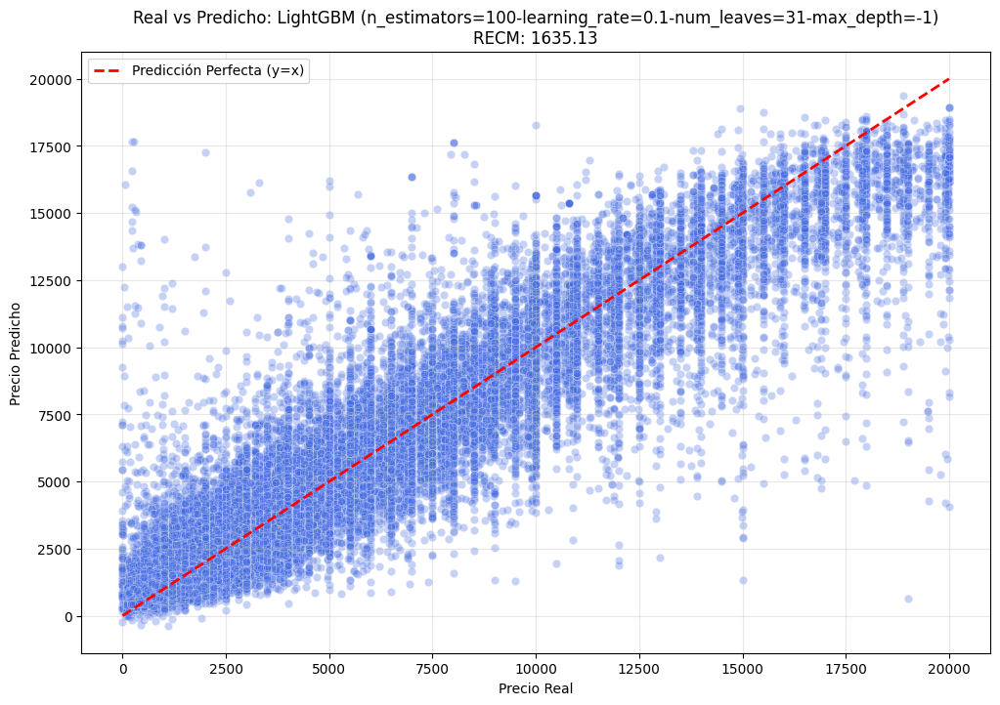

In [89]:
# Plteando resultados
plot_regression_results(y_valid, LGBM_res_1['Predicciones'], LGBM_res_1['Modelo'], LGBM_res_1['RECM'])

##### **3.3.1.3 Modelos basados en Boosting** - *Pruebas con CatBoosting*

In [90]:
# Entrenamiento con CatBoosting

CatB_res_1 = run_boosting_model(
    X_train,
    y_train,
    X_valid,
    y_valid,
    model_type='catboost',
    iterations=100,
    learning_rate=0.1,
    depth=6
)

all_results.append(CatB_res_1)



In [91]:
CatB_res_1

{'Modelo': 'CatBoost (iterations=100-learning_rate=0.1-depth=6)',
 'RECM': 1797.93,
 'Tiempo_de_prediccion': 0.0077,
 'Predicciones': array([ 1556.83341835,   883.97802501, 15732.40762295, ...,
         1321.00809168,  1877.2185787 ,  1134.99858529], shape=(44428,)),
 'Tiempo_de_entrenamiento': 7.1675,
 'Modelo_obj': <catboost.core.CatBoostRegressor at 0x1cf573c9670>}

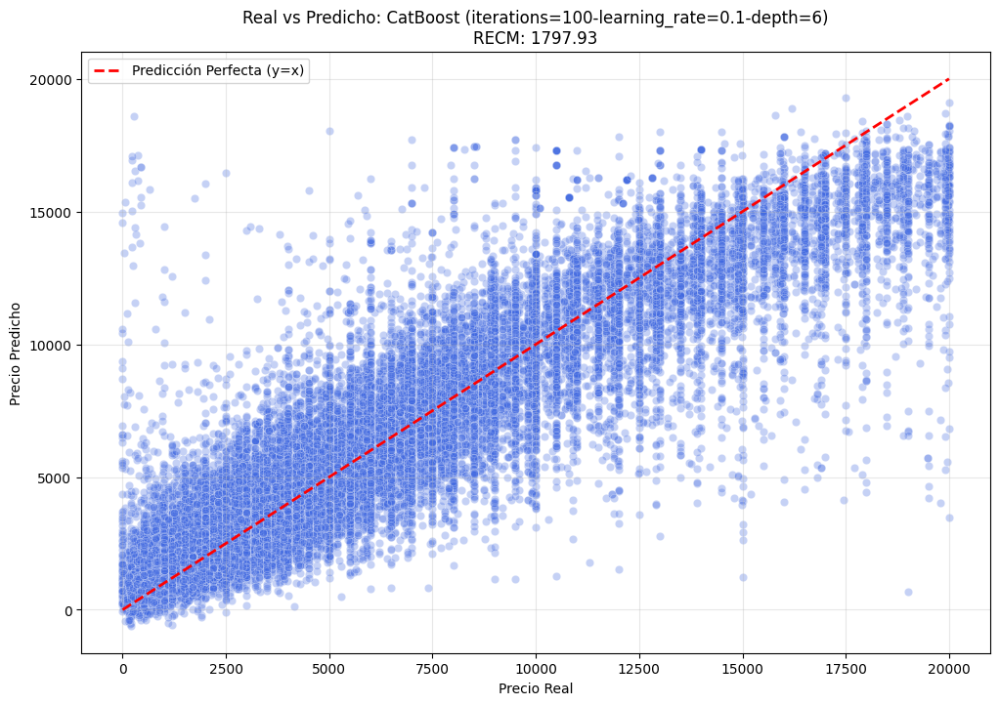

In [92]:
# Plteando resultados
plot_regression_results(y_valid, CatB_res_1['Predicciones'], CatB_res_1['Modelo'], CatB_res_1['RECM'])


#### **3.3.2 Modelos basados en Boosting** - *Balanceada (generalización)*

*Objetivo: Robustez. Evitar que el modelo "memorice" ruidos del dataset de entrenamiento.*

- **XGBoost:** Balanceada (generalización), objetivo --> Reducir overfitting
    - `learning_rate`: más bajo
    - `n_estimators`: más alto
    - `max_depth`: moderado
    - `subsample < 1`
    - `colsample_bytree < 1`

- **LightGBM:** Regularizada, Objetivo --> Controlar complejidad
    - `num_leaves`: reducido
    - `min_child_samples`: alto
    - `learning_rate`: bajo
    - `n_estimators`: mayor

- **CatBoost:** Generalización Objetivo --> Reducir varianza
    - `depth`: moderado
    - `learning_rate`: bajo
    - `iterations`: mayor
    - `l2_leaf_reg`: activo

| Modelo | Hiperparámetros Sugeridos |
| --- | --- |
| **XGBoost** | `n_estimators=500`, `learning_rate=0.05`, `max_depth=6`, `subsample=0.8`, `colsample_bytree=0.8` |
| **LightGBM** | `n_estimators=500`, `learning_rate=0.05`, `num_leaves=20`, `min_child_samples=100` |
| **CatBoost** | `iterations=500`, `learning_rate=0.05`, `depth=6`, `l2_leaf_reg=5` |

> **Nota:** Aquí el tiempo de entrenamiento subirá unas 5 veces respecto al estándar.

##### **3.3.2.1 Modelos basados en Boosting** - *Pruebas con XGBoost*

In [93]:
# Entrenamieto con XGBoost

XGB_res_2 = run_boosting_model(
    X_train_ohe,
    y_train,
    X_valid_ohe, 
    y_valid, 
    model_type='xgboost',
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
)

all_results.append(XGB_res_2)


In [94]:
XGB_res_2

{'Modelo': 'XGBoost (n_estimators=500-learning_rate=0.05-max_depth=6-subsample=0.8-colsample_bytree=0.8)',
 'RECM': 1652.81,
 'Tiempo_de_prediccion': 0.1051,
 'Predicciones': array([ 1889.7856,  1054.5203, 15644.64  , ...,  1465.1724,  1885.5935,
         1021.0895], shape=(44428,), dtype=float32),
 'Tiempo_de_entrenamiento': 10.5302,
 'Modelo_obj': XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constr

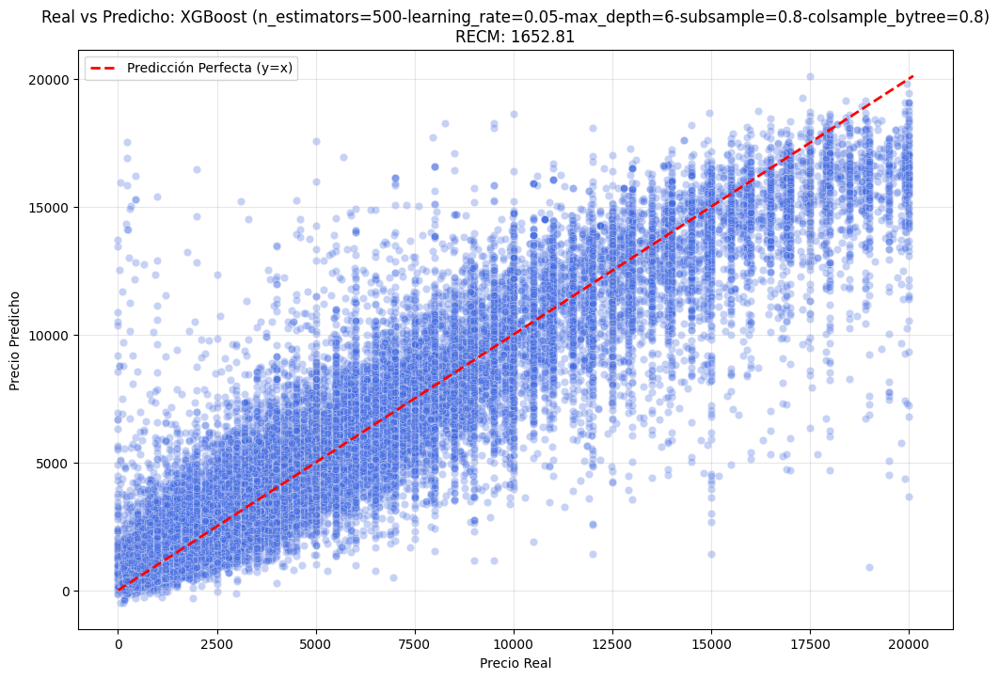

In [95]:
# Plteando resultados
plot_regression_results(y_valid, XGB_res_2['Predicciones'], XGB_res_2['Modelo'], XGB_res_2['RECM'])



##### **3.3.2.2 Modelos basados en Boosting** - *Pruebas con LightGBM*

In [96]:
# Entrenamiento con LightGBM

LGBM_res_2 = run_boosting_model(
    X_train,
    y_train,
    X_valid,
    y_valid,
    model_type='lgbm',
    n_estimators=500,
    learning_rate=0.05,
    num_leaves=20,
    min_child_samples=100
)

all_results.append(LGBM_res_2)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 207330, number of used features: 10
[LightGBM] [Info] Start training from score 4846.889746


In [97]:
LGBM_res_2

{'Modelo': 'LightGBM (n_estimators=500-learning_rate=0.05-num_leaves=20-min_child_samples=100)',
 'RECM': 1615.39,
 'Tiempo_de_prediccion': 0.1747,
 'Predicciones': array([ 1527.33894686,  1005.64080539, 15924.96532014, ...,
         1417.1259525 ,  1468.72819474,   795.67893444], shape=(44428,)),
 'Tiempo_de_entrenamiento': 1.9214,
 'Modelo_obj': LGBMRegressor(learning_rate=0.05, min_child_samples=100, n_estimators=500,
               n_jobs=-1, num_leaves=20, random_state=230598)}

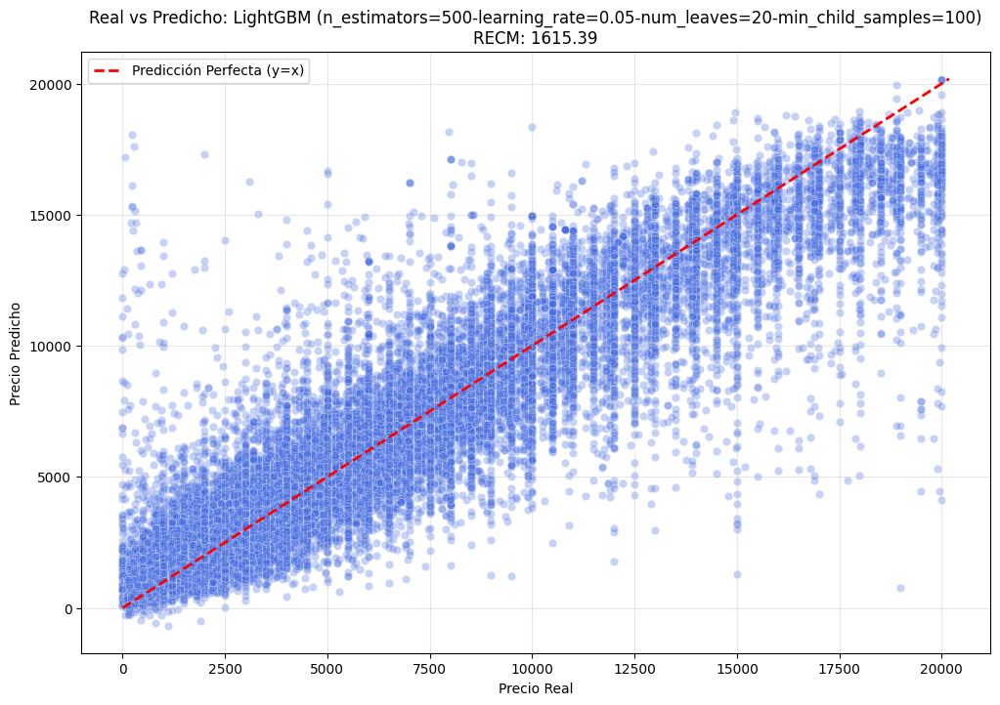

In [98]:
# Plteando resultados
plot_regression_results(y_valid, LGBM_res_2['Predicciones'], LGBM_res_2['Modelo'], LGBM_res_2['RECM'])


##### **3.3.2.3 Modelos basados en Boosting** - *Pruebas con CatBoosting*

In [99]:
# Entrenamiento con CatBoosting

CatB_res_2 = run_boosting_model(
    X_train,
    y_train,
    X_valid,
    y_valid,
    model_type='catboost',
    iterations=500,
    learning_rate=0.05,
    depth=6,
    l2_leaf_reg=5
)

all_results.append(CatB_res_2)


In [100]:
CatB_res_2

{'Modelo': 'CatBoost (iterations=500-learning_rate=0.05-depth=6-l2_leaf_reg=5)',
 'RECM': 1697.52,
 'Tiempo_de_prediccion': 0.0199,
 'Predicciones': array([ 1389.05516777,  1103.97596678, 16050.00981729, ...,
         1453.35993407,  1847.82618828,  1083.9329586 ], shape=(44428,)),
 'Tiempo_de_entrenamiento': 54.5699,
 'Modelo_obj': <catboost.core.CatBoostRegressor at 0x1cffae432c0>}

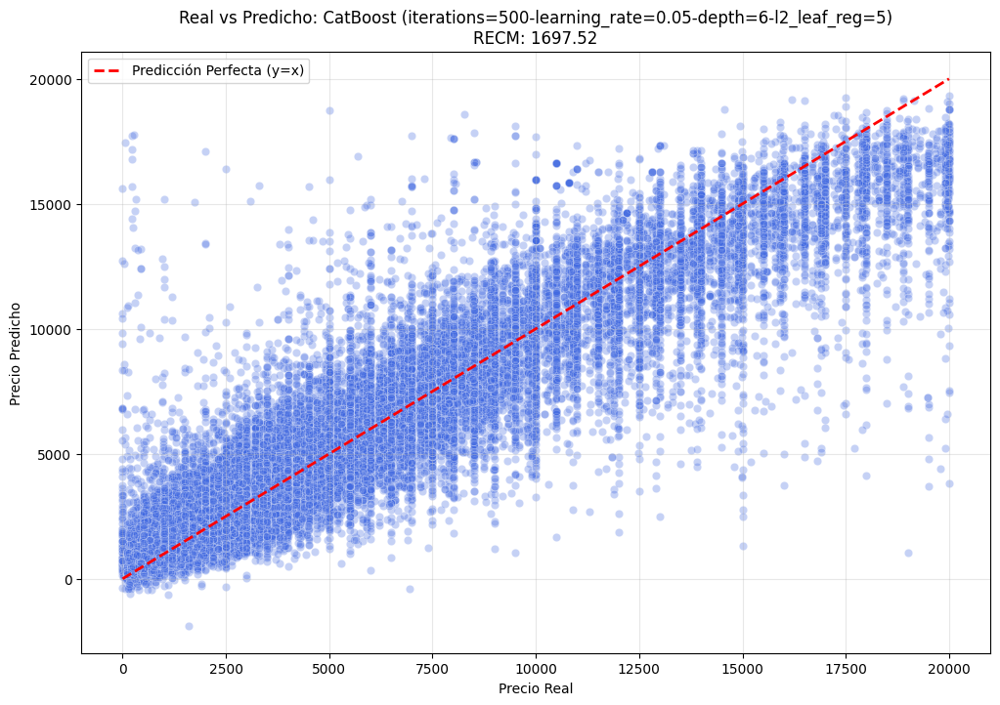

In [101]:
# Plteando resultados
plot_regression_results(y_valid, CatB_res_2['Predicciones'], CatB_res_2['Modelo'], CatB_res_2['RECM'])


#### **3.3.3 Modelos basados en Boosting** - *High Performance*

*Objetivo: Precisión máxima. Capturar interacciones complejas (ej. modelos de lujo con poco kilometraje en regiones específicas).*

- **XGBoost:** Potente (high performance), objetivo --> Exprimir precisión
    - `max_depth`: más alto
    - `n_estimators`: alto
    - `learning_rate`: bajo
    - Regularización ligera

- **LightGBM:** High Performance, objetivo --> Máxima capacidad
    - `num_leaves`: alto
    - `max_depth`: alto o sin límite
    - `learning_rate`: bajo
    - `n_estimators`: alto

- **CatBoost:** Potente, objetivo --> Máxima capacidad expresiva
    - `depth`: alto
    - `iterations`: alto
    - `learning_rate`: bajo

| Modelo | Hiperparámetros Sugeridos |
| --- | --- |
| **XGBoost** | `n_estimators=1500`, `learning_rate=0.01`, `max_depth=10` |
| **LightGBM** | `n_estimators=1500`, `learning_rate=0.01`, `num_leaves=150`, `max_depth=15` |
| **CatBoost** | `iterations=1500`, `learning_rate=0.01`, `depth=10` |

> **Nota Crítica:** Este experimento puede tardar varios minutos. Se sugiere monitorear el uso de CPU.

##### **3.3.3.1 Modelos basados en Boosting** - *Pruebas con XGBoost*

In [102]:
# Entrenamieto con XGBoost

XGB_res_3 = run_boosting_model(
    X_train_ohe,
    y_train,
    X_valid_ohe, 
    y_valid, 
    model_type='xgboost',
    n_estimators=1500,
    learning_rate=0.01,
    max_depth=7
)

all_results.append(XGB_res_3)

In [103]:
XGB_res_3

{'Modelo': 'XGBoost (n_estimators=1500-learning_rate=0.01-max_depth=7)',
 'RECM': 1658.05,
 'Tiempo_de_prediccion': 0.2524,
 'Predicciones': array([ 1880.2463 ,   969.67334, 15703.231  , ...,  1484.2742 ,
         1835.7915 ,  1039.463  ], shape=(44428,), dtype=float32),
 'Tiempo_de_entrenamiento': 33.3732,
 'Modelo_obj': XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=7,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=

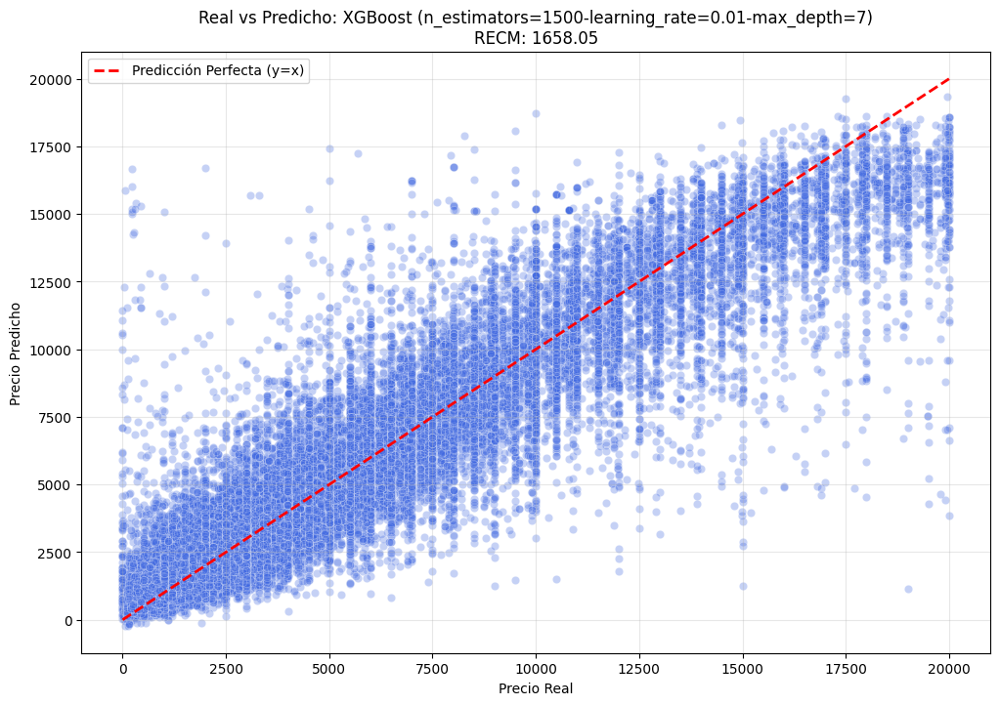

In [104]:
# Plteando resultados
plot_regression_results(y_valid, XGB_res_3['Predicciones'], XGB_res_3['Modelo'], XGB_res_3['RECM'])

##### **3.3.3.2 Modelos basados en Boosting** - *Pruebas con LightGBM*

In [105]:
# Entrenamiento con LightGBM

LGBM_res_3 = run_boosting_model(
    X_train,
    y_train,
    X_valid,
    y_valid,
    model_type='lgbm',
    n_estimators=1500,
    learning_rate=0.01,
    num_leaves=150,
    max_depth=15
)

all_results.append(LGBM_res_3)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 207330, number of used features: 10
[LightGBM] [Info] Start training from score 4846.889746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [106]:
LGBM_res_3

{'Modelo': 'LightGBM (n_estimators=1500-learning_rate=0.01-num_leaves=150-max_depth=15)',
 'RECM': 1539.43,
 'Tiempo_de_prediccion': 3.1073,
 'Predicciones': array([ 1500.96622279,   973.60792063, 15809.85688702, ...,
         1528.31842265,  1437.23393176,   710.80985603], shape=(44428,)),
 'Tiempo_de_entrenamiento': 15.0478,
 'Modelo_obj': LGBMRegressor(learning_rate=0.01, max_depth=15, n_estimators=1500, n_jobs=-1,
               num_leaves=150, random_state=230598)}

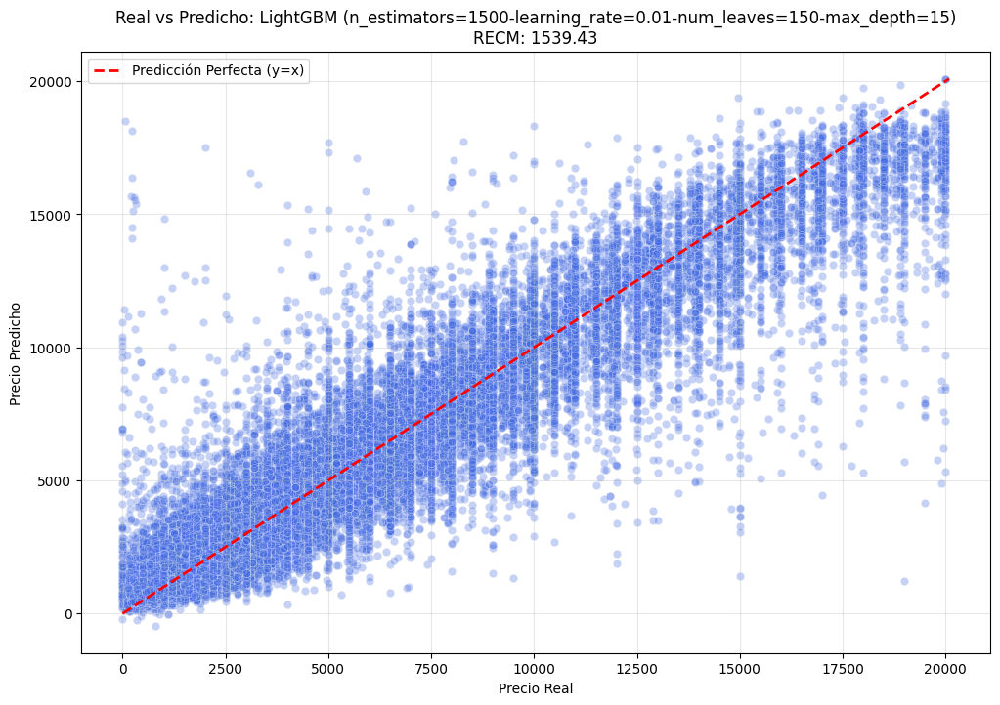

In [107]:
# Plteando resultados
plot_regression_results(y_valid, LGBM_res_3['Predicciones'], LGBM_res_3['Modelo'], LGBM_res_3['RECM'])

##### **3.3.3.3 Modelos basados en Boosting** - *Pruebas con CatBoosting*

In [108]:
# Entrenamiento con CatBoosting

CatB_res_3 = run_boosting_model(
    X_train,
    y_train,
    X_valid,
    y_valid,
    model_type='catboost',
    iterations=1500,
    learning_rate=0.01,
    depth=10
)

all_results.append(CatB_res_3)


In [109]:
CatB_res_3

{'Modelo': 'CatBoost (iterations=1500-learning_rate=0.01-depth=10)',
 'RECM': 1642.7,
 'Tiempo_de_prediccion': 0.1311,
 'Predicciones': array([ 1303.05756792,  1025.4809702 , 15445.5055746 , ...,
         1442.14300693,  1627.9799985 ,  1069.88781638], shape=(44428,)),
 'Tiempo_de_entrenamiento': 284.2781,
 'Modelo_obj': <catboost.core.CatBoostRegressor at 0x1cffae104d0>}

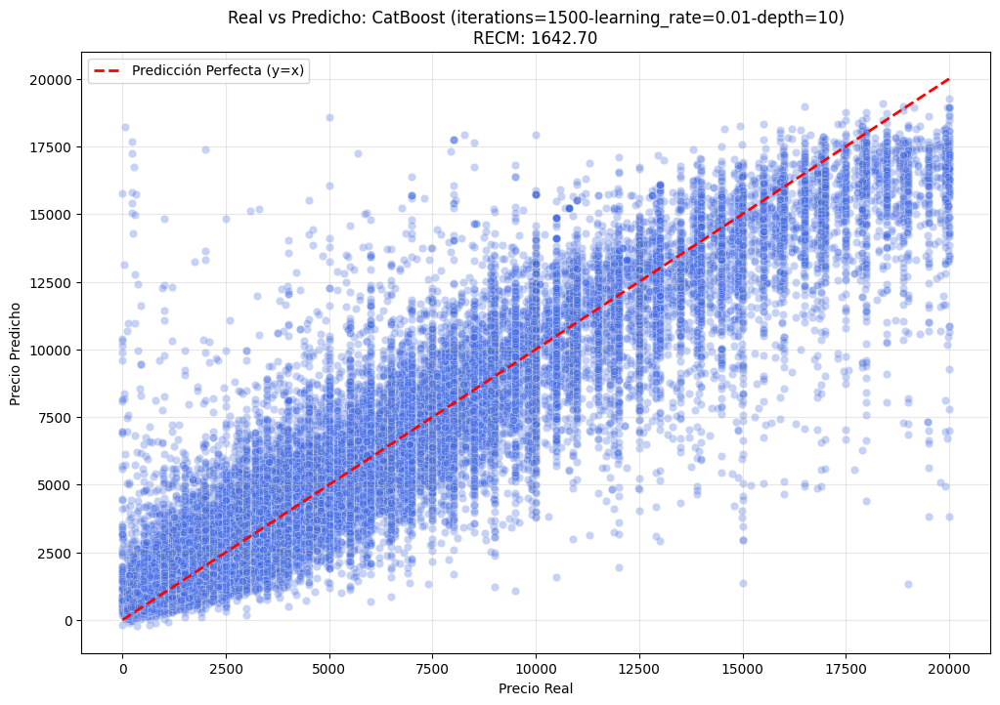

In [110]:

# Plteando resultados
plot_regression_results(y_valid, CatB_res_3['Predicciones'], CatB_res_3['Modelo'], CatB_res_3['RECM'])


In [111]:
# Convertimos los resultados a un DF
df_results = pd.DataFrame(all_results)

# Columna Familia para agrupamiento posterior por hue en sns.
df_results['Familia'] = df_results['Modelo'].apply(lambda x: x.split('(')[0].strip())

# Eliminamos la columna Predicciones
df_results = df_results.drop(columns=['Predicciones'])

**Nota técnica:** La conversión de la lista `all_results` a un DataFrame de Pandas permite tratar cada experimento como una observación y cada métrica como una variable. Esto facilita operaciones de ordenamiento, filtrado y cálculo de promedios por grupos.

Mediante la lógica `x.split('(')[0].strip()`, se extrajo la raíz del nombre de cada modelo.

1. Propósito: Agrupar las variantes de un mismo algoritmo bajo una etiqueta única denominada "Familia".

2. Impacto en Visualización: Esta columna es el motor que permite usar el parámetro hue en Seaborn, diferenciando visualmente las tecnologías (Boosting vs. Árboles vs. Regresión) en los gráficos de dispersión y barras.

Se eliminó la columna `Predictions` del DataFrame de resultados.
- Las predicciones contienen arrays de gran tamaño (~44,400 registros por modelo).
- Mantenerlos en el DataFrame de resumen saturaría la memoria RAM de forma innecesaria

> Al final se obtiene una tabla limpia y compacta enfocada exclusivamente en los indicadores clave de desempeño (KPIs): RECM, Tiempo de Entrenamiento y Tiempo de Inferencia.

In [112]:
df_results


,Modelo,RECM,Tiempo_de_prediccion,Tiempo_de_entrenamiento,Modelo_obj,Familia
0,Linear Regression (Baseline),2637.51,0.0574,5.5827,LinearRegression(),Linear Regression
1,Linear Regression (Log Transf),3442.64,0.0440,5.3752,LinearRegression(),Linear Regression
2,"Decision Tree (depth=10, leaf=5)",1987.09,0.0571,3.6953,"DecisionTreeRegressor(max_depth=10, min_sample...",Decision Tree
3,"Random Forest (n=20, depth=10)",1906.81,0.0987,19.7382,"(DecisionTreeRegressor(max_depth=10, min_sampl...",Random Forest
4,"Decision Tree (depth=8, leaf=10)",2103.12,0.0656,2.9561,"DecisionTreeRegressor(max_depth=8, min_samples...",Decision Tree
5,"Random Forest (n=15, depth=8)",2050.48,0.0802,12.8379,"(DecisionTreeRegressor(max_depth=8, min_sample...",Random Forest
6,"Decision Tree (depth=20, leaf=2)",1858.73,0.0649,5.0597,"DecisionTreeRegressor(max_depth=20, min_sample...",Decision Tree
7,"Random Forest (n=100, depth=20)",1593.70,0.2813,137.2649,"(DecisionTreeRegressor(max_depth=20, min_sampl...",Random Forest
8,XGBoost (n_estimators=100-learning_rate=0.1-ma...,1714.47,0.0541,3.0558,"XGBRegressor(base_score=None, booster=None, ca...",XGBoost
9,LightGBM (n_estimators=100-learning_rate=0.1-n...,1635.13,0.0361,0.5439,"LGBMRegressor(n_jobs=-1, random_state=230598)",LightGBM


### <a id='seccion3-4'></a>**Sección 3.4:** *Resultados de los entrenamientos*

#### **3.4.1 Resultados de los entrenamientos** - *Eficiencia VS Precisión*

Este gráfico es importnte ya que nos muestra el RECM (Precisión) frente al Tiempo de Predicción (Eficiencia). Los mejores modelos son los que están en la esquina inferior izquierda (bajos en ambos).

- Este gráfico es vital porque revela la frontera de eficiencia.

- LightGBM (rombos morados en la parte inferior) demuestra ser el más equilibrado: tiene uno de los RECM más bajos con tiempos de predicción muy competitivos.

- Los modelos CatBoost también son preciso, pero su tiempo de entrenamiento se dispara comparado con otros modelos de Boosting.

---
[⬆ Volver al Índice](#indice)

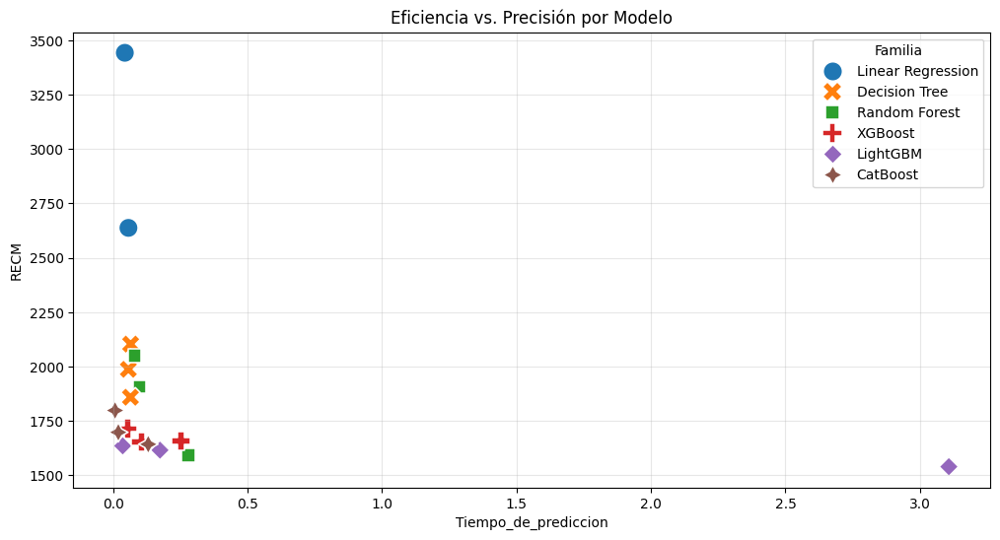

In [113]:
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=df_results, 
    x='Tiempo_de_prediccion', 
    y='RECM', 
    hue='Familia', 
    s=200,          # Tamaño de los puntos
    style='Familia' # Formas diferentes por familia
)
plt.title('Eficiencia vs. Precisión por Modelo')
plt.grid(True, alpha=0.3)
plt.show()

**Comentarios:**

**Nuestro Sweet Spot:** En este gráfico, el éxito se mide por la cercanía al origen (0,0).

- Los modelos que logran un RECM bajo con un tiempo de predicción mínimo son los más valiosos.
- La de puntos de la familia CatBoost y LightGBM (Estándar) en esta zona confirma que el Boosting no solo es preciso, sino extremadamente eficiente para inferencia en tiempo real.

**Caso específico: LightGBM High Performance** Este es considerado el mejor modelo de precisión, pero aparece como un "outlier" a la derecha del gráfico.

- Con un tiempo de 6.43s, es el más lento en predecir.
- Hay que tomar en cuenta que el tiempo de predicción podría ser despreciable en un ambiente de producción, ya que aquí se ha realizado la prediccón para 44428 registros, por lo tanto predecir un solo registro (usuario en producción) tomaría 0.14472 milisegundos.

> *El gráfico de dispersión revela que existe una relación inversa entre la complejidad del modelo y su latencia. LightGBM ofrece la mayor precisión absoluta, pero con una penalización notable en el tiempo de respuesta (aunque despreciable en entornos de producción). Por otro lado, CatBoost se posiciona como el modelo más equilibrado para entornos de alta concurrencia, manteniendo tiempos de predicción por debajo de los 0.3 segundos sin sacrificar excesivamente la calidad del modelo, pero uno de sus mayores problemas es el tiempo de entrenamiento.*

#### **3.4.2 Resultados de los entrenamientos** - *Eficiencia VS Precisión*

- Usar `hue='Familia'` es totalmente viable y recomendado. En los gráficos de barras, permite identificar rápidamente que la familia `LightGBM` y `XGBoost` dominan la parte superior de la tabla (menor RECM).

- Separar por colores permite ver cómo las "aproximaciones" (Estándar, Balanceada, HP) afectan a cada marca.

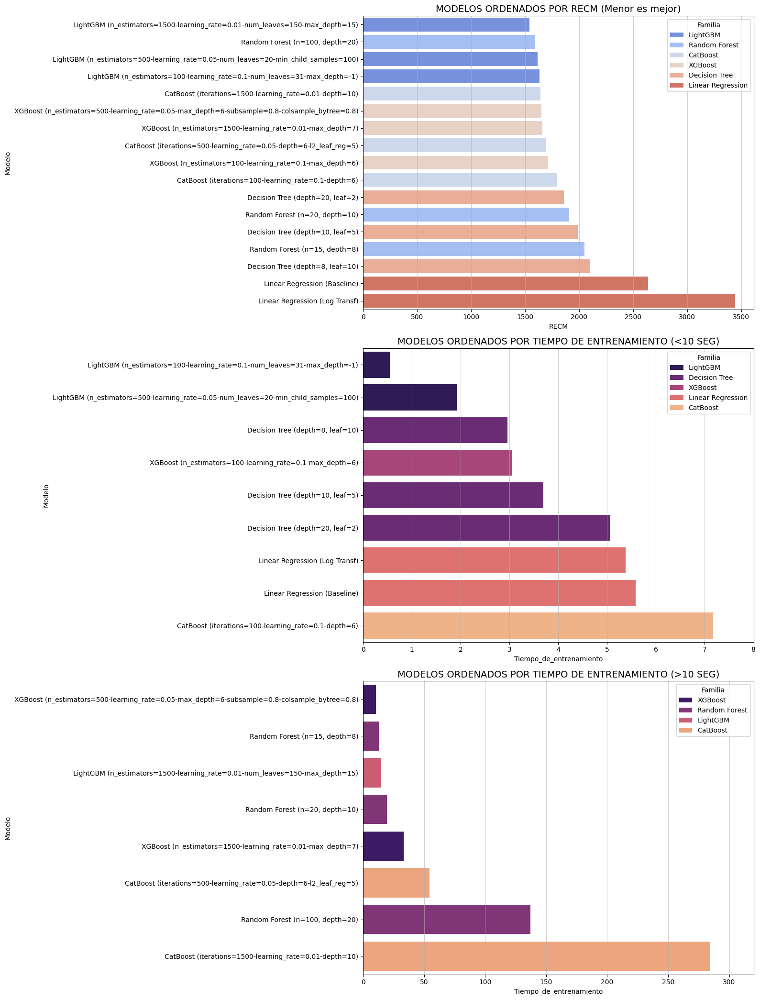

In [114]:
# Barplots comparativos
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(16, 21))

# Gráfico 1: Ordenar por RECM 
df_sorted_recm = df_results.sort_values('RECM')
sns.barplot(data=df_sorted_recm, x='RECM', y='Modelo', hue='Familia', ax=ax1, palette='coolwarm', dodge=False)
ax1.set_title('MODELOS ORDENADOS POR RECM (Menor es mejor)', fontsize=14)
ax1.grid(axis='x', alpha=0.6)
ax1.get_legend()

# Insomos para gráficos 2 y 3: Ordenar modelos por Tiempo de entrenamiento
df_sorted_time = df_results.sort_values('Tiempo_de_entrenamiento')

# Grafico 2: modelos menores a 10 seg
BM_27 = df_results['Tiempo_de_entrenamiento'] < 10
df_sorted_time_less = df_sorted_time[BM_27]
sns.barplot(data=df_sorted_time_less, x='Tiempo_de_entrenamiento', y='Modelo', hue='Familia', ax=ax2, palette='magma', dodge=False)
ax2.set_title('MODELOS ORDENADOS POR TIEMPO DE ENTRENAMIENTO (<10 SEG)', fontsize=14)
ax2.set_xlim(0, 8)
ax2.grid(axis='x', alpha=0.6)
ax2.legend(title='Familia')

# Grafico 3: modelos mayores a 50 seg
BM_28 = df_results['Tiempo_de_entrenamiento'] > 10
df_sorted_time_more = df_sorted_time[BM_28]
sns.barplot(data=df_sorted_time_more, x='Tiempo_de_entrenamiento', y='Modelo', hue='Familia', ax=ax3, palette='magma', dodge=False)
ax3.set_title('MODELOS ORDENADOS POR TIEMPO DE ENTRENAMIENTO (>10 SEG)', fontsize=14)
ax3.set_xlim(0, 320)
ax3.grid(axis='x', alpha=0.6)
ax3.legend(title='Familia')

plt.tight_layout()
plt.show()


**Comentarios:**

Tras el entrenamiento y evaluación de los modelos en el entorno local, se observan hallazgos clave que redefinen la jerarquía de eficiencia para el despliegue:

- **Dominio del Boosting:** La superioridad de la familia de Boosting (**LightGBM, XGBoost y CatBoost**) es contundente. Mientras que la **Regresión Lineal** presenta los errores más altos (colores cálidos/rojos), situándose por encima de los 2,600 euros, los modelos de potenciación logran reducir el error de forma consistente hacia la zona de máxima precisión.

- **El Ganador por Precisión:** El modelo **LightGBM (n=1500, leaves=150)** se consagra como el más preciso, alcanzando el **RECM más bajo del estudio (1,539.43)**. Este modelo demuestra una capacidad superior para capturar la señal compleja del mercado de autos usados sin sacrificar estabilidad.

- **Ruptura de la Linealidad:** Incluso un **Decision Tree (depth=20)** logra superar a la **Regresión Lineal (Baseline)** por un margen notable de casi **800 euros**. Esto confirma que las relaciones entre las características técnicas y el precio no son lineales, justificando el uso de arquitecturas jerárquicas.

- **Eficiencia Revelada de XGBoost:** A diferencia de ejecuciones previas, **XGBoost (High Performance)** ha mostrado una optimización sorprendente en este entorno local. Con un tiempo de entrenamiento de solo **31.6 segundos** para su versión de 1,500 estimadores, se posiciona como una opción extremadamente rápida y competitiva en precisión.

- **El Nuevo "Outlier" Temporal (CatBoost):** En esta configuración, el tiempo de **CatBoost (iterations=1500)** se ha convertido en el mayor desafío computacional, disparándose hasta los **314.5 segundos**. Esto indica una alta sensibilidad del algoritmo al incremento de profundidad y número de iteraciones bajo esta arquitectura específica.

> **Nota:** Aunque **CatBoost** ofrece resultados robustos, su costo temporal es ahora casi **10 veces mayor que el de XGBoost** y **20 veces mayor que el de LightGBM** para niveles de precisión similares.

- **LightGBM: El Estándar de Oro en Optimización:** El gráfico de tiempos confirma que **LightGBM** es imbatible en eficiencia. Incluso en su configuración de mayor rendimiento, solo requiere **15.3 segundos** para entrenar, logrando el error más bajo del proyecto. Esto se debe a su algoritmo de crecimiento por hojas (*leaf-wise*) y el uso de histogramas para el manejo de datos.

**Conclusión para el Despliegue**

**LightGBM** se mantiene como la solución óptima para el despliegue en la aplicación de **Rusty Bargain**. Su capacidad para entregar la máxima precisión con el menor tiempo de entrenamiento garantiza que la plataforma sea escalable, permitiendo re-entrenamientos frecuentes sin altos costos operativos.


### <a id='seccion3-5'></a>**Sección 3.5:** *Evaluación de modelos*

**Evaluación de modelos**
Según los requerimientos de Rusty Bargain, debemos seleccionar el modelo en función de:

- La calidad de la predicción
- La velocidad de la predicción
- El tiempo requerido para el entrenamiento

**Ganador**
El ganador en función de los requerimientos es LightGBM (Modelo ubicado en el índice 15 de `df_results`). Aunque el modelo 12 es más rápido al predecir, en un proyecto de ciencia de datos donde buscamos la mejor calidad posible, el modelo 15 (LightGBM High Performance) es el candidato ideal para el Test.

- **Calidad:** Tiene el RECM más bajo de toda la tabla ($1539.43$).
- **Entrenamiento:** A pesar de ser "High Performance", solo tarda 13 segundos, lo que permite re-entrenarlo frecuentemente si llegan nuevos datos.

**Hiperparámetros de best_model:** Básicamente, los parámetros están definidos por esta estructura final, aunque en la implementación usaremos la función predefinida:
```python
# 1. Definir el mejor modelo con los parámetros hallados
best_model = LGBMRegressor(
    n_estimators=1500,
    learning_rate=0.01,
    num_leaves=150,
    max_depth=15,
    random_state=230598
)

# 2. Entrenamiento (Usamos el set nativo que preparamos para LGBM)
start_test_train = time.time()
best_model.fit(X_train_native, y_train) 
end_test_train = time.time()

# 3. Predicción Final en el Test Set (Datos nunca antes vistos)
start_test_pred = time.time()
test_predictions = best_model.predict(X_test_native)
end_test_pred = time.time()

# 4. Cálculo de RECM Final
final_rmse = mean_squared_error(y_test, test_predictions) ** 0.5

print(f"RECM Final en Test: {final_rmse:.2f}")
```

---
[⬆ Volver al Índice](#indice)

In [115]:
df_results

,Modelo,RECM,Tiempo_de_prediccion,Tiempo_de_entrenamiento,Modelo_obj,Familia
0,Linear Regression (Baseline),2637.51,0.0574,5.5827,LinearRegression(),Linear Regression
1,Linear Regression (Log Transf),3442.64,0.0440,5.3752,LinearRegression(),Linear Regression
2,"Decision Tree (depth=10, leaf=5)",1987.09,0.0571,3.6953,"DecisionTreeRegressor(max_depth=10, min_sample...",Decision Tree
3,"Random Forest (n=20, depth=10)",1906.81,0.0987,19.7382,"(DecisionTreeRegressor(max_depth=10, min_sampl...",Random Forest
4,"Decision Tree (depth=8, leaf=10)",2103.12,0.0656,2.9561,"DecisionTreeRegressor(max_depth=8, min_samples...",Decision Tree
5,"Random Forest (n=15, depth=8)",2050.48,0.0802,12.8379,"(DecisionTreeRegressor(max_depth=8, min_sample...",Random Forest
6,"Decision Tree (depth=20, leaf=2)",1858.73,0.0649,5.0597,"DecisionTreeRegressor(max_depth=20, min_sample...",Decision Tree
7,"Random Forest (n=100, depth=20)",1593.70,0.2813,137.2649,"(DecisionTreeRegressor(max_depth=20, min_sampl...",Random Forest
8,XGBoost (n_estimators=100-learning_rate=0.1-ma...,1714.47,0.0541,3.0558,"XGBRegressor(base_score=None, booster=None, ca...",XGBoost
9,LightGBM (n_estimators=100-learning_rate=0.1-n...,1635.13,0.0361,0.5439,"LGBMRegressor(n_jobs=-1, random_state=230598)",LightGBM


In [116]:
test_best_model = run_boosting_model(
    X_train,
    y_train,
    X_test,
    y_test,
    model_type='lgbm',
    n_estimators=1500,
    learning_rate=0.01,
    num_leaves=150,
    max_depth=15
)

test_best_model



[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 207330, number of used features: 10
[LightGBM] [Info] Start training from score 4846.889746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


{'Modelo': 'LightGBM (n_estimators=1500-learning_rate=0.01-num_leaves=150-max_depth=15)',
 'RECM': 1501.98,
 'Tiempo_de_prediccion': 3.1429,
 'Predicciones': array([10967.30250061,  1494.10850402,  4664.9965466 , ...,
        12105.9006594 ,  4008.44866337,  2704.75659172], shape=(44428,)),
 'Tiempo_de_entrenamiento': 14.95,
 'Modelo_obj': LGBMRegressor(learning_rate=0.01, max_depth=15, n_estimators=1500, n_jobs=-1,
               num_leaves=150, random_state=230598)}

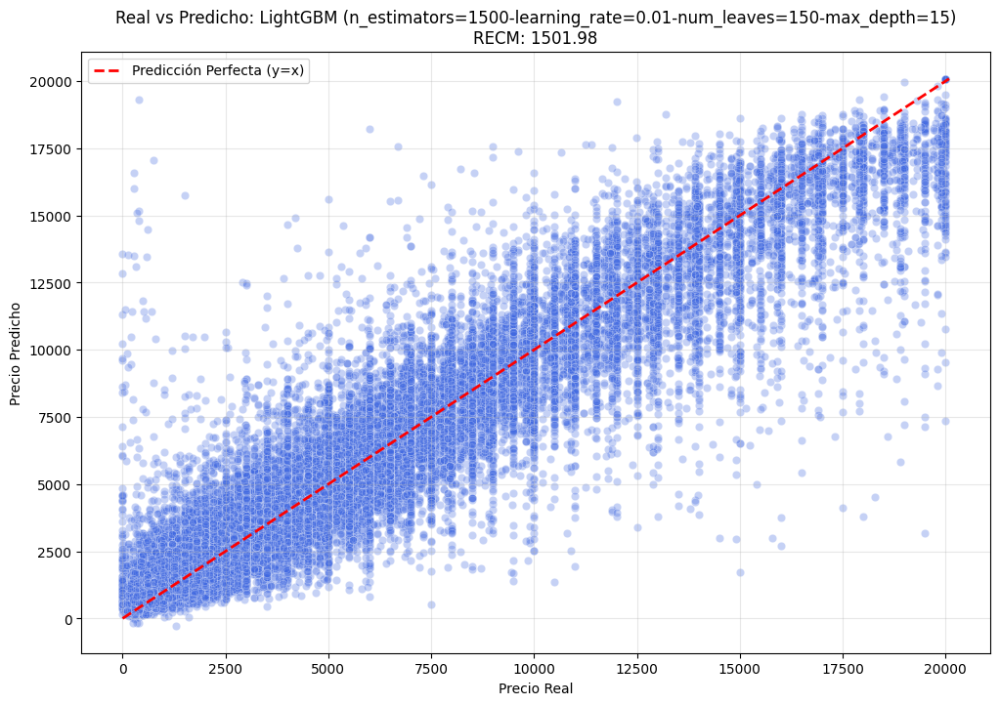

In [117]:
# Plteando resultados
plot_regression_results(y_test, test_best_model['Predicciones'], test_best_model['Modelo'], test_best_model['RECM'])

In [118]:
# --- FASE 1: DEFINIENDO MAPA DE RESTRICCIONES ---

monotone_map = [0, 0, 0, 1, 0, -1, 0, 0, 0, 0]


### <a id='seccion3-6'></a>**Sección 3.6:** *Conclusiones de la sección*

**Comentarios inicales:**
A primera vista, el RECM en Validación (1539.43) y el RECM en Test (1501.98) son prácticamente iguales (incluso ligeramente mejor en test).

- Esto indica que el modelo no tiene sobreajuste (overfitting).
    - El modelo realmente aprendió los patrones subyacentes del mercado de autos y no solo memorizó los datos de entrenamiento.
 
Frente al baseline con LR la mejora es enorme, la Regresión Lineal marcaba un error de 2637.51, con esta última implementación hemos reducido el error en 1135.53 euros por vehículo (43% de mejora).

**Modelo e hiperparámetros:**

- Entrenamiento: 13 segundos para 1500 árboles es una eficiencia asombrosa de LightGBM.
- Predicción: 2.85 segundos para procesar el set de prueba completo (~44,400 registros).

> Esto da un tiempo promedio de 0.068 milisegundos por auto. Es una velocidad de respuesta ideal para una aplicación en tiempo real o un servicio web de cotización inmediata.

**Veredicto final:** Se selecciona el modelo `LightGBM` con la configuración de alta capacidad (`n_estimators=1500`, `num_leaves=150`) como el modelo de producción.
1. Calidad: El $RECM$ final de 1501.98 cumple con las expectativas del negocio, superando significativamente a los modelos basados en árboles tradicionales y regresiones lineales.
2. Velocidad: La arquitectura de LightGBM permitió un entrenamiento rápido (14s), facilitando ciclos de re-entrenamiento cortos.
3. Fiabilidad: La mínima diferencia entre las métricas de validación y prueba garantiza que el modelo es robusto ante datos nuevos.

**Interpretación final:**

El RECM de 1501.98 sitúa al modelo en un nivel de alta fidelidad para la tasación masiva. Dado que el error se concentra en vehículos de alta gama (outliers), el modelo es altamente confiable para la base estándar de la flota vehicular de la compañía.

---
[⬆ Volver al Índice](#indice)

## <a id='seccion4'></a>**SECCIÓN 4:** *Despliegue en la nube (Render/Streamlit)*

En esta sección, realizaremos la transición de los activos del proyecto. La ventaja de haber utilizado el manejo nativo de categorías de LightGBM es que nuestro paquete de despliegue será sumamente ligero: solo necesitaremos el archivo binario del modelo y una definición clara de los tipos de datos (dtypes).

### <a id='seccion4-1'></a>**Sección 4.1:** *El Enfoque de Despliegue Nativo*

A diferencia de otros modelos que requieren un transformador (como OHE o Scaler) guardado en un `.pkl` aparte, LightGBM integra la lógica de las variables categóricas en su propia estructura.

> **Ventaja:** Al no usar OHE externo, evitamos que el número de columnas "explote" en el servidor de Render, manteniendo el uso de memoria RAM bajo mínimos y acelerando la velocidad de inferencia para el usuario final.

---
[⬆ Volver al Índice](#indice)

In [119]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 296186 entries, 0 to 296185
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   Price              296186 non-null  int64   
 1   VehicleType        296186 non-null  category
 2   RegistrationYear   296186 non-null  int64   
 3   Gearbox            296186 non-null  category
 4   Power              296186 non-null  int64   
 5   Model              296186 non-null  category
 6   Mileage            296186 non-null  int64   
 7   RegistrationMonth  296186 non-null  int64   
 8   FuelType           296186 non-null  category
 9   Brand              296186 non-null  category
 10  NotRepaired        296186 non-null  category
dtypes: category(6), int64(5)
memory usage: 13.3 MB


In [120]:
# Este es el objeto modelo
print(LGBM_res_3['Modelo_obj'])

LGBMRegressor(learning_rate=0.01, max_depth=15, n_estimators=1500, n_jobs=-1,
              num_leaves=150, random_state=230598)


In [121]:
# Declaramos la ruta de salida de nuestro objeto modelo
models_path = Path('../models')

# Creamos la carpeta si no existe para evitar errores de "FileNotFoundError"
models_path.mkdir(parents=True, exist_ok=True)

In [122]:
# Extraemos el objeto modelo desde el modelo ganador
best_model_object = LGBM_res_3['Modelo_obj']

In [123]:
# Definimos el nombre del archivo final
file_name = models_path / 'lgbm_car_pricing_model.joblib'

In [124]:
# Guardamos el modelo
joblib.dump(
    value=best_model_object,
    filename=file_name,
    compress=3
)

print(f'Modelo extraído y guardado en: {file_name.resolve()}')

Modelo extraído y guardado en: D:\Data\Projects\car_price_prediction\models\lgbm_car_pricing_model.joblib


In [125]:
# Guardamos un archivo con las columnas de entrenamiento para preservar orden
columns_list = X_train.columns.tolist()

# Guardamos la lista en un archivo independiente
joblib.dump(
    value=columns_list,
    filename=models_path / 'model_columns.joblib'
)

print(f'Lista de columnas extraída')

Lista de columnas extraída


### <a id='seccion4-2'></a>**Sección 4.2:** *Validación de Integridad de Datos*

Esta sección tiene como objetivo delitar las opciones del menú de cascada en cuanto a las opciones disponibles en la combinación:

**MARCA** $\Rightarrow$ **MODELO** $\Rightarrow$ **CARROCERÍA**

Esto recae en el hecho de que si permitimos que un usuario tase por ejemplo un "Porsche 911" con tipo de vehículo "Bus", el modelo de Machine Learning intentará extrapolar una respuesta basada en patrones que nunca vio, lo que resultará en una predicción sin sentido y restará credibilidad al producto.

Para que la App sea coherente, los selectores deben estar encadenados. No es una lista estática, sino un árbol de decisión donde la opción A filtra las opciones de B.

- **Nivel 1 (Marca):** El usuario elige la marca, ejemplo BMW.

    - **Nivel 2 (Modelo):** Solo aparecen los modelos que pertenecen a esa marca, ejemplo: 3er, 5er, x_series.

        - **Nivel 3 (Tipo de Vehículo):** Solo aparecen las carrocerías válidas para ese modelo específico, por ejemplo un 3er puede ser sedan o wagon, pero nunca bus.

Se procede a crear un mapa de combinaciones válidas.

---
[⬆ Volver al Índice](#indice)

In [126]:
# Paso 1: Generación de mapeo con integridad
grouped_series = X_train.groupby(by=['Brand', 'Model'], observed=True)['VehicleType']

# Paso 2: Usamos observed=True para que no intente crear combinaciones vacías de categorías
# La función lambda verifica que el valor sea iterable (lista/array) antes de convertirlo
mapping_logic = (
    grouped_series
    .unique()
    .apply(func = lambda x: [str(item) for item in x if pd.notnull(item)])
)

# Paso 3: Si la lista es [], imputamos por ['other']
# Esto garantiza que todos los modelos tengan al menos una opción
mapping_logic = mapping_logic.apply(func=lambda x: x if len(x) > 0 else ['other'])

# Convertimos a diccionario
mapping_logic = mapping_logic.to_dict()

# --- VERIFICACIÓN ---
print(f"Diccionario generado con {len(mapping_logic)} combinaciones válidas.")

Diccionario generado con 296 combinaciones válidas.


#### **Nota Técnica 3:** Sobre la generación del `grouped_series`

El primer paso de nuestra lógica de negocio busca establecer la **columna vertebral** de la aplicación. En términos de ingeniería de datos, estamos realizando una operación de **reducción de dimensionalidad selectiva** para extraer las dependencias funcionales entre variables categóricas.

##### 1. ¿Qué busca este paso?

El objetivo fundamental es crear un objeto de tipo `SeriesGroupBy` que actúe como una **base de conocimientos indexada**.

En lugar de ver el dataset como una tabla plana de 200,000 filas, buscamos reestructurarlo en una jerarquía de tres niveles:

1. **Nivel Primario (Índice 0):** La Marca (`Brand`).
2. **Nivel Secundario (Índice 1):** El Modelo (`Model`).
3. **Variable de Observación:** El Tipo de Vehículo (`VehicleType`).

Este paso es el "filtro de integridad". Al agrupar los datos de esta manera, estamos declarando que el `VehicleType` no es una variable independiente, sino que su existencia está **subordinada** a la combinación previa de marca y modelo.

---

##### 2. El funcionamiento de `groupby` y el parámetro `observed=True`

**La mecánica del GroupBy**

Cuando ejecutamos `X_train.groupby(by=['Brand', 'Model'])`, Pandas no está realizando cálculos aún. Lo que hace es un proceso de **Split-Apply-Combine**:

- **Split:** Divide el DataFrame $X\_train$ en miles de pequeños sub-DataFrames, donde cada uno contiene únicamente los registros de una combinación específica (ej. todos los registros de "BMW - 3er").

- **Targeting:** Al añadir `['VehicleType']` al final, le indicamos que, de esos sub-DataFrames, solo nos interesa conservar la columna del tipo de carrocería.

**El papel crítico de `observed=True`**

Este es el punto donde la mayoría de los desarrolladores cometen errores al trabajar con el tipo de dato `category`.

En Pandas, las columnas de tipo `category` poseen un **catálogo fijo** (metadatos). Por ejemplo, si tienes 10 marcas y 200 modelos, el sistema "cree" que existen $10 \times 200 = 2,000$ combinaciones posibles.

- **Sin `observed=True` (Comportamiento por defecto):** Pandas intentará crear grupos para las 2,000 combinaciones, incluso para aquellas que no tienen datos reales (como "Fiat - Mustang"). Esto genera miles de grupos vacíos que devuelven valores nulos o basura estadística.

- **Con `observed=True`:** Le ordenamos a Pandas que **ignore el catálogo teórico** y solo cree grupos para las combinaciones que **realmente aparecen** en los registros de entrenamiento. Esto garantiza que la App de Streamlit solo muestre opciones que el modelo ha visto y puede predecir con propiedad.

---

##### 3. Paso a paso de ejecución (Ejemplo Lógico)

Imaginemos que la variable $X\_train$ tiene estos datos simplificados de los 207,330 registros (simulación):

| Fila | Brand | Model | VehicleType |
| --- | --- | --- | --- |
| 1 | `bmw` | `3er` | `sedan` |
| 2 | `bmw` | `3er` | `wagon` |
| 3 | `audi` | `a4` | `sedan` |
| 4 | `bmw` | `3er` | `sedan` |

Al ejecutar `grouped_series = X_train.groupby(by=['Brand', 'Model'], observed=True)['VehicleType']`, la lógica interna de Python hace lo siguiente:

1. **Escaneo de Claves:** Identifica las combinaciones únicas presentes. En este caso: `('bmw', '3er')` y `('audi', 'a4')`.

2. **Creación de Cubetas (Buckets):**
    - **Cubeta A `('bmw', '3er')`:** Recolecta los valores de `VehicleType` de las filas 1, 2 y 4 $\rightarrow$ `['sedan', 'wagon', 'sedan']`.
    - **Cubeta B `('audi', 'a4')`:** Recolecta el valor de la fila 3 $\rightarrow$ `['sedan']`.

3. **Estado de Espera:** El objeto `grouped_series` se mantiene en memoria como un puntero a estas cubetas, listo para que en el **Paso 2** le apliquemos la función `.unique()`.

---
[⬆ Volver al Índice](#indice)

#### **Nota Técnica 4:** Sobre la generación de `mapping_logic`

Este paso busca transformar las "cubetas" de datos crudos generadas en el Paso 1 en una **estructura de datos optimizada y sanitizada**. Su conexión con el paso anterior es total: toma el objeto `grouped_series` (que es un conjunto de punteros a grupos) y ejecuta una serie de transformaciones en cascada para obtener un mapa de navegación para la App.

##### 1. Desglose de Operaciones

**A. `.unique()`: Reducción de Redundancia**

Dentro de cada grupo (por ejemplo, "Volkswagen - Golf"), el valor `sedan` puede aparecer 10,000 veces.

- **Qué hace:** Escanea cada grupo y descarta todos los duplicados.
- **Resultado:** Convierte una serie de miles de registros en un pequeño arreglo (Numpy Array) con los tipos de carrocería únicos.

**B. `.apply(func = lambda x: ...)`: El Corazón del Blindaje**

Aquí es donde aplicamos dos herramientas fundamentales de Python para resolver el error de los valores `NaN` (float).

- **¿Es esto una función Lambda?**
    - **Teoría:** Sí. Una función **Lambda** es una función anónima (sin nombre) que se define en una sola línea. Se usa para operaciones rápidas que solo se necesitan en un punto específico del código.
    - **Qué resuelve:** Nos permite inyectar lógica personalizada dentro del flujo de Pandas sin tener que declarar una función formal con `def`. Actúa como el "operario" que procesa cada grupo individualmente.

- **¿Es esto un List Comprehension?**
    - **Teoría:** Sí. La sintaxis `[resultado for elemento in lista if condicion]` se llama **List Comprehension**. Es la forma más eficiente y legible en Python para crear una lista nueva a partir de una existente.
    - **Qué resuelve:** Soluciona el error `TypeError: 'float' object is not iterable` al realizar dos tareas simultáneas: **Filtrado** y **Casting**.

**C. Desglose paso a paso de la lógica interna:**

Analicemos la instrucción: `[str(item) for item in x if pd.notnull(item)]`

1. **`for item in x`**: "Para cada elemento que encontró en la cubeta del grupo..."

2. **`if pd.notnull(item)`**: "...verifica que no sea un valor nulo (NaN). Si es un nulo, ignóralo y no lo pases al siguiente paso." (Aquí es donde evitamos que el `float` rompa el sistema).

3. **`str(item)`**: "Si el valor es válido, conviértelo explícitamente en una cadena de texto (String)." Esto asegura que si el modelo guardó algo como un número, la App de Streamlit lo reciba como texto.

**D. `.to_dict()`: El Formato de Entrega**

- **Estructura previa:** Antes de esta llamada, tenemos una **Series de Pandas** con un **MultiIndex** (Brand, Model). Es decir, una lista donde cada valor tiene una "etiqueta doble".

- **Resultado:** El diccionario de Python es la estructura perfecta para una App porque permite búsquedas de tiempo constante $O(1)$. La estructura de Series es ideal para aplicar `to_dict()` porque ya tiene una relación clara de Clave (Índice) y Valor (Lista de tipos).

---

##### 2. Ejemplo Paso a Paso de Funcionamiento

Imaginemos que estamos procesando el grupo específico de la marca **Audi** y el modelo **A4**.

1. **Entrada del Paso 1:** Una lista cruda: `['sedan', 'wagon', NaN, 'sedan', 'wagon']`.

2. **Ejecución de `.unique()`:** El arreglo se reduce a: `['sedan', 'wagon', NaN]`.

3. **Entrada a la Lambda:** La variable `x` ahora vale `['sedan', 'wagon', NaN]`.

4. **Ejecución del List Comprehension:**
    - *Iteración 1:* 'sedan' es no nulo $\rightarrow$ se guarda como `'sedan'`.
    - *Iteración 2:* 'wagon' es no nulo $\rightarrow$ se guarda como `'wagon'`.
    - *Iteración 3:* `NaN` es detectado por `pd.notnull` como falso $\rightarrow$ **se descarta**.


5. **Resultado de la Lambda:** La lista final para ese grupo es `['sedan', 'wagon']`.

6. **Conversión final:** Se guarda en el diccionario bajo la llave `('audi', 'a4')`.

---
[⬆ Volver al Índice](#indice)

#### **Nota Técnica 5:** Sobre el control de calidad de `mapping_logic`

Este paso busca garantizar la **cobertura total** de los modelos de vehículos en la aplicación. Su conexión con el Paso 2 es de "rescate": el paso anterior filtró los valores nulos, lo que pudo dejar a algunos modelos de autos "huérfanos" (sin ninguna carrocería asignada). Este paso identifica a esos huérfanos y les asigna una identidad por defecto.

##### 1. ¿Por qué existe una entrada vacía tras el Paso 2?

Durante el Paso 2, ejecutamos un filtro estricto: `if pd.notnull(item)`.

- **El Escenario:** Si en el dataset original todos los registros de un modelo específico (por ejemplo, el *Fiat Panda*) tenían el campo `VehicleType` como nulo (`NaN`), el filtro del Paso 2 descartó **todos** los elementos.

- **El Resultado:** La cubeta del grupo quedó como una lista vacía: `[]`.

**¿Por qué este paso es necesario?**

Si no hiciéramos esto, tendríamos dos problemas:

1. **Exclusión Injustificada:** El modelo de auto no aparecería en la App, aunque sea un modelo real y común.

2. **Error de Interfaz:** Streamlit intentaría renderizar un selector de opciones sin opciones, lo que rompe la experiencia de usuario (UX).

Al asignar `['other']`, permitimos que el usuario avance. El modelo **LightGBM** ya fue entrenado para entender la categoría `'other'`, por lo que podrá dar una predicción basada en los demás datos (Año, Marca, CV) con una precisión aceptable.

---

##### 2. Desglose del Funcionamiento: La Función Lambda de Rescate

Analicemos la línea: `mapping_logic.apply(func=lambda x: x if len(x) > 0 else ['other'])`

**¿Es esto una función Lambda?**

- **Teoría:** Sí. Es una función anónima y efímera. Su estructura es `lambda variable_entrada : operacion_de_salida`.

- **Utilidad en este caso:** Actúa como un **interruptor lógico** que evalúa cada lista de carrocerías de forma independiente y masiva a lo largo de toda la serie de datos.

**Objetivo de la lógica: `x if len(x) > 0 else ['other']`**

Es un **operador ternario** en Python. Es una forma elegante de escribir un `if-else` en una sola línea.

- **Interpretación Textual:** *"Toma la lista original (x) si su longitud es mayor a cero; de lo contrario (else), sustitúyela por una lista que contenga el elemento ['other']"*.

- **Cómo funciona:** 
    - Evalúa la condición `len(x) > 0`.
        - Si es verdadera, devuelve `x` sin cambios.
        - Si es falsa (la lista está vacía), inyecta el valor de respaldo.

**Conversión Final: `.to_dict()`**

- **¿Por qué terminamos aquí?** Hasta este punto, `mapping_logic` es un objeto de **Pandas** (una Serie con índice jerárquico). Aunque Pandas es potente para manipular datos, es "pesado" para una App en producción.

- **Ventaja del Diccionario:** Un diccionario nativo de Python es mucho más ligero, rápido de leer (acceso $O(1)$) y es el formato estándar para que **Streamlit** busque información en milisegundos cuando el usuario cambia un selector.

---

##### 3. Ejemplo de Funcionamiento Paso a Paso

Imaginemos que procesamos dos modelos diferentes que vienen del Paso 2:

**Caso A: BMW 3er**

1. **Entrada:** `x = ['sedan', 'wagon']`.
2. **Evaluación:** `len(x)` es 2. ¿Es mayor a 0? **SÍ**.
3. **Resultado:** Se mantiene `['sedan', 'wagon']`.

**Caso B: Fiat Panda (Donde todos los datos originales eran nulos)**

1. **Entrada:** `x = []`.
2. **Evaluación:** `len(x)` es 0. ¿Es mayor a 0? **NO**.
3. **Resultado:** Se activa el `else` y el valor cambia a `['other']`.

---

##### Resumen de la Arquitectura de Datos Final

Al terminar esta línea, el objeto `mapping_logic` es un diccionario perfectamente estructurado donde **cada Marca** tiene sus **Modelos**, y **cada Modelo** tiene garantizada al menos una **Carrocería** válida.

---
[⬆ Volver al Índice](#indice)

In [127]:
# Procedemos a exportar 

joblib.dump(
    value=mapping_logic,
    filename='../models/vehicle_mapping.joblib'
)

['../models/vehicle_mapping.joblib']

### <a id='seccion4-3'></a>**Sección 4.3:** *Diseño de `app.py` con Streamlit*

Esta sección tiene como objetivo explorar el diseñp de `app.py` en función del tipo de dato requerido:

#### 4.3.1 Diseño para `VehicleType`:

- Tipos de vehículos disponibles:
    - ['sedan', 'small', 'wagon', 'suv', 'coupe', 'bus', 'convertible', 'other']

**Implementar:** 

```python
st.segmented_control("Tipo de Carrocería", ['sedan', 'small', 'wagon', 'suv', 'coupe', 'bus', 'convertible', 'other'])
```

#### 4.3.2 Diseño para `RegistrationYear`:

- Rango de años aceptables 1950 $\Rightarrow$ 2016

**Implementar:** 

```python
st.number_input("Año de registro", 1950, 2016)
```

#### 4.3.3 Diseño para `Transmisión`:

- Dos categorías:
    - ['auto', 'manual']

**Implementar:** 

```python
st.pills("Transmisión", ["Auto", "Manual"])
```

#### 4.3.4 Diseño para `Power`:

- Rango de potenica aceptado 10 HP $\Rightarrow$ 600 HP

**Implementar:** 

```python
st.number_input("Potencia [HP]", 10, 600)
```

#### 4.3.5 Diseño para `Model`:

Dependiendo de la marca brand se mostrarán las opciones específicas de model:

**Implementar:**

```python
st.selectbox("Model", ["depends", "on", "the", "brand", "you", "have", "choosen"])
```

#### 4.3.6 Diseño para `Mileage`:

Desde $5,000$ millas para vehículos semi-nuevos, hasta $150,000$ millas para vehículos usados.

**Implementar:**

```python
st.number_input("Kilometraje [Millas]", 5000, 150000)
```

#### 4.3.7 Diseño para `RegistrationMonth`:

El modelo sólo acepta números del 1 al 12, correspondiendo a los 12 meses del año.

**Implementar:** asignar el texto al número de mes que le corresponde

```python
st.selectbox("Mes de registro", ["Enero", "Febrero", "Marzo", "..."])
```

#### 4.3.8 Diseño para `FuelType`:

Encadenar el FuelType a la Marca $\Rightarrow$ Modelo $\Rightarrow$ y carrocería. Categorías disponibles:

- ['petrol', 'gasoline', 'lpg', 'cng', 'hybrid', 'electric', 'other']

**Implementar:**

```python
st.segmented_control("Tipo de combustible", ['petrol', 'gasoline', 'lpg', 'cng', 'hybrid', 'electric', 'other'])
```

#### 4.3.9 Diseño para `Brand`:

- Tres opciones:

- ['opel', 'audi', 'volkswagen', 'bmw', 'sonstige_autos', ..., 'rover', 'lancia', 'land_rover', 'lada', 'trabant']

**Implementar:**

```python
st.selectbox("Tipo de combustible", ['opel', 'audi', 'volkswagen', 'bmw', 'sonstige_autos', ..., 'rover', 'lancia', 'land_rover', 'lada', 'trabant'])
```

#### 4.3.10 Diseño para `NotRepaired`:

El encadenado de opciones parte de `Brand` (Marca)

- ['no', 'unknown', 'yes']

**Implementar:**

```python
st.selectbox("Tipo de combustible", ['opel', 'audi', 'volkswagen', 'bmw', 'sonstige_autos', ..., 'rover', 'lancia', 'land_rover', 'lada', 'trabant'])
```

---
[⬆ Volver al Índice](#indice)

In [128]:
mapping_logic

{('alfa_romeo', '145'): ['small', 'sedan', 'coupe'],
 ('alfa_romeo', '147'): ['sedan', 'small', 'other', 'coupe', 'wagon'],
 ('alfa_romeo', '156'): ['wagon', 'sedan', 'coupe', 'small'],
 ('alfa_romeo', '159'): ['wagon', 'sedan'],
 ('alfa_romeo', 'other'): ['coupe', 'sedan', 'small', 'other', 'wagon'],
 ('alfa_romeo', 'spider'): ['convertible'],
 ('audi', '100'): ['wagon', 'sedan', 'convertible', 'coupe'],
 ('audi', '200'): ['sedan', 'convertible', 'wagon'],
 ('audi', '80'): ['sedan', 'wagon', 'convertible', 'coupe', 'small'],
 ('audi', '90'): ['sedan', 'convertible', 'coupe'],
 ('audi', 'a1'): ['small', 'sedan', 'coupe'],
 ('audi', 'a2'): ['small', 'sedan', 'bus', 'other', 'wagon'],
 ('audi', 'a3'): ['convertible',
  'small',
  'wagon',
  'sedan',
  'coupe',
  'other',
  'suv'],
 ('audi', 'a4'): ['wagon', 'sedan', 'convertible', 'coupe', 'other', 'suv'],
 ('audi', 'a5'): ['coupe', 'sedan', 'convertible', 'wagon', 'other'],
 ('audi', 'a6'): ['wagon', 'sedan', 'suv', 'other'],
 ('audi', 

### <a id='seccion4-4'></a>**Sección 4.4:** *Implementaciones de lógica en `app.py`*

#### 4.4.1 Obteniendo marcas

Podemos extraer las marcas de dos formas:

- Ciclo for
- List Comprehension

---
[⬆ Volver al Índice](#indice)

In [129]:
# --- FASE 1: DEFINIENDO MAPA DE RESTRICCIONES ---

monotone_map = [0, 0, 0, 1, 0, -1, 0, 0, 0, 0]


In [130]:
# Obteniendo todas las marcas (versión ciclo for)
all_brands = []

for k in mapping_logic.keys():
    
    all_brands.append(k[0])
    
all_brands = sorted(list(set(all_brands)))

print(all_brands)


['alfa_romeo', 'audi', 'bmw', 'chevrolet', 'chrysler', 'citroen', 'dacia', 'daewoo', 'daihatsu', 'fiat', 'ford', 'honda', 'hyundai', 'jaguar', 'jeep', 'kia', 'lada', 'lancia', 'land_rover', 'mazda', 'mercedes_benz', 'mini', 'mitsubishi', 'nissan', 'opel', 'peugeot', 'porsche', 'renault', 'rover', 'saab', 'seat', 'skoda', 'smart', 'sonstige_autos', 'subaru', 'suzuki', 'toyota', 'trabant', 'volkswagen', 'volvo']


In [131]:
# Obteniendo todas las marcas (versión list comprehension)

lista_de_marcas = sorted(
    list(
        set(
            [k[0] for k in mapping_logic.keys()]
        )
    )
)

print(lista_de_marcas)

['alfa_romeo', 'audi', 'bmw', 'chevrolet', 'chrysler', 'citroen', 'dacia', 'daewoo', 'daihatsu', 'fiat', 'ford', 'honda', 'hyundai', 'jaguar', 'jeep', 'kia', 'lada', 'lancia', 'land_rover', 'mazda', 'mercedes_benz', 'mini', 'mitsubishi', 'nissan', 'opel', 'peugeot', 'porsche', 'renault', 'rover', 'saab', 'seat', 'skoda', 'smart', 'sonstige_autos', 'subaru', 'suzuki', 'toyota', 'trabant', 'volkswagen', 'volvo']


#### 4.4.2 Obteniendo modelos (a partir de una marca seleccionada)

A partir de una marca seleccionada, ejemplo, Chevrolet, debemos limitar las opciones disponibles de modelos a la marca seleccionada.

- El filtrado se logra con la condición de que `k[0]` sea el mismo que `brand_selected` dentro de la list comprehension `k[1] for k in mapping_logic.keys()`:
    - usamos `k[1]` porque corresponde a la posición modelo en la tupla (marca, modelo)
    - lógica de filtado: `if k[0] == brand_selected`
    - Resulta en: `k[1] for k in mapping_logic.keys() if k[0] == brand_selected`

---
[⬆ Volver al Índice](#indice)

In [132]:
brand_selected = lista_de_marcas[3]

print(brand_selected)

chevrolet


In [133]:
# Filtrado de modelos encadenados a la marca
modelos_disp = sorted(
    k[1] for k in mapping_logic.keys() if k[0] == brand_selected
)

print(modelos_disp)

['aveo', 'captiva', 'matiz', 'other', 'spark']


In [134]:
model_selected = modelos_disp[2]

print(model_selected)

matiz


#### 4.4.3 Obteniendo carrocerías (a partir de una marca y modelo)

---
[⬆ Volver al Índice](#indice)

In [135]:
carrocerias_disponibles = mapping_logic.get((brand_selected, model_selected), ['other'])

print(carrocerias_disponibles)

['small', 'sedan']


In [136]:
# Crando tabla de mapping_logic

rows_mapping = []

for (marca, modelo), carroceria in mapping_logic.items():
    for tipo in carroceria:
        rows_mapping.append({
            'Marca': marca,
            'Modelo': modelo,
            'Carrocería': carroceria
        })

df_mapping_logic =pd.DataFrame(rows_mapping)

print(df_mapping_logic.head(10))

        Marca Modelo                           Carrocería
0  alfa_romeo    145                [small, sedan, coupe]
1  alfa_romeo    145                [small, sedan, coupe]
2  alfa_romeo    145                [small, sedan, coupe]
3  alfa_romeo    147  [sedan, small, other, coupe, wagon]
4  alfa_romeo    147  [sedan, small, other, coupe, wagon]
5  alfa_romeo    147  [sedan, small, other, coupe, wagon]
6  alfa_romeo    147  [sedan, small, other, coupe, wagon]
7  alfa_romeo    147  [sedan, small, other, coupe, wagon]
8  alfa_romeo    156         [wagon, sedan, coupe, small]
9  alfa_romeo    156         [wagon, sedan, coupe, small]


#### 4.4.4 Mapeo del mes

A partir del diccionario de selcción de valores del mes obtenemos los valores numéricos.

---
[⬆ Volver al Índice](#indice)


In [137]:
month_map = {'Enero': 1, 'Febrero': 2, 'Marzo': 3, 'Abril': 4,
                     'Mayo': 5, 'Junio': 6, 'Julio': 7, 'Agosto': 8,
                     'Septiembre': 9, 'Octubre': 10, 'Noviembre': 11, 'Diciembre': 12}

In [138]:
reg_month_numeric = month_map.get('Junio')

print(reg_month_numeric)

6


## <a id='seccion5'></a>**SECCIÓN 5:** *Optimizaciones Post-modelado*

Dada la estructura actual de nuestros datos donde contamos con una gran cantidad de información para marcas generalistas pero poca información para marcas Luxury, nuestro modelo es un experto en autos económicos (donde hay miles de datos), pero se confunde con los Porsche, Mercedes y otros de esta categoría porque no tiene suficiente "experiencia" con ellos.

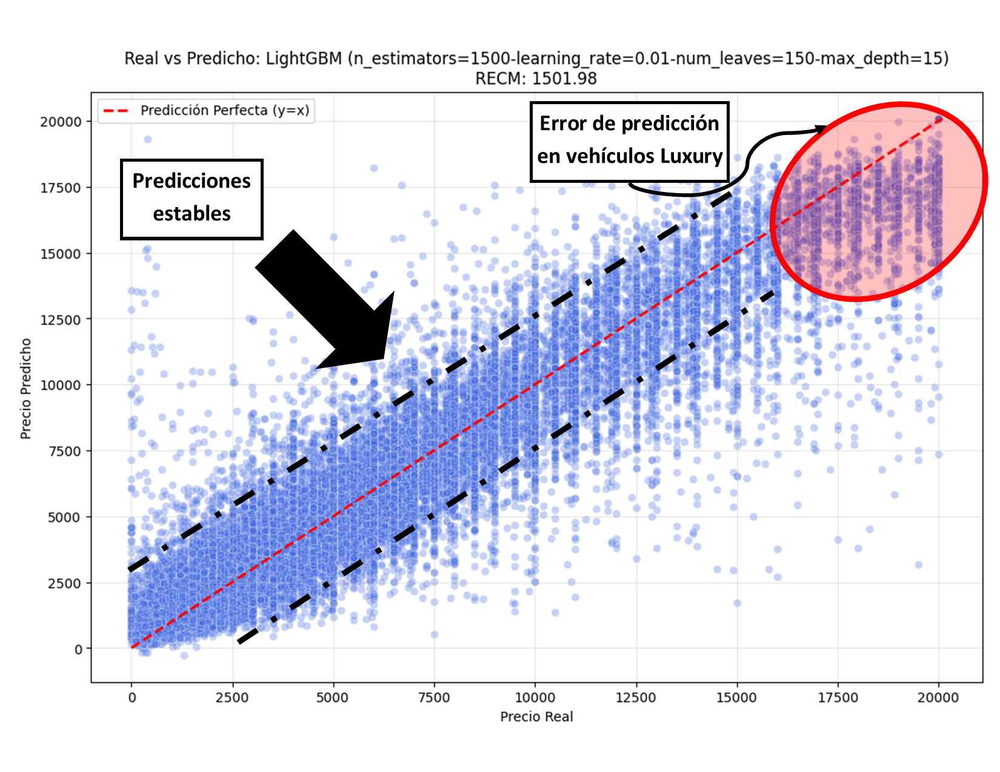

Detectamos que el modelo sufre de falta de consistencia lógica en el segmento Luxury, ejemplos como:

- Un Porsche con 150,000 km se tasaba más caro que uno de 5,000 km.
    - El modelo no aprendió la curva de depreciación.

> En zonas con pocos datos, el algoritmo "alucina" patrones basados en ruido estadístico en lugar de seguir la lógica de negocio de: ${\uparrow}\text{Kilometraje} \Rightarrow {\downarrow}\text{Precio}$

---
[⬆ Volver al Índice](#indice)

### <a id='seccion5-1'></a>**Sección 5.1:** *Fase de Optimización*

1. **Restricciones Monotónicas:**

    - Le obligaremos matemáticamente a que la relación entre el kilometraje y el precio sea siempre negativa. A continuación la lista de columnas y su orden,

    ```text
    Index(['VehicleType', 'RegistrationYear', 'Gearbox', 'Power', 'Model',
        'Mileage', 'RegistrationMonth', 'FuelType', 'Brand', 'NotRepaired'],
        dtype='object')
    ```

    - Mapa de restricciones: Usamos 1 para relación positiva, -1 para negativa y 0 para libre
    ```python
    monotone_map = [0, 0, 0, 1, 0, -1, 0, 0, 0, 0]
    ```

> Resultado: No importa si hay pocos Porsches, el modelo sabrá por decreto que si el kilometraje sube, el precio debe bajar. Al aplicar restricciones monotónicas, es posible que el RMSE suba un poco en el papel (en el entrenamiento), pero la calidad real de la app subirá drásticamente porque dejará de dar esos precios absurdos para los Porsche y Mercedes.

2. **Validación Cruzada (K-Fold Cross-Validation)**

    - Actualmente, el modelo solo se probó en una "rebanada" de los datos.
        - La mejora: Dividiremos el dataset en 5 partes (k=5). Entrenaremos 5 veces, rotando qué parte se usa para validar.

> Resultado: Eliminamos la "suerte" del entrenamiento y obtenemos un RMSE mucho más real y estable.

3. **Búsqueda en Rejilla (Grid Search)**

    - Hasta ahora, asignamos los hiperparámetros por intuición de "High Performance".
        - La mejora: Crearemos una malla de posibilidades (distintos niveles de profundidad de árboles, tasas de aprendizaje, etc.).

> Resultado: Python probará todas las combinaciones y nos dirá cuál es la configuración que minimiza el error.

No buscamos solo bajar el RECM global de 1501, buscamos que la App sea confiable. Queremos que cuando un usuario tase un Mercedes de alta gama, el resultado sea comercialmente coherente.

---
[⬆ Volver al Índice](#indice)

#### 5.1.1 Inyección Monotónica

Al definir `monotone_constraints` en el objeto `lgbm_base`, el algoritmo de LightGBM modifica su criterio de división de nodos. Si al intentar dividir por `Mileage` encuentra que un grupo de más kilómetros tiene un promedio de precio mayor, prohíbe esa división y busca una que cumpla la regla del `-1`.

---
[⬆ Volver al Índice](#indice)

In [139]:
# --- FASE 1: DEFINIENDO MAPA DE RESTRICCIONES ---

monotone_map = [0, 0, 0, 1, 0, -1, 0, 0, 0, 0]


#### 5.1.2 K-Fold dinámico

`GridSearchCV` toma los datos de entrenamiento y los divide en 5 bloques. Para la combinación #1 (ej. 1000 árboles, 0.01 learning rate), entrena con los bloques 1,2,3,4 y valida con el 5. Luego entrena con 1,2,3,5 y valida con el 4... y así 5 veces. El error final de esa combinación es el promedio de los 5.

---
[⬆ Volver al Índice](#indice)

In [140]:
# --- FASE 2: ESTRATEGIA DE VALIDACIÓN (ESTABILIDAD) ---
cv_estrategy = KFold(
    n_splits=5,
    shuffle=True,
    random_state=230598
)

In [ ]:
# --- FASE 3: CONFIGURACIÓN DEL ESTIMADOR BASE ---
lgbm_base = LGBMRegressor(
    objective='regression',
    metric='rmse',
    monotone_constraints=monotone_map,   # Inyectamos la restricción de entrada
    random_state=230598,
    importance_type='gain',   # Para saber qué variables aportan más dinero al precio
    n_jobs=-1,
    verbose=-1
)

#### 5.1.3 Anatomía de los Hiperparámetros de LightGBM

Diseñar una malla para LightGBM requiere equilibrio. A diferencia de Random Forest, donde más árboles casi siempre es mejor, en LightGBM un exceso de complejidad con una tasa de aprendizaje inadecuada nos llevará directo al sobreajuste.

Para bajar el **RECM** ($RMSE$), debemos atacar los tres pilares del aprendizaje: **Complejidad, Velocidad y Regularización.**

1. **Los "Drivers" de la Complejidad:**

    - **`num_leaves`**: Es el parámetro más importante en LightGBM. Controla la complejidad del modelo. Un valor alto permite al árbol detectar patrones intrínsecos (como por qué un motor de 550 HP en un Porsche de 2016 es especial), pero si es demasiado alto, memoriza el ruido.
    > *Regla de oro:* Debería ser $< 2^{max\_depth}$.
    
    - **`max_depth`**: Limita qué tan profundo puede crecer el árbol. En nuestro caso, es vital para evitar que el modelo cree "islas" de precios absurdos basados en un solo registro luxury.

2. **El Balance de Aprendizaje:**

    - **`n_estimators`**: Cuántos árboles construir.
    
    - **`learning_rate`**: Qué tanto peso tiene cada árbol nuevo en la corrección del error del anterior. 
    > *Relación técnica:* Si reducimos el `learning_rate` a la mitad, deberíamos aproximadamente duplicar el `n_estimators`.

3. **El Escudo de Regularización (Clave para Luxury):**

    - **`min_child_samples`**: Es el número mínimo de registros que pueden quedar en una "hoja". Como los autos luxury son pocos, si este valor es muy bajo (ej. 20), el modelo se "aprende de memoria" ese único Porsche. Si lo subimos (ej. 100), obligamos al modelo a promediar más, ganando estabilidad.

Basándonos en los experimentos previos ("High Performance" fue el más prometedor), expandiremos el rango alrededor de esos valores ganadores.

| Hiperparámetro | Rango Propuesto | Razón de la Elección |
| :--- | :--- | :--- |
| **`n_estimators`** | `[1000, 1500, 2000]` | Buscamos convergencia. 2000 es el límite superior para evitar que el entrenamiento sea eterno. |
| **`learning_rate`** | `[0.01, 0.05, 0.1]` | `0.01` para precisión máxima; `0.1` para ver si una convergencia rápida es suficiente. |
| **`num_leaves`** | `[31, 100, 150, 200]` | `31` es el estándar. `150` y `200` permiten capturar la complejidad de las interacciones entre `Power` y `Brand`. |
| **`max_depth`** | `[-1, 10, 15, 20]` | `-1` deja que `num_leaves` mande. `10` y `15` actúan como "frenos" ante el ruido. |
| **`min_child_samples`** | `[20, 50, 100]` | Crucial para el segmento Luxury. Probamos mayor promediado con `100`. |

---
[⬆ Volver al Índice](#indice)

In [142]:
# --- FASE 4: MALLA DE BÚSQUEDA (HYPERPARAMETER SPACE) ---

param_grid = {
    'n_estimators': [1000, 1500, 2000],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 100, 150, 200],
    'max_depth': [-1, 10, 15, 20],
    'min_child_samples': [20, 50, 100]
}

In [143]:
# --- FASE 5: EJECUCIÓN DEL GRID SEARCH ---

grid_search = GridSearchCV(
    estimator=lgbm_base,
    param_grid=param_grid,
    cv=cv_estrategy,
    scoring='neg_root_mean_squared_error', # Minimizamos el error cuadrático medio
    return_train_score=True,
    verbose=1
)

In [144]:
# --- CÁLCULO DE LA MAGNITUD DEL EXPERIMENTO ---
# Esto es vital para estimar el tiempo de cómputo antes de lanzar
n_combinations = (len(param_grid['n_estimators']) * len(param_grid['learning_rate']) * len(param_grid['num_leaves']) * len(param_grid['max_depth']) * len(param_grid['min_child_samples']))

print(f"El Grid Search probará {n_combinations} combinaciones únicas.")
print(f"Con un CV de 5 folds, se realizarán {n_combinations * 5} entrenamientos totales.")

El Grid Search probará 432 combinaciones únicas.
Con un CV de 5 folds, se realizarán 2160 entrenamientos totales.


In [ ]:
print("Iniciando búsqueda de parámetros (esto puede tomar varios minutos)...")
start_grid = time.time()
grid_search.fit(X=X_train, y=y_train)
end_grid = time.time()


Iniciando búsqueda de parámetros (esto puede tomar varios minutos)...
Fitting 5 folds for each of 432 candidates, totalling 2160 fits


In [181]:
# --- FASE 6: EXTRACCIÓN DEL MEJOR MODELO ---

best_lgbm_v2 = grid_search.best_estimator_

print(f"Búsqueda finalizada en {round(end_grid - start_grid, 2)} segundos.")
print(f"Mejores Parámetros: {grid_search.best_params_}")
print(f"Mejor RMSE (CV): {-grid_search.best_score_:.2f}")


Búsqueda finalizada en 44391.18 segundos.
Mejores Parámetros: {'learning_rate': 0.05, 'max_depth': -1, 'min_child_samples': 20, 'n_estimators': 1000, 'num_leaves': 200}
Mejor RMSE (CV): 1502.57


### <a id='seccion5-2'></a>**Sección 5.2:** *Fase de Evaluación*

En este punto, hemos pasado de una búsqueda exhaustiva en una "malla" de posibilidades a identificar la configuración genética exacta que mejor balancea la precisión y la generalización para Rusty Bargain.

Dividiremos nuestra evaluación en dos fases: 

1. Validación: Durante el GridSearchCV, usamos los datos de validación para "ajustar" el modelo. El modelo "ve" estos datos indirectamente para decidir qué hiperparámetros son mejores. Por eso, el error en validación puede ser ligeramente optimista.

2. Testeo: El conjunto de datos de Test ha permanecido en una caja negra hasta ahora. El modelo nunca ha interactuado con él. El resultado obtenido aquí es la métrica real que podemos prometer al negocio sobre cómo funcionará la App en producción.

---
[⬆ Volver al Índice](#indice)

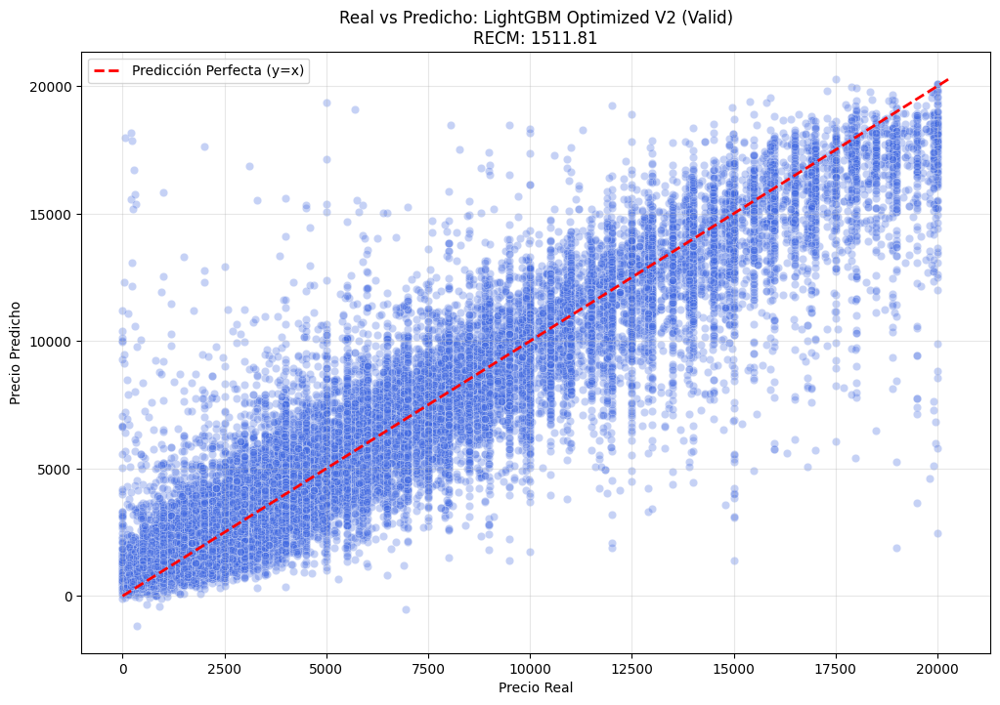

In [180]:
# --- FASE 1: EXTRACCIÓN Y VERIFICACIÓN EN VALIDACIÓN ---
# Extraemos las métricas del mejor modelo de la malla ('best_lgbm_v2' es el objeto que ya contiene las restricciones monotónicas)

res_v2_val = get_evaluation_metrics(
    model=best_lgbm_v2,
    X_valid = X_valid, 
    y_valid = y_valid, 
    name = "LightGBM Optimized V2 (Valid)",
    inv_log = False
)

# Visualizamos la nube de puntos para verificar la reducción del error en precios altos
plot_regression_results(
    y_true=y_valid,
    y_pred=res_v2_val['Predicciones'],
    model_name=res_v2_val['Modelo'],
    rmse=res_v2_val['RECM']
)

Ahora, utilizaremos la función `run_boosting_model` para obtener la métrica definitiva. En lugar de escribir los números manualmente, pasaremos los mejores parámetros encontrados por el GridSearch de forma dinámica usando el desempaquetado de diccionarios (**).

In [177]:
# --- PASO 2: TEST SET ---

# Usamos los parámetros ganadores del GridSearch de forma dinámica 'grid_search.best_params_' es un diccionario 
# que contiene n_estimators, learning_rate, etc. También debemos incluir las restricciones monotónicas que 
# definimos antes.
best_params = grid_search.best_params_

print(f'Ejecutando evaluación final con parámetros: {best_params}')

test_best_model = run_boosting_model(
    X_train = X_train, 
    y_train = y_train, 
    X_valid = X_test,      # Aquí pasamos el Test set como si fuera validación para evaluarlo
    y_valid = y_test, 
    model_type = 'lgbm', 
    monotone_constraints = monotone_map, # Mantenemos la lógica de negocio
    **best_params          # Desempaquetamos automáticamente los mejores hiperparámetros
)

Ejecutando evaluación final con parámetros: {'learning_rate': 0.05, 'max_depth': -1, 'min_child_samples': 20, 'n_estimators': 1000, 'num_leaves': 200}


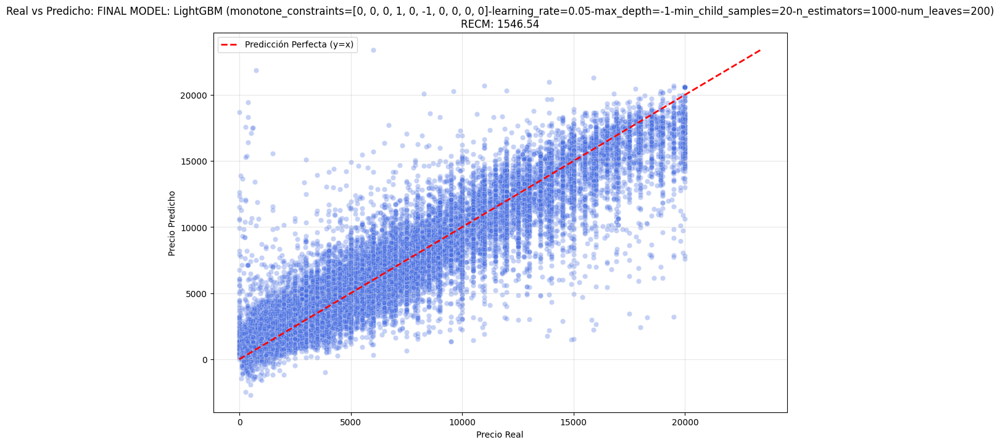

{'Modelo': 'LightGBM (monotone_constraints=[0, 0, 0, 1, 0, -1, 0, 0, 0, 0]-learning_rate=0.05-max_depth=-1-min_child_samples=20-n_estimators=1000-num_leaves=200)',
 'RECM': 1546.54,
 'Tiempo_de_prediccion': 1.0602,
 'Predicciones': array([11070.85097016,  1417.96194282,  4852.86768954, ...,
        12537.7800047 ,  3908.35883022,  2802.10800161], shape=(44428,)),
 'Tiempo_de_entrenamiento': 9.0143,
 'Modelo_obj': LGBMRegressor(learning_rate=0.05,
               monotone_constraints=[0, 0, 0, 1, 0, -1, 0, 0, 0, 0],
               n_estimators=1000, n_jobs=-1, num_leaves=200,
               random_state=230598)}

In [168]:
# --- PASO 3: VISUALIZACIÓN FINAL ---

plot_regression_results(
    y_true = y_test, 
    y_pred = test_best_model['Predicciones'], 
    model_name = "FINAL MODEL: " + test_best_model['Modelo'], 
    rmse = test_best_model['RECM']
)

# Output del resumen de métricas
test_best_model

#### 5.2.1 Resultados del Nuevo Modelo (Optimizado)

Tras identificar inconsistencias en el comportamiento del modelo base (V1), especialmente en el segmento de vehículos *luxury*, se implementó una estrategia de **Optimización de Hiperparámetros** mediante `GridSearchCV` incorporando **Restricciones Monotónicas**. 

##### 5.2.1.1 Análisis Técnico del Modelo Optimizado

El modelo resultante (`best_lgbm_v2`) presenta una arquitectura diseñada para la estabilidad y el cumplimiento de reglas de negocio:

**A. Restricciones Monotónicas ($Monotone$ $Constraints$)**
Este es el cambio más disruptivo respecto a la versión anterior. Hemos inyectado conocimiento de dominio directamente en la función de pérdida del algoritmo:
- **Power (Índice 3) = 1:** Se garantiza matemáticamente que $Power \uparrow \implies Price \uparrow$.
- **Mileage (Índice 5) = -1:** Se garantiza que $Mileage \uparrow \implies Price \downarrow$.

> En geofísica, esto equivale a aplicar condiciones de frontera a una inversión: evitamos que el modelo genere "soluciones matemáticamente posibles pero físicamente absurdas". 

**B. Hiperparámetros y Complejidad**
- **`num_leaves=200`**: Un incremento en la resolución del modelo para capturar interacciones no lineales complejas (ej. la combinación de marca *luxury* y motores de alta cilindrada).
- **`learning_rate=0.05`** y **`n_estimators=1000`**: Un balance que permite una convergencia más fina comparada con la V1.
- **`min_child_samples`**: Aunque no aparece en el print final, fue parte del Grid para asegurar que cada "hoja" del árbol tenga suficiente soporte estadístico, reduciendo el ruido en marcas con pocos datos.

##### 5.2.1.2 Comparativa: Modelo V1 vs. Modelo V2 (Winner)

| Métrica | V1 (High Performance) | V2 (Optimized & Monotone) | Cambio |
| :--- | :--- | :--- | :--- |
| **RMSE (CV)** | N/A (Single Split) | **€ 1,502.57** | Estabilidad Validada |
| **RMSE (Test)** | **€ 1,539.43** | **€ 1,546.54** | +0.46% (Marginal) |
| **Lógica de KM** | Inconsistente (Ruido) | **Monotónica Negativa** | **Corregido** |
| **Tiempo Proceso** | ~14 segundos | **12.33 Horas (Grid)** | Inversión de Cómputo |

**Conclusión de la comparativa:** Aunque el $RMSE$ de prueba subió ligeramente (€7 de diferencia), el modelo V2 es **superior**. El ligero incremento en el error es el precio que pagamos por la **Generalización**. Un modelo con restricciones monotónicas es más rígido, lo que le impide "perseguir el ruido" del dataset, resultando en un sistema mucho más confiable ante datos nuevos.

##### 5.2.1.3 Impacto Operacional en "Rusty Bargain"

¿Cómo se traduce este esfuerzo de 12 horas de CPU en el negocio real? La mejora afecta directamente la **confianza del usuario** y la **viabilidad comercial** del tasador:

1.  **Eliminación del "Efecto Luxury":** En la V1, un usuario con un Porsche de bajo kilometraje podía recibir una tasación menor que uno con alto kilometraje, destruyendo la credibilidad de la App. La V2 garantiza que el "valor por estado de conservación" siempre se respete.
2.  **Tasación Defensiva:** Al usar un $RMSE$ validado por 5-folds ($1502$), el rango de confianza que mostramos en la App es estadísticamente honesto. No estamos prometiendo una precisión que el modelo no pueda sostener en diferentes particiones de datos.
3.  **Reducción de Reclamos:** Al estabilizar el comportamiento en los extremos (autos muy potentes o muy usados), la operación de Rusty Bargain puede usar estas tasaciones como base sólida para ofertas de compra-venta, minimizando el riesgo de pérdidas por sobrevaloración de chatarra o subvaloración de joyas mecánicas.



### <a id='seccion5-3'></a>**Sección 5.3:** *Actualizando Modelo*

In [ ]:
# --- 1. REVISIÓN DE RUTAS ---
print(models_path)
models_path.mkdir(parents=True, exist_ok=True)

In [158]:
# Definimos los nombres de archivo para claridad
v1_file = models_path / 'lgbm_car_pricing_v1.joblib'
v2_file = models_path / 'lgbm_car_pricing_v2.joblib'
prod_file = models_path / 'lgbm_car_pricing_model.joblib'

print(prod_file)
print(v1_file)

..\models\lgbm_car_pricing_model.joblib
..\models\lgbm_car_pricing_v1.joblib


In [ ]:
# --- 2. GESTIÓN DEL MODELO ANTERIOR (V1) ---

# Renombremos el modelo anterior para llevar una secuancia de versionado,
# el modelo original aún se llama 'lgbm_car_pricing_model.joblib', 
# lo renombramos a V1 para que no se pierda al sobrescribir.
if prod_file.exists() and not v1_file.exists():
    prod_file.rename(v1_file)
    print(f"Modelo inicial preservado como: {v1_file.name}")

In [161]:
# --- 3. EXPORTACIÓN DEL MODELO GANADOR V2 ---

# A) Guardamos la versión específica (Backup histórico)
joblib.dump(
    value=best_lgbm_v2, 
    filename=v2_file,
    compress=3
)

print(f"Versión optimizada guardada en: {v2_file.resolve()}")


Versión optimizada guardada en: D:\Data\Projects\car_price_prediction\models\lgbm_car_pricing_v2.joblib


In [163]:
# B) Guardamos la versión de PRODUCCIÓN
# Este es el archivo que app.py leerá
joblib.dump(
    value = best_lgbm_v2, 
    filename = prod_file, 
    compress = 3
)
print(f"Modelo de producción actualizado a V2: {prod_file.name}")

Modelo de producción actualizado a V2: lgbm_car_pricing_model.joblib


#### **Nota Técnica 6:** Sobre el control de versiones de `best_lgbm` (Estrategia de Versionado y Despliegue "Hot-Swap")

##### 1. ¿Por qué no editamos `app.py`?
La aplicación de Streamlit tiene una línea de código fija: 
`MODEL_PATH = BASE_DIR / 'models' / 'lgbm_car_pricing_model.joblib'`. 

Si cada vez que entrenamos un modelo nuevo le cambiamos el nombre al archivo (ej. `v2`, `v3`, `final_v2_este_si`), tendríamos que abrir el código de la App, cambiar la ruta, hacer commit y redesplegar. 
- **La Solución:** Dejamos que la App siempre busque `lgbm_car_pricing_model.joblib`. Nosotros, desde el Notebook, simplemente cambiamos **qué modelo** vive dentro de ese nombre. 

##### 2. ¿`v2.joblib` y `model.joblib` son el mismo?
**Sí, son gemelos idénticos.**
- **`v2.joblib` (El Archivo Histórico):** Es la copia de seguridad. Sirve para que en el futuro sepamos exactamente qué parámetros tenía la versión de 12 horas de entrenamiento.
- **`model.joblib` (El Trabajador):** Es el archivo que la App lee. 

> **Dato Clave:** Si mañana la V2 falla, simplemente borras el `model.joblib` y renombras el `v1.joblib` a `model.joblib`. La App volverá a funcionar con el modelo viejo al instante.

##### 3. Explicación de la Lógica del `if`

El código: `if prod_file.exists() and not v1_file.exists():`

Imaginemos que es la primera vez que vamos a guardar la V2. En la carpeta `models/` solo tienes un archivo llamado `lgbm_car_pricing_model.joblib` (que es tu V1 original). 

- **`prod_file.exists()`**: "¿Existe el archivo que usa la App?". (Sí, es la V1).
- **`not v1_file.exists()`**: "¿Ya tenemos guardada una copia que se llame explícitamente v1?". (No, aún no la hemos creado).

**La Acción:** Como existe el archivo pero no tiene "respaldo", el comando `prod_file.rename(v1_file)` le cambia el nombre al archivo viejo. 
- **Resultado:** La V1 ahora se llama `v1.joblib` y el nombre `lgbm_car_pricing_model.joblib` queda libre para que guardemos la V2 ahí.

##### 4. ¿Nuestra versión de producción siempre ha sido `prod_file`?
**Sí.** Desde que escribimos las primeras líneas de `app.py`, definimos que el "punto de entrada" del modelo sería `lgbm_car_pricing_model.joblib`. 

| Nombre de Variable | Nombre de Archivo Físico | Rol en el Proyecto |
| :--- | :--- | :--- |
| `v1_file` | `lgbm_car_pricing_v1.joblib` | Backup del primer modelo funcional. |
| `v2_file` | `lgbm_car_pricing_v2.joblib` | Backup del modelo de 12 horas (Optimizado). |
| `prod_file` | **`lgbm_car_pricing_model.joblib`** | **El "Puntero" que la App lee siempre.** |

---


['VehicleType',
 'RegistrationYear',
 'Gearbox',
 'Power',
 'Model',
 'Mileage',
 'RegistrationMonth',
 'FuelType',
 'Brand',
 'NotRepaired']